# Dependencies

In [ ]:
%reset  -f
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_probability as tfp
from tensorflow.keras import layers
import scipy.stats as si
from scipy.stats import norm
tf.keras.backend.set_floatx('float32')
from google.colab import drive
import os
import datetime
import csv
import time
import os
import random
import pickle
from datetime import datetime
from matplotlib.lines import Line2D



# Model Class - defining the mathematical problem


In [ ]:
# @title
################ this code is for the general LQ problems with any possible dimensions (dim_x, dim_u, dim_w)
class ModelClass:
  def __init__(self, model_parameters):

    self.model = model_parameters[0]    # shape=[d,d]
    self.h = model_parameters[1]
    self.d = model_parameters[2]
    if self.model == 'GBM':
      self.r = model_parameters[3]  #  risk free rate
      self.sigma = model_parameters[4] # Volatility vector
      self.L = model_parameters[5] # cholesky decomposition of correlation matrix


  def F_X(self, x, dW):
    #dW_cor = dW @ self.L.T  # Apply correlation
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    x = x * tf.exp((self.r - 0.5 * self.sigma**2) * self.h + self.sigma * dW_cor)
    return x

  def F_X_EM(self, x, dW):
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    x = x + self.r * x * self.h + self.sigma * x * dW_cor
    return x

  def F_Y(self, x, y, vx, dW, ind_X = None, ind_Z = None, d_p= None, y_pos = False):
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    if ind_X is not None:
      x = tf.gather(x, ind_X, axis=1)  # Use tf.gather for tensor-based indexing
      vx = vx[:, ind_Z: ind_Z + d_p]
      dW_cor = tf.gather(dW_cor, ind_X, axis=1)
      sig = tf.gather(self.sigma, ind_X)
    y = y + self.r * y * self.h + tf.reduce_sum(sig * x * vx * dW_cor, axis=1)
    if y_pos:
      y = tf.maximum(y, 0)
    return y

  def F_MVA(self, x, mva, mva_vx, im, dW):
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    r_IM_lending = 0.065
    r_IM_borrowing = 0.05
    mva = mva - ( (self.r - r_IM_lending) * im[:,1] - r_IM_borrowing * im[:,0] ) * self.h  + self.r * mva * self.h + tf.reduce_sum(self.sigma * x * mva_vx * dW_cor, axis=1)
    return mva

  def F_ColVA(self, x, v, colva, colva_vx, dW):
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    r_col_lending = 0.085
    r_col_borrowing = 0.075
    C = v * 0.5 # collateral as a fraction of clean value
    C_plus = tf.maximum(v - C, 0.0)
    C_minus = tf.minimum(v - C, 0.0)
    colva = colva - ( (self.r - r_col_lending) * C_plus + (self.r - r_col_borrowing) * C_minus ) * self.h  + self.r * colva * self.h + tf.reduce_sum(self.sigma * x * colva_vx * dW_cor, axis=1)
    return colva

  def F_CVA(self, x, cva, cva_vx, dW):
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    cva = cva + self.r * cva * self.h + tf.reduce_sum(self.sigma * x * cva_vx * dW_cor, axis=1)
    return cva

  def F_FVA(self, x, v, im, xva, fva, fva_vx, dW):
    dW_cor = dW @ tf.transpose(self.L)  # Apply correlation
    r_fva_lending = 0.065
    r_fva_borrowing = 0.075
    colva = xva[:,0]
    mva = xva[:,1]
    cva = xva[:,2]
    im_tc = im[:,1]
    C = v * 0.5 # collateral as a fraction of clean value
    F_plus =  tf.maximum(v - C - im_tc + colva + mva - cva,0 )
    F_minus =  tf.minimum(v - C - im_tc + colva + mva - cva,0 )
    fva = fva - ( (self.r - r_fva_lending) * F_plus + (self.r - r_fva_borrowing) * F_minus ) * self.h  + self.r * fva * self.h + tf.reduce_sum(self.sigma * x * fva_vx * dW_cor, axis=1)
    return fva


  def g(self, x, K, ind_X=None, d_p=None):
    if ind_X is not None:
        x = tf.gather(x, ind_X, axis=1)  # Use tf.gather for tensor-based indexing
        d = d_p
    else:
        d = self.d

    # Perform calculations in float64 for precision
    d = tf.cast(d, tf.float64)
    x = tf.cast(x, tf.float64)
    K = tf.cast(K, tf.float64)

    # Calculate the product and geometric mean
    prod = tf.reduce_prod(x, axis=1, keepdims=True)
    geom_mean = tf.pow(prod, 1/d)

    # Calculate the output and then cast it to float32
    g = tf.maximum(geom_mean - K, 0.0)

    # Cast the final output to float32
    g = tf.cast(g, tf.float32)

    return g


  def g_2(self, x, K, tau_source, ind_X=None, d_p=None):
    if ind_X is not None:
        x = tf.gather(x, ind_X, axis=1)  # Use tf.gather for tensor-based indexing
        d = d_p
    else:
        d = self.d

    # Perform calculations in float64 for precision
    d = tf.cast(d, tf.float64)
    x = tf.cast(x, tf.float64)
    K = tf.cast(K, tf.float64)

    # Calculate the product and geometric mean
    prod = tf.reduce_prod(x, axis=1, keepdims=True)
    geom_mean = tf.pow(prod, 1/d)

    # Calculate the output and then cast it to float32
    g = tf.maximum(geom_mean - K, 0.0)

    tau_source_expanded = tf.expand_dims(tau_source, axis=1)
    # Set output to zero for elements where tau_source != 0
    g = tf.where(tf.equal(tau_source_expanded, 2), g, 0*g)

    # Cast the final output to float32
    g = tf.cast(g, tf.float32)

    return g

  def BS(self, x, K, T, r, sigma, option_type="call"):
    # Ensure x is a NumPy array
    x = np.array(x)

    # Calculate d1 and d2
    d1 = (np.log(x / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)

    if option_type == "call":
        prices = (x * si.norm.cdf(d1, 0.0, 1.0) - K * np.exp(-r * T) * si.norm.cdf(d2, 0.0, 1.0))
        deltas = si.norm.cdf(d1, 0.0, 1.0)
        if T < 0:
          prices = np.zeros_like(x)
          deltas = np.zeros_like(x)
    elif option_type == "put":
        prices = (K * np.exp(-r * T) * si.norm.cdf(-d2, 0.0, 1.0) - x * si.norm.cdf(-d1, 0.0, 1.0))
        deltas = -si.norm.cdf(-d1, 0.0, 1.0)
    else:
        raise ValueError("option_type must be 'call' or 'put'")

    return prices, deltas


  def BS_tf(self, x, K, T, r, sigma, option_type="call"):
    # Ensure x is a TensorFlow tensor
    x = tf.cast(x, tf.float32)
    K = tf.cast(K, tf.float32)
    T = tf.cast(T, tf.float32)
    r = tf.cast(r, tf.float32)
    sigma = tf.cast(sigma, tf.float32)

    # Calculate d1 and d2 using TensorFlow operations
    d1 = (tf.math.log(x / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * tf.sqrt(T))
    d2 = d1 - sigma * tf.sqrt(T)

    # Calculate the CDF of the standard normal distribution
    norm_cdf_d1 = tfp.distributions.Normal(0, 1).cdf(d1)
    norm_cdf_d2 = tfp.distributions.Normal(0, 1).cdf(d2)

    if option_type == "call":
        prices = (x * norm_cdf_d1 - K * tf.exp(-r * T) * norm_cdf_d2)
        deltas = norm_cdf_d1
    elif option_type == "put":
        norm_cdf_neg_d1 = tfp.distributions.Normal(0, 1).cdf(-d1)
        norm_cdf_neg_d2 = tfp.distributions.Normal(0, 1).cdf(-d2)
        prices = (K * tf.exp(-r * T) * norm_cdf_neg_d2 - x * norm_cdf_neg_d1)
        deltas = -norm_cdf_neg_d1
    else:
        raise ValueError("option_type must be 'call' or 'put'")

    return prices, deltas




# Parameter inizialisation - parameters for the mathematical and the machine learning models

In [ ]:

# NN params
num_epochs = 10
batch_size = 2**11 #2**12
initial_lr = 0.005
neurons = [100,100,100]
M_train = 2**20  # Number training of samples

# Parameters
M = 2**12  # Number eval of samples
N = 200  # Number of time steps
d = 5  # Number of dimensions
one_d_test = False
two_d_test = False


if one_d_test:
  ### 1-d test ###
  d = 1
  ################
if two_d_test:
  ### 2-d test ###
  d = 2
  ################

T = 1.0  # Total time
t = np.linspace(0,T,N+1)
h = t[1] - t[0]
r = 0.05
x0 = np.ones([M_train,d])
x0_MC = np.ones([M,d])
#sigma = np.array([0.3, 0.25, 0.2])  # Volatility vector
#corr_matrix = np.array([
#    [1.0, 0.5, -.3],
#    [0.5, 1.0, 0.4],
#    [-0.3, 0.4, 1.0]
#])  # Correlation matrix

sigma = tf.constant([0.2, 0.25, 0.25, 0.25, 0.3], dtype=tf.float32)
corr_matrix = tf.constant([
    [1.0, 0.9, 0.2, 0.5, 0.1],
    [0.9, 1.0, 0.4, 0.3, 0.2],
    [0.2, 0.4, 1.0, 0.2, 0.75],
    [0.5, 0.3, 0.2, 1.0, 0.35],
    [0.1, 0.2, 0.75, 0.35, 1.0]
], dtype=tf.float32)

if one_d_test:
  ### 1-d test ###
  sigma = np.array([0.1])  # Volatility vector
  corr_matrix = np.array([
      [1.0]
  ])  # Correlation matrix
  ################
if two_d_test:
  ### 2-d test ###
  sigma = np.array([0.1, 0.2])  # Volatility vector
  corr_matrix = np.array([
      [1.0, 0.4],
      [0.4, 1.0]
  ])  # Correlation matrix
L = np.linalg.cholesky(corr_matrix)

## Portfolio parameters ##
#ind_X = [[0,1,2], [0], [1], [2]] # which risky assets derivaite i depends on
ind_X = [[0,1,2,3,4], [1,2,3,4],[0,2,3,4], [0,1,3,4],[0,1,2,4],[0,1,2,3],[0,1,2], [0,1,3], [0,1,4], [0,2,3],[0,2,4], [1,2,3], [1,2,4], [2,3,4],[0,1], [1,2], [0,2], [0], [1], [2], [3], [4], [0,1], [1,2], [0,2], [0],[0,1,2,3,4],[0,1,2,3,4],[0,1,2,3,4], [1,2,3,4], [0,1,2], [0,1], [1,2]] # which risky assets derivaite i depends on
#ind_X = [[0,1,2,3,4]] # which risky assets derivaite i depends on

if one_d_test:
  ### 1-d test ###
  ind_X = [[0]] # which risky assets derivaite i depends on
  ################
if two_d_test:
  ### 2-d test ###
  ind_X = [[0,1]] # which risky assets derivaite i depends on
  ################

d_p = [] # dimension of each derivative
for i in range(len(ind_X)):
  d_p.append(len(ind_X[i]))

P_Y = len(ind_X)  # number of derivatives in portfolio
P_Z = sum(d_p) # dimension for Z-process
#K_p = np.array([1.05, 1.05, 1.05, 1.05])  # Strike prices
K_p = np.array([1.05, 1.1, 1.05, 1.05,0.7, 0.7, 0.75, 0.75,1.0,0.9, 0.8, 0.9, 1.1, 1.05, 0.85, 0.9, 0.9, 1.05,1.0, 1.0,0.9, 0.95, 1.05,0.7, 0.7, 0.75, 0.75,1.0,0.9, 0.8, 0.9, 1.1, 1.05])  # Strike prices
if one_d_test:
  ### 1-d test ###
  K_p = np.array([1.25])  # Strike prices
  ################
if two_d_test:
  ### 2-d test ###
  K_p = np.array([1.2])  # Strike prices
  ################

N_p = np.array([N, N, N, N-10*int(N/50), N-10*int(N/50), N-20*int(N/50), N-20*int(N/50), N-30*int(N/50), N-30*int(N/50), N-40*int(N/50), N-40*int(N/50),N, N, N, N-15*int(N/50), N-15*int(N/50), N-25*int(N/50), N-25*int(N/50), N-35*int(N/50), N-35*int(N/50), N-45*int(N/50), N-45*int(N/50), N, N-15*int(N/50), N-15*int(N/50), N-25*int(N/50), N-25*int(N/50), N-35*int(N/50),N, N-10*int(N/50), N-10*int(N/50), N-20*int(N/50), N-20*int(N/50)]) # maturity time points
#N_p = np.array([N, N, N, N, N, N, N, N, N, N, N]) # maturity time points
if one_d_test:
  ### 1-d test ###
  N_p = np.array([N]) # maturity time points
  ################
if two_d_test:
  ### 2-d test ###
  N_p = np.array([N]) # maturity time points
T_p = t[N_p] # maturities

I_T_p = np.zeros((P_Y, N+1))
for i in range(P_Y):
    I_T_p[i, N_p[i]] = 1


ind_Z = [0] # index for derivatives in the Z-process
for i in range(1, len(d_p)):
  ind_Z.append(ind_Z[-1] + d_p[i-1])
portfolio_parameters = [P_Y, P_Z, ind_X, ind_Z, d_p, K_p]
##########################

model_parameters = ['GBM', h, d, r, sigma, L]

model = ModelClass(model_parameters)

x = []
x.append(x0_MC)
x_EM = x0_MC

MC_prices_t = np.zeros(P_Y)
for i in range(N):
  dW = np.random.normal(size=(M, d)) * np.sqrt(h)
  x.append(model.F_X(x[-1], dW))
  x_EM = model.F_X_EM(x_EM, dW)


print(K_p, d_p, ind_X)
MC_prices_0 = []
for p in range(P_Y):
  MC_prices_0.append(np.exp(-r*T_p[p])*np.mean(model.g(x[N_p[p]], K_p[p], ind_X[p], d_p[p])))
  print(np.exp(-r*T_p[p])*np.mean(model.g(x[N_p[p]], K_p[p], ind_X[p], d_p[p])))

MC_prices = np.stack(MC_prices_0)



[1.05 1.1  1.05 1.05 0.7  0.7  0.75 0.75 1.   0.9  0.8  0.9  1.1  1.05
 0.85 0.9  0.9  1.05 1.   1.   0.9  0.95 1.05 0.7  0.7  0.75 0.75 1.
 0.9  0.8  0.9  1.1  1.05] [5, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 5, 5, 5, 4, 3, 2, 2] [[0, 1, 2, 3, 4], [1, 2, 3, 4], [0, 2, 3, 4], [0, 1, 3, 4], [0, 1, 2, 4], [0, 1, 2, 3], [0, 1, 2], [0, 1, 3], [0, 1, 4], [0, 2, 3], [0, 2, 4], [1, 2, 3], [1, 2, 4], [2, 3, 4], [0, 1], [1, 2], [0, 2], [0], [1], [2], [3], [4], [0, 1], [1, 2], [0, 2], [0], [0, 1, 2, 3, 4], [0, 1, 2, 3, 4], [0, 1, 2, 3, 4], [1, 2, 3, 4], [0, 1, 2], [0, 1], [1, 2]]
0.06339893390274136
0.05055069827941776
0.06517619392894329
0.054226057072578854
0.31675686653024604
0.3133960776944574
0.26810044893697466
0.26188506635125114
0.05590883286847304
0.10925139218483018
0.20603695931453497
0.1498467127568455
0.05987107593997568
0.07907658279615525
0.19080277374843854
0.14701663985359173
0.1282073775415711
0.04631261795686419
0.06229262848337905
0.0636786

# Neural network class

In [ ]:
############## Define Neural Network Classes ##############
class SubNetwork(tf.keras.Model):   # 3 call methods, "call" for Vx, "second_call" for Vxx, "y0_call" for y0 used in deep DP
    def __init__(self, dim_x, dim_w, portfolio_pars, neurons, activation, use_batnorm = False, regu_cons=[0., 0.], ini_cons=None ):
        super(SubNetwork, self).__init__()
        self.d = dim_x
        self.m = dim_w
        self.neurons = neurons
        self.activation = activation
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.use_batnorm = use_batnorm
        self.regu_1 = tf.keras.regularizers.L2( l2=regu_cons[0] )   # should same as self.regu_1 = None
        self.regu_2 = tf.keras.regularizers.L2( l2=regu_cons[1] )
        if ini_cons == None:
          self.ini_1 = "glorot_uniform"
          self.ini_2 = "zeros"
        else:
          self.ini_1 = tf.keras.initializers.Constant(value=ini_cons[0])
          self.ini_2 = tf.keras.initializers.Constant(value=ini_cons[1])
        self.dense_layers1 = []       # 12 are for each call method below
        self.dense_layers2 = []
        self.batch_norm1 = []
        self.batch_norm2 = []
        for i in range(len(self.neurons)):
            self.dense_layers1.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.dense_layers2.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.batch_norm1.append( tf.keras.layers.BatchNormalization() )
            self.batch_norm2.append( tf.keras.layers.BatchNormalization() )
        self.dense_out1 = tf.keras.layers.Dense(self.P_Z, activation='linear', use_bias=True, \
                            kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2)
        self.dense_out2 = tf.keras.layers.Dense(self.P_Y, activation='linear', use_bias=True, \
                            kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2)
    def call(self, x_in):         # get z.
        x = x_in
        #x = tf.squeeze(x_in, axis=-1)     # x_in.shape =[B,d]
        for i in range(len(self.neurons)):
            x = self.dense_layers1[i](x)
            if self.use_batnorm:
              x = self.batch_norm1[i](x)
        x = self.dense_out1(x)
        return x    # output shape = [B,P_Z]
    def y0_call(self, x_in):     # get Y_0 = V(0, x_0)
        x = x_in
        #x = tf.squeeze(x_in, axis=-1)
        for i in range(len(self.neurons)):
            x = self.dense_layers2[i](x)
            if self.use_batnorm:
              x = self.batch_norm2[i](x)
        x = self.dense_out2(x)
        return x     # output shape = [B,P_Y]

class FullNetwork(tf.keras.Model):
    def __init__(self, N, h, dim_x, dim_w, portfolio_pars, neurons=[16,16,16], activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None):
        super(FullNetwork, self).__init__()
        self.N = N    # number of subNN
        self.h = h    # step size
        self.dim_x = dim_x
        self.dim_w = dim_w
        self.portfolio_parameters = portfolio_pars
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.neurons = neurons
        self.activation = activation
        self.use_batnorm = use_batnorm
        self.regu_cons = regu_cons
        self.ini_cons = ini_cons
        self.network = SubNetwork(dim_x=self.dim_x, dim_w=self.dim_w, portfolio_pars = self.portfolio_parameters, neurons=self.neurons, activation=self.activation, \
                                           use_batnorm=self.use_batnorm, regu_cons=self.regu_cons, ini_cons=self.ini_cons)
        self.y_0 = self.add_weight(name="y_0", shape=[self.P_Y], initializer=tf.keras.initializers.RandomUniform(minval=0.0, maxval=0.1), trainable=True)



    def call(self, x_input):    # input shape x=[B,d,1]
        ########## deep DP
        NNx = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNy = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)

        NNx = NNx.write(0, x_input)
        NNy = NNy.write(0, tf.broadcast_to(self.y_0, [batch_size, self.P_Y]))  # Broadcasting y_0

        for n in range(0, self.N):
          time_tensor = tf.fill([batch_size, 1], tf.cast(n * self.h, dtype=tf.float32))
          inp = tf.concat([NNx.read(n), time_tensor], axis=1)
          NNvx = NNvx.write(n, self.network( inp ))
          NNdW = tf.random.normal( shape = [batch_size,self.dim_w], mean=0, stddev=np.sqrt(self.h))
          NNx = NNx.write(n + 1, model.F_X_EM(NNx.read(n), NNdW))

          NNy_temp = []
          for p in range(0,self.P_Y):
            NNy_p = model.F_Y(NNx.read(n), NNy.read(n)[:,p], NNvx.read(n), NNdW, self.ind_X[p], self.ind_Z[p], self.d_p[p])
            NNy_temp.append(NNy_p)

          NNy = NNy.write(n + 1,tf.stack(NNy_temp, axis=1))

        # Initialize an empty list to store the individual losses
        individual_losses = []

        # Calculate each loss dynamically based on the length of MC_prices
        for i in range(len(MC_prices)):
          loss = tf.reduce_mean(NNy.read(0)[:, i]) / MC_prices[i]
          individual_losses.append(loss)

        # Calculate the final loss as before
        loss_final = 0
        for p in range(0, self.P_Y):
          loss_final += tf.reduce_mean((NNy.read(N_p[p])[:, p] - model.g(NNx.read(N_p[p]), self.K_p[p], self.ind_X[p], self.d_p[p])[:,0]) ** 2)

        # Return all the individual losses and the final loss
        return *individual_losses, loss_final




# Optimization of the neural network parameters (training)


Start of epoch 0


/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'sub_network', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Training loss at step 0: 1.1087
Seen so far: 2048 samples
The current learning rate is 0.0049980474
loss_1:  0.823181 MC_price_1:  0.06298815203737193
loss_2:  1.1112702 MC_price_2:  0.05030420506367703
loss_3:  1.2374972 MC_price_3:  0.06509198368197862
loss_4:  0.49530557 MC_price_4:  0.0534286534807805
loss_5:  0.20684159 MC_price_5:  0.31577306792056026
loss_6:  0.04839484 MC_price_6:  0.3119219472772008
loss_7:  0.37253973 MC_price_7:  0.2662580895914758
loss_8:  0.021270327 MC_price_8:  0.26242841321295646
loss_9:  0.23769347 MC_price_9:  0.05547095299202734
loss_10:  0.2451748 MC_price_10:  0.10759228193221987
loss_11:  0.35754445 MC_price_11:  0.2050519972221886
loss_12:  0.37715557 MC_price_12:  0.15081807178970902
loss_13:  0.4090319 MC_price_13:  0.06031353055350915
loss_14:  1.22857 MC_price_14:  0.07978391485204335
loss_15:  0.27035215 MC_price_15:  0.1877369138633855
loss_16:  0.40402043 MC_price_16:  0.14499356801711052
loss_17:  0.085169114 MC_price_17:  0.1258942654376

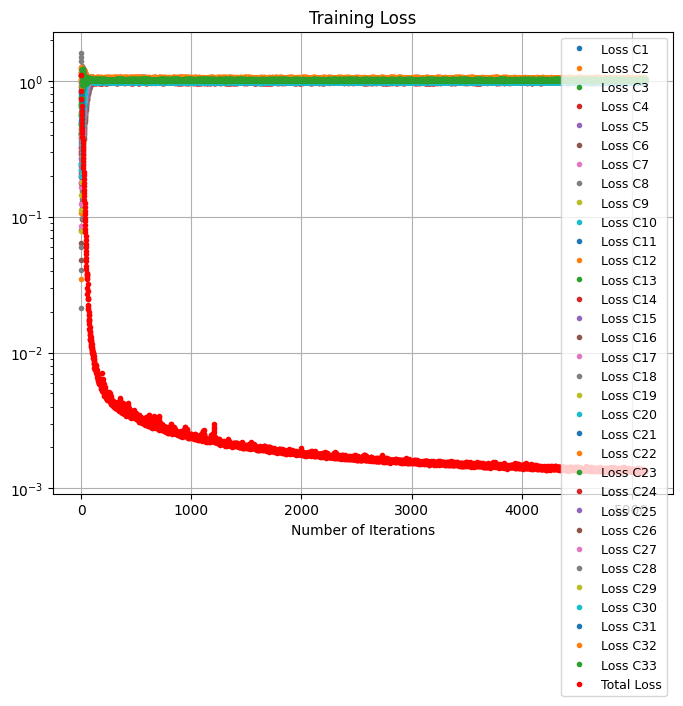

In [ ]:
# @title
####### set up parameters for the networks, by converting them to tensor.
x0_tf = tf.convert_to_tensor(x0, dtype=tf.float32)
sigma_tf = tf.convert_to_tensor(sigma, dtype=tf.float32)
L_tf = tf.convert_to_tensor(L, dtype=tf.float32)
model_parameters_tf = ['GBM', h, d, r, sigma_tf, L_tf]

P_Y_tf = tf.convert_to_tensor(P_Y, dtype=tf.int32)
P_Z_tf = tf.convert_to_tensor(P_Z, dtype=tf.int32)
ind_X_tf = tf.ragged.constant(ind_X, dtype=tf.int32)
ind_Z_tf = tf.convert_to_tensor(ind_Z, dtype=tf.int32)
d_p_tf = tf.convert_to_tensor(d_p, dtype=tf.int32)
K_p_tf = tf.convert_to_tensor(K_p, dtype=tf.float32)

portfolio_parameters_tf = [P_Y, P_Z, ind_X_tf, ind_Z_tf, d_p_tf, K_p_tf]


######################## customized train loop
# Create the full NN
model = ModelClass(model_parameters_tf)

# full_model = FullNetwork(N=N, h=h, dim_x=dim_x, dim_w=dim_w, model_num=model_num)
full_model = FullNetwork(N=N, h=h, dim_x=d, dim_w=d, portfolio_pars = portfolio_parameters_tf, \
            neurons=neurons, activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None)

# Prepare the training dataset
x_train = x0_tf    # shape = [M_train, dim_x, 1]
y_train = tf.zeros( [M_train, 1, 1] )
train_dataset = tf.data.Dataset.from_tensor_slices( (x_train, y_train) )
#train_dataset = train_dataset.shuffle(buffer_size=batch_size*10).batch(batch_size)  # buffer_size doesn't matter in this code
train_dataset = train_dataset.batch(batch_size)

loss_history = []
lr_history = []
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_lr, decay_steps=int(M_train/batch_size), decay_rate=tf.math.exp(-0.2), staircase=False)
optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
#optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule)

# customize loss function
def dummy_loss(y_true, y_model):
    # P_Y is the number of loss components, and the total number of elements will be P_Y + 1
    loss_list_dummy = [y_model[i] for i in range(P_Y + 1)]  # Collect the first P_Y losses
    return loss_list_dummy  # Return the full list of losses

# define train_step function (for gradient computation and parameters update)
@tf.function
def train_step(input_x, input_y):     # the forward propagation & parameters update in the train function
    with tf.GradientTape() as tape:
        fullmodel_output = full_model(input_x, training=True)   # compute model output
        loss_list = dummy_loss(input_y, fullmodel_output)    # get the loss list
        loss_value = loss_list[-1]                        # get the total loss value
    grads = tape.gradient(loss_value, full_model.trainable_weights)       # compute the gradients of loss wrt weights
    optimizer.apply_gradients(zip(grads, full_model.trainable_weights))    # update the weights
    return [loss_list, loss_value, grads]

# customized train loop

start = time.time()
for epoch in range(num_epochs):
  print("\nStart of epoch %d" % (epoch,))
  # Iterate over the batches of the dataset.
  for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):   # one step = one batch = one iteration
    output_train = train_step(x_batch_train, y_batch_train)
    loss_list = output_train[0]
    loss_list = [tensor.numpy() for tensor in loss_list]
    loss_history.append(loss_list)
    lr_history.append(lr_schedule(optimizer.iterations).numpy())
    loss_value = output_train[1]

    if step == 0:
      print("Training loss at step %d: %.4f" % (step, float(loss_value)) )
      print("Seen so far: %s samples" % ((step + 1) * batch_size))
      print("The current learning rate is", lr_schedule(optimizer.iterations).numpy())

      for i in range(len(loss_list) - 1):  # Adjust -1 if you don't want to print loss_final separately
        print(f'loss_{i+1}: ', loss_list[i], f'MC_price_{i+1}: ', MC_prices_0[i])

      end = time.time()
      print('Time elapsed', end - start)
      start = time.time()




######################### print loss and save loss history and learning rate history
plt.figure(figsize=(8, 6))

# Plot each loss component
for i in range(len(loss_history[0]) - 1):  # Adjust -1 if you want to exclude loss_final
    plt.plot([item[i] for item in loss_history], '.', linewidth=0.025, label=f'Loss C{i+1}')

# Plot the final loss separately (if needed)
plt.plot([item[-1] for item in loss_history], '.', linewidth=0.025, color='red', label='Total Loss')

plt.yscale('log')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.grid()
plt.show()



# Store parameters for future usage (not necessary for testing)

In [ ]:
### Saves locally ###

# Define the time steps extension
extension = "_200"

# Create directories for weights and parameters if they don't exist
os.makedirs('path_to_weights', exist_ok=True)
os.makedirs('path_to_parameters', exist_ok=True)

# Save the weights with the time steps extension
weights_path = f'path_to_weights/full_model_weights{extension}.weights.h5'
full_model.save_weights(weights_path)

# Define the parameters to save
params_to_save = {
    'model_parameters': model_parameters,
    'portfolio_parameters': portfolio_parameters,
    'model_parameters_tf': model_parameters_tf,
    'portfolio_parameters_tf': portfolio_parameters_tf,
    'num_epochs': num_epochs,
    'batch_size': batch_size,
    'initial_lr': initial_lr,
    'neurons': neurons,
    'M_train': M_train,
    'M': M,
    'N': N,
    'd': d,
    'one_d_test': one_d_test,
    'two_d_test': two_d_test,
    'T': T,
    't': t,
    'h': h,
    'r': r,
    'x0': x0,
    'x0_MC': x0_MC,
    'sigma': sigma,
    'corr_matrix': corr_matrix,
    'L': L,
    'ind_X': ind_X,
    'd_p': d_p,
    'P_Y': P_Y,
    'P_Z': P_Z,
    'K_p': K_p,
    'N_p': N_p,
    'T_p': T_p,
    'I_T_p': I_T_p,
    'ind_Z': ind_Z,
    'MC_prices_0': MC_prices_0,
    'MC_prices': MC_prices
}

# Save the parameters with the time steps extension
parameters_path = f'path_to_parameters/parameters{extension}.pkl'
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save, f)


'''
# Create the directory if it doesn't exist
os.makedirs('path_to_weights', exist_ok=True)

# Save the weights after training
full_model.save_weights('path_to_weights/full_model_weights.weights.h5')

params_to_save = {
    'model_parameters': model_parameters,
    'portfolio_parameters': portfolio_parameters,
    'model_parameters_tf': model_parameters_tf,
    'portfolio_parameters_tf': portfolio_parameters_tf,
    'num_epochs': num_epochs,
    'batch_size': batch_size,
    'initial_lr': initial_lr,
    'neurons': neurons,
    'M_train': M_train,
    'M': M,
    'N': N,
    'd': d,
    'one_d_test': one_d_test,
    'two_d_test': two_d_test,
    'T': T,
    't': t,
    'h': h,
    'r': r,
    'x0': x0,
    'x0_MC': x0_MC,
    'sigma': sigma,
    'corr_matrix': corr_matrix,
    'L': L,
    'ind_X': ind_X,
    'd_p': d_p,
    'P_Y': P_Y,
    'P_Z': P_Z,
    'K_p': K_p,
    'N_p': N_p,
    'T_p': T_p,
    'I_T_p': I_T_p,
    'ind_Z': ind_Z,
    'MC_prices_0': MC_prices_0,
    'MC_prices': MC_prices
}


# Ensure this line is before attempting to open the file
os.makedirs('path_to_parameters', exist_ok=True)

# Now save the parameters
with open('path_to_parameters/parameters.pkl', 'wb') as f:
    pickle.dump(params_to_save, f)


'''

"\n# Create the directory if it doesn't exist\nos.makedirs('path_to_weights', exist_ok=True)\n\n# Save the weights after training\nfull_model.save_weights('path_to_weights/full_model_weights.weights.h5')\n\nparams_to_save = {\n    'model_parameters': model_parameters,\n    'portfolio_parameters': portfolio_parameters,\n    'model_parameters_tf': model_parameters_tf,\n    'portfolio_parameters_tf': portfolio_parameters_tf,\n    'num_epochs': num_epochs,\n    'batch_size': batch_size,\n    'initial_lr': initial_lr,\n    'neurons': neurons,\n    'M_train': M_train,\n    'M': M,\n    'N': N,\n    'd': d,\n    'one_d_test': one_d_test,\n    'two_d_test': two_d_test,\n    'T': T,\n    't': t,\n    'h': h,\n    'r': r,\n    'x0': x0,\n    'x0_MC': x0_MC,\n    'sigma': sigma,\n    'corr_matrix': corr_matrix,\n    'L': L,\n    'ind_X': ind_X,\n    'd_p': d_p,\n    'P_Y': P_Y,\n    'P_Z': P_Z,\n    'K_p': K_p,\n    'N_p': N_p,\n    'T_p': T_p,\n    'I_T_p': I_T_p,\n    'ind_Z': ind_Z,\n    'MC_p

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Define the time steps extension
extension = "_200"

# Define paths in Google Drive with the extension
weights_path = f'/content/drive/MyDrive/full_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/parameters{extension}.pkl'

# Save the weights to Google Drive
full_model.save_weights(weights_path)

# Function to convert TensorFlow tensors to NumPy arrays
def convert_tensors(obj):
    if isinstance(obj, tf.Tensor):
        return obj.numpy()
    elif isinstance(obj, list):
        return [convert_tensors(item) for item in obj]
    elif isinstance(obj, dict):
        return {key: convert_tensors(value) for key, value in obj.items()}
    else:
        return obj

# Convert TensorFlow tensors to NumPy arrays
params_to_save_converted = convert_tensors(params_to_save)

# Save the parameters to Google Drive
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save_converted, f)

print(f"Weights saved to {weights_path}")
print(f"Parameters saved to {parameters_path}")


'''
from google.colab import drive
drive.mount('/content/drive')


# Define paths in Google Drive
weights_path = '/content/drive/MyDrive/full_model_weights.weights.h5'
parameters_path = '/content/drive/MyDrive/parameters.pkl'

# Save the weights to Google Drive
full_model.save_weights(weights_path)

# Convert TensorFlow tensors to numpy arrays before pickling
def convert_tensors(obj):
    if isinstance(obj, tf.Tensor):
        return obj.numpy()
    elif isinstance(obj, list):
        return [convert_tensors(item) for item in obj]
    elif isinstance(obj, dict):
        return {key: convert_tensors(value) for key, value in obj.items()}
    else:
        return obj

# Convert TensorFlow tensors to numpy arrays before pickling
params_to_save_converted = convert_tensors(params_to_save)

# Save the parameters to Google Drive
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save_converted, f)
'''

Mounted at /content/drive
Weights saved to /content/drive/MyDrive/full_model_weights_200.weights.h5
Parameters saved to /content/drive/MyDrive/parameters_200.pkl


"\nfrom google.colab import drive\ndrive.mount('/content/drive')\n\n\n# Define paths in Google Drive\nweights_path = '/content/drive/MyDrive/full_model_weights.weights.h5'\nparameters_path = '/content/drive/MyDrive/parameters.pkl'\n\n# Save the weights to Google Drive\nfull_model.save_weights(weights_path)\n\n# Convert TensorFlow tensors to numpy arrays before pickling\ndef convert_tensors(obj):\n    if isinstance(obj, tf.Tensor):\n        return obj.numpy()\n    elif isinstance(obj, list):\n        return [convert_tensors(item) for item in obj]\n    elif isinstance(obj, dict):\n        return {key: convert_tensors(value) for key, value in obj.items()}\n    else:\n        return obj\n\n# Convert TensorFlow tensors to numpy arrays before pickling\nparams_to_save_converted = convert_tensors(params_to_save)\n\n# Save the parameters to Google Drive\nwith open(parameters_path, 'wb') as f:\n    pickle.dump(params_to_save_converted, f)\n"

# Load parameters and evaluate the model


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pickle
import tensorflow as tf

# Define the extension for the file names
extension = "_200"  # Use "" for old parameters without extensions, or "_200" for new ones

# Define paths using the extension
weights_path = f'/content/drive/MyDrive/full_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/parameters{extension}.pkl'

# Load the parameters
with open(parameters_path, 'rb') as f:
    params_loaded = pickle.load(f)

# Reconstruct necessary variables and model as before
model_parameters_2 = params_loaded['model_parameters']
portfolio_parameters_tf_2 = params_loaded['portfolio_parameters_tf']
neurons = params_loaded['neurons']
N = params_loaded['N']
h = params_loaded['h']
d = params_loaded['d']
T = params_loaded['T']
t = params_loaded['t']
r = params_loaded['r']
sigma = params_loaded['sigma']
corr_matrix = params_loaded['corr_matrix']
L = params_loaded['L']
batch_size = params_loaded['batch_size']
x0_tf = tf.convert_to_tensor(params_loaded['x0'], dtype=tf.float32)
M_train = params_loaded['M_train']
P_Y = params_loaded['P_Y']
P_Z = params_loaded['P_Z']
ind_X = params_loaded['ind_X']
ind_Z = params_loaded['ind_Z']
d_p = params_loaded['d_p']
K_p = params_loaded['K_p']
N_p = params_loaded['N_p']
T_p = params_loaded['T_p']
MC_prices_0 = params_loaded['MC_prices_0']
MC_prices = params_loaded['MC_prices']

model = ModelClass(model_parameters_2)


# Instantiate the model
full_model_2 = FullNetwork(
    N=N,
    h=h,
    dim_x=d,
    dim_w=d,
    portfolio_pars=portfolio_parameters_tf_2,
    neurons=neurons,
    activation='relu',
    use_batnorm=False,
    regu_cons=[0., 0.],
    ini_cons=None
)

# Initialize the model before loading weights
dummy_input = x0_tf[:batch_size, :]  # shape [2048, d]
_ = full_model_2(dummy_input)

# Load the weights from Google Drive
full_model_2.load_weights(weights_path)
model_2 = ModelClass(model_parameters_2)

print(f"Weights and parameters loaded successfully from {weights_path} and {parameters_path}")






Mounted at /content/drive


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Weights and parameters loaded successfully from /content/drive/MyDrive/full_model_weights_200.weights.h5 and /content/drive/MyDrive/parameters_200.pkl


In [ ]:
# Define the evaluation settings
M_eval = 2**16
X = []
NN_Y = []
NN_Vx = []

x0 = np.ones([M_eval, d])

# Initialize variables
X.append(tf.cast(x0, tf.float32))
inp = tf.concat([X[0], tf.fill([M_eval, 1], tf.cast(0.0, dtype=tf.float32))], axis=1)
NN_Y.append(tf.broadcast_to(full_model_2.y_0, [M_eval, P_Y]))

# Perform the forward pass for evaluation
for n in range(0, N):
    dW = tf.cast(np.random.normal(size=(M_eval, d)) * np.sqrt(h), tf.float32)
    inp = tf.concat([X[n], tf.fill([M_eval, 1], tf.cast(n * h, dtype=tf.float32))], axis=1)
    NN_Vx.append(tf.cast(full_model_2.network(inp), tf.float32))

    NN_Y_temp_p = []
    for p in range(0, P_Y):
        if n < N_p[p]:
            NN_Y_temp_p.append(model_2.F_Y(X[n], NN_Y[n][:, p], NN_Vx[n], dW, ind_X[p], ind_Z[p], d_p[p]))
        else:
            NN_Y_temp_p.append(tf.zeros(M_eval))
    NN_Y.append(tf.stack(NN_Y_temp_p, axis=1))
    X.append(model_2.F_X(X[n], dW))

# Process results
X = tf.transpose(tf.convert_to_tensor(X), perm=[1, 2, 0])
NN_Y = tf.transpose(tf.convert_to_tensor(NN_Y), perm=[1, 2, 0])
NN_Vx = tf.transpose(tf.convert_to_tensor(NN_Vx), perm=[1, 2, 0])

# Zero out unnecessary values
NN_Vx = NN_Vx.numpy()
for p in range(P_Y):
    NN_Vx[:, ind_Z[p]:ind_Z[p] + d_p[p], N_p[p]:] = 0

# Compute YT and Y0
YT = []
Y0 = []
for p in range(P_Y):
    YT.append(model_2.g(X[:, :, N_p[p]], K_p[p], ind_X[p], d_p[p]))
    Y0.append(np.exp(-r * T_p[p]) * np.mean(YT[-1]))

# Portfolio value process
Y = tf.reduce_sum(NN_Y, axis=1)

# Print or return results
print("Evaluation completed.")
print(f"Y0: {Y0}")


'''
# @title
### plot X, Y, Vx, Vxx from the neural network
M_eval = 2**16
X = []
NN_Y = []
NN_Vx = []

x0 = np.ones([M_eval,d])

X.append(tf.cast(x0, tf.float32))
inp = tf.concat([X[0], tf.fill([M_eval, 1], tf.cast(0.0, dtype=tf.float32))], axis=1)
#NN_Y.append( full_model.network.y0_call( inp ))
NN_Y.append(tf.broadcast_to(full_model_2.y_0, [M_eval, P_Y]))
#NN_Y.append( tf.tile(tf.convert_to_tensor(MC_prices, dtype=tf.float32)[tf.newaxis, :], [M_eval, 1]))


for n in range(0, N):
  dW = tf.cast(np.random.normal(size=(M_eval, d)) * np.sqrt(h), tf.float32)
  inp = tf.concat([X[n], tf.fill([M_eval, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
  NN_Vx.append( tf.cast( full_model_2.network( inp ), tf.float32) )
  NN_Y_temp_p = []

  for p in range(0, P_Y):
    if n < N_p[p]:
      NN_Y_temp_p.append(model_2.F_Y(X[n], NN_Y[n][:,p], NN_Vx[n], dW, ind_X[p], ind_Z[p], d_p[p]))
    else:
      NN_Y_temp_p.append(tf.zeros(M_eval))
  NN_Y.append(tf.stack(NN_Y_temp_p, axis=1))
  X.append(model_2.F_X(X[n], dW))



X = tf.transpose( tf.convert_to_tensor(X), perm = [1,2,0] )
NN_Y = tf.transpose( tf.convert_to_tensor(NN_Y), perm = [1,2,0] )
NN_Vx = tf.transpose( tf.convert_to_tensor(NN_Vx), perm = [1,2,0] )

NN_Vx = NN_Vx.numpy()
for p in range(P_Y):
  NN_Vx[:,ind_Z[p]:ind_Z[p] + d_p[p],N_p[p]:] = 0

Y0 = []
YT = []
n = np.random.randint(0, M_eval)
for p in range(P_Y):
  YT.append(model_2.g(X[:,:,N_p[p]], K_p[p], ind_X[p], d_p[p]))
  Y0.append(np.exp(-r*T_p[p])*np.mean(YT[-1]))
# portfolio value process #
Y = tf.reduce_sum(NN_Y, axis=1)
'''

Evaluation completed.
Y0: [0.06303338970833436, 0.0494142958089015, 0.0644286348606186, 0.05414820188834998, 0.3154973248443837, 0.3121341156260529, 0.26631211501073093, 0.26067860262069026, 0.05420825578249971, 0.1079676323910678, 0.20486056369348618, 0.1496735154823696, 0.05891899412237424, 0.07744238522115925, 0.18894153096805116, 0.1440004063946494, 0.12587730513465675, 0.04506026235281421, 0.06112461032228669, 0.06147089528779045, 0.10679354960619686, 0.07040395876548473, 0.08641637541997686, 0.31699369611499983, 0.3160180310811588, 0.26792011888033784, 0.2601556718209928, 0.043496349548600655, 0.1476745391318079, 0.22190641671858127, 0.14519978973494202, 0.040278350541762584, 0.05285962850654691]


'\n# @title\n### plot X, Y, Vx, Vxx from the neural network\nM_eval = 2**16\nX = []\nNN_Y = []\nNN_Vx = []\n\nx0 = np.ones([M_eval,d])\n\nX.append(tf.cast(x0, tf.float32))\ninp = tf.concat([X[0], tf.fill([M_eval, 1], tf.cast(0.0, dtype=tf.float32))], axis=1)\n#NN_Y.append( full_model.network.y0_call( inp ))\nNN_Y.append(tf.broadcast_to(full_model_2.y_0, [M_eval, P_Y]))\n#NN_Y.append( tf.tile(tf.convert_to_tensor(MC_prices, dtype=tf.float32)[tf.newaxis, :], [M_eval, 1]))\n\n\nfor n in range(0, N):\n  dW = tf.cast(np.random.normal(size=(M_eval, d)) * np.sqrt(h), tf.float32)\n  inp = tf.concat([X[n], tf.fill([M_eval, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)\n  NN_Vx.append( tf.cast( full_model_2.network( inp ), tf.float32) )\n  NN_Y_temp_p = []\n\n  for p in range(0, P_Y):\n    if n < N_p[p]:\n      NN_Y_temp_p.append(model_2.F_Y(X[n], NN_Y[n][:,p], NN_Vx[n], dW, ind_X[p], ind_Z[p], d_p[p]))\n    else:\n      NN_Y_temp_p.append(tf.zeros(M_eval))\n  NN_Y.append(tf.stack(NN_Y_temp_p

# Evaluating the optimized model


In [ ]:
# @title
### plot X, Y, Vx, Vxx from the neural network
M_eval = 2**14
X = []
NN_Y = []
NN_Vx = []

x0 = np.ones([M_eval,d])

X.append(tf.cast(x0, tf.float32))
inp = tf.concat([X[0], tf.fill([M_eval, 1], tf.cast(0.0, dtype=tf.float32))], axis=1)
#NN_Y.append( full_model.network.y0_call( inp ))
NN_Y.append(tf.broadcast_to(full_model.y_0, [M_eval, P_Y]))
#NN_Y.append( tf.tile(tf.convert_to_tensor(MC_prices, dtype=tf.float32)[tf.newaxis, :], [M_eval, 1]))


for n in range(0, N):
  dW = tf.cast(np.random.normal(size=(M_eval, d)) * np.sqrt(h), tf.float32)
  inp = tf.concat([X[n], tf.fill([M_eval, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
  NN_Vx.append( tf.cast( full_model.network( inp ), tf.float32) )
  NN_Y_temp_p = []

  for p in range(0, P_Y):
    if n < N_p[p]:
      NN_Y_temp_p.append(model.F_Y(X[n], NN_Y[n][:,p], NN_Vx[n], dW, ind_X[p], ind_Z[p], d_p[p]))
    else:
      NN_Y_temp_p.append(tf.zeros(M_eval))
  NN_Y.append(tf.stack(NN_Y_temp_p, axis=1))
  X.append(model.F_X(X[n], dW))


X = tf.transpose( tf.convert_to_tensor(X), perm = [1,2,0] )
NN_Y = tf.transpose( tf.convert_to_tensor(NN_Y), perm = [1,2,0] )
NN_Vx = tf.transpose( tf.convert_to_tensor(NN_Vx), perm = [1,2,0] )

NN_Vx = NN_Vx.numpy()
for p in range(P_Y):
  NN_Vx[:,ind_Z[p]:ind_Z[p] + d_p[p],N_p[p]:] = 0

Y0 = []
YT = []
n = np.random.randint(0, M_eval)
for p in range(P_Y):
  YT.append(model.g(X[:,:,N_p[p]], K_p[p], ind_X[p], d_p[p]))
  Y0.append(np.exp(-r*T_p[p])*np.mean(YT[-1]))


In [ ]:
# @title
### plot X, Y, Vx, Vxx from the neural network
M_eval = 2**14
X = []
NN_Y = []
NN_Vx = []

x0 = np.ones([M_eval,d])

X.append(tf.cast(x0, tf.float32))
inp = tf.concat([X[0], tf.fill([M_eval, 1], tf.cast(0.0, dtype=tf.float32))], axis=1)
#NN_Y.append( full_model.network.y0_call( inp ))
NN_Y.append(tf.broadcast_to(full_model.y_0, [M_eval, P_Y]))
#NN_Y.append( tf.tile(tf.convert_to_tensor(MC_prices, dtype=tf.float32)[tf.newaxis, :], [M_eval, 1]))


for n in range(0, N):
  dW = tf.cast(np.random.normal(size=(M_eval, d)) * np.sqrt(h), tf.float32)
  inp = tf.concat([X[n], tf.fill([M_eval, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
  NN_Vx.append( tf.cast( full_model.network( inp ), tf.float32) )
  NN_Y_temp_p = []

  for p in range(0, P_Y):
    if n < N_p[p]:
      NN_Y_temp_p.append(model.F_Y(X[n], NN_Y[n][:,p], NN_Vx[n], dW, ind_X[p], ind_Z[p], d_p[p]))
    else:
      NN_Y_temp_p.append(tf.zeros(M_eval))
  NN_Y.append(tf.stack(NN_Y_temp_p, axis=1))
  X.append(model.F_X(X[n], dW))


X = tf.transpose( tf.convert_to_tensor(X), perm = [1,2,0] )
NN_Y = tf.transpose( tf.convert_to_tensor(NN_Y), perm = [1,2,0] )
NN_Vx = tf.transpose( tf.convert_to_tensor(NN_Vx), perm = [1,2,0] )

NN_Vx = NN_Vx.numpy()
for p in range(P_Y):
  NN_Vx[:,ind_Z[p]:ind_Z[p] + d_p[p],N_p[p]:] = 0

Y0 = []
YT = []
n = np.random.randint(0, M_eval)
for p in range(P_Y):
  YT.append(model.g(X[:,:,N_p[p]], K_p[p], ind_X[p], d_p[p]))
  Y0.append(np.exp(-r*T_p[p])*np.mean(YT[-1]))

# Compute reference solution

In [ ]:
X_tilde = []
mu_tilde_list = []
sigma_tilde_list = []
r_vec = r*tf.ones(d, dtype=tf.float32)



for p in range(P_Y):
  # Gather the relevant dimensions
  X_selected = tf.gather(X, ind_X[p], axis=1)

  # Compute the geometric mean across the selected dimensions #
  log_X_selected = tf.math.log(X_selected)
  mean_log_X = tf.reduce_mean(log_X_selected, axis=1)
  geom_mean = tf.exp(mean_log_X)

  X_tilde.append(geom_mean)
  # Select the relevant components #
  r_selected = tf.cast(tf.gather(r_vec, ind_X[p]), tf.float32)
  sigma_selected = tf.cast(tf.gather(sigma, ind_X[p]), tf.float32)
  corr_selected = tf.cast(tf.gather(tf.gather(corr_matrix, ind_X[p], axis=0), ind_X[p], axis=1), tf.float32)
  d_selected = d_p[p]

  sigma_tide_temp = tf.sqrt((1 / d_p[p]**2) * tf.linalg.matmul(tf.linalg.matmul(tf.transpose(tf.expand_dims(sigma_selected, axis=-1)), corr_selected),tf.expand_dims(sigma_selected, axis=-1))[0, 0])  # Compute volatility sigma_tilde
  mu_tilde_temp = (1 / d_p[p]) * tf.reduce_sum(r_selected - 0.5 * sigma_selected ** 2) + 0.5 * sigma_tide_temp**2   # Compute drift mu_tilde

  mu_tilde_list.append(mu_tilde_temp)
  sigma_tilde_list.append(sigma_tide_temp)

X_tilde = tf.stack(X_tilde, axis=1)
mu_tilde = tf.stack(mu_tilde_list)
sigma_tilde = tf.stack(sigma_tilde_list)

# Initialize lists to store prices and deltas at all time points
prices_all_time_points = []
deltas_all_time_points = []

# Loop through each time point
for n in range(N+1):
  prices_list = []
  deltas_list = []

  # Loop through each geometric mean dimension (based on ind_X)
  for p in range(len(ind_X)):
    K_adj = K_p[p] * np.exp((r - mu_tilde[p]) * (T_p[p] - t[n]))     # Adjust the strike price based on the drift difference
    if 'model' in globals():
      price, delta = tf.exp((mu_tilde[p] - r)*(T_p[p] - t[n]))*model.BS(X_tilde[:, p, n], K_adj, T_p[p] - t[n], r, sigma_tilde[p])     # Compute the Black-Scholes price and delta using your BS function
    else:
      price, delta = tf.exp((mu_tilde[p] - r)*(T_p[p] - t[n]))*model_2.BS(X_tilde[:, p, n], K_adj, T_p[p] - t[n], r, sigma_tilde[p])     # Compute the Black-Scholes price and delta using your BS function
    prices_list.append(price)
    deltas_list.append(delta)

  # Convert to tensors if needed and stack along the time axis
  prices = tf.stack(prices_list, axis=1)  # Shape: [M, P_Y]
  deltas_geom = tf.stack(deltas_list, axis=1)  # Shape: [M, P_Y]

  # Store the prices and deltas for this time point
  prices_all_time_points.append(prices)
  deltas_all_time_points.append(deltas_geom)

# Stack the results along the time axis to create the final tensors
prices = tf.stack(prices_all_time_points, axis=2)  # Shape: [M, P_Y, N+1]
deltas_geom = tf.stack(deltas_all_time_points, axis=2)  # Shape: [M, P_Y, N+1]

prices = tf.where(tf.math.is_nan(prices), tf.zeros_like(prices), prices)
deltas_geom = tf.where(tf.math.is_nan(deltas_geom), tf.zeros_like(deltas_geom), deltas_geom)


deltas_full_list = []
for p in range(P_Y):
    for i in range(d_p[p]):
        # Compute deltas as usual
        deltas_adjusted = 1/d_p[p] * deltas_geom[:, p, :] * X_tilde[:, p, :] / X[:, ind_X[p][i], :]

        # Create a mask for valid time steps (k < N_p[p])
        mask = tf.range(N + 1) < N_p[p]  # Shape: [N + 1]
        mask = tf.cast(mask, deltas_geom.dtype)  # Cast mask to the same dtype as deltas_geom

        # Apply the mask to only include valid time steps (zero-out invalid ones)
        deltas_adjusted = deltas_adjusted * mask  # This will zero out deltas[:, p, k] for k >= N_p[p]

        # Append the adjusted deltas to the full list
        deltas_full_list.append(deltas_adjusted)

# Stack the deltas to form the final tensor
deltas = tf.stack(deltas_full_list, axis=1)

<ipython-input-2-30034e4757a4>:107: RuntimeWarning: invalid value encountered in sqrt
  d1 = (np.log(x / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
<ipython-input-2-30034e4757a4>:108: RuntimeWarning: invalid value encountered in sqrt
  d2 = d1 - sigma * np.sqrt(T)


# Plotting the results and computing approximation errors

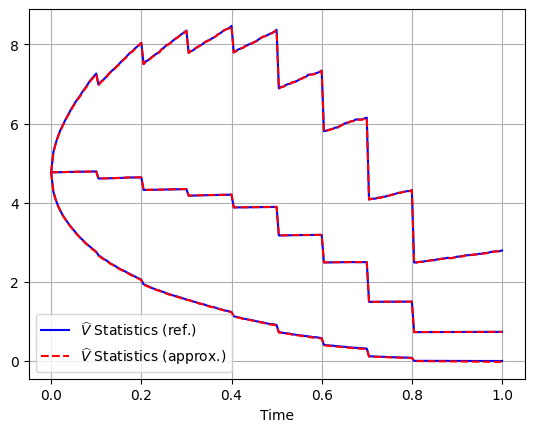

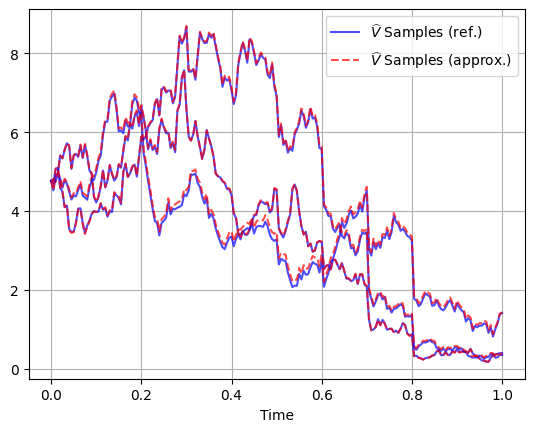

In [ ]:
# Existing Code
# Sum over the P_Y dimension to get total prices and approximations
prices_total = tf.reduce_sum(prices, axis=1)  # Shape: [M, N+1]
NN_Y_total = tf.reduce_sum(NN_Y, axis=1)      # Shape: [M_eval, N+1]

# Convert tensors to NumPy arrays
prices_total_np = prices_total.numpy()
NN_Y_total_np = NN_Y_total.numpy()

# Compute the mean over samples (axis=0)
prices_mean = np.mean(prices_total_np, axis=0)
NN_Y_mean = np.mean(NN_Y_total_np, axis=0)

# Compute the 5th and 95th percentiles over samples (axis=0)
prices_p5 = np.percentile(prices_total_np, 5, axis=0)
prices_p95 = np.percentile(prices_total_np, 95, axis=0)

NN_Y_p5 = np.percentile(NN_Y_total_np, 5, axis=0)
NN_Y_p95 = np.percentile(NN_Y_total_np, 95, axis=0)

# Plotting the mean and percentiles
#plt.figure(figsize=(12, 6))

# Plot the mean lines
plt.plot(t, prices_mean, '-', color='blue', label='$\widehat{V}$ Statistics (ref.)')
plt.plot(t, NN_Y_mean, '--', color='red', label='$\widehat{V}$ Statistics (approx.)')

# Plot the 5th and 95th percentiles for BS
plt.plot(t, prices_p5, color='blue', label=None)
plt.plot(t, prices_p95, color='blue', label=None)

# Plot the 5th and 95th percentiles for Approximation
plt.plot(t, NN_Y_p5, '--', color='red', label=None)
plt.plot(t, NN_Y_p95, '--', color='red', label=None)

# Add grid, legend, and labels
plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()

# New Code: Plotting Three Random Sample Paths

# Ensure reproducibility
#random.seed(42)

# Determine the number of samples (use the smaller of the two if they differ)
num_samples = min(prices_total_np.shape[0], NN_Y_total_np.shape[0])

# Select three random sample indices
sample_indices = random.sample(range(num_samples), 3)

# Create a new figure for the sample paths
#plt.figure(figsize=(6, 6))

for idx in sample_indices:
    # Plot BS solution sample path
    plt.plot(t, prices_total_np[idx, :], linestyle='-', alpha=0.7, color='blue',
             label='$\widehat{V}$ Samples (ref.)' if idx == sample_indices[0] else "")
    # Plot approximation sample path
    plt.plot(t, NN_Y_total_np[idx, :], linestyle='--', alpha=0.7, color='red',
             label='$\widehat{V}$ Samples (approx.)' if idx == sample_indices[0] else "")

# Add grid, legend, and labels
plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()


<ipython-input-25-ec5b52f8e694>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


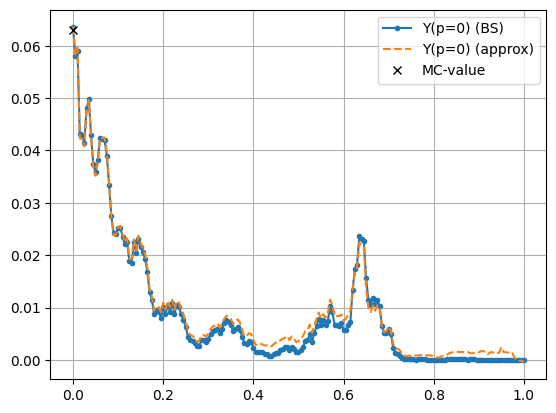

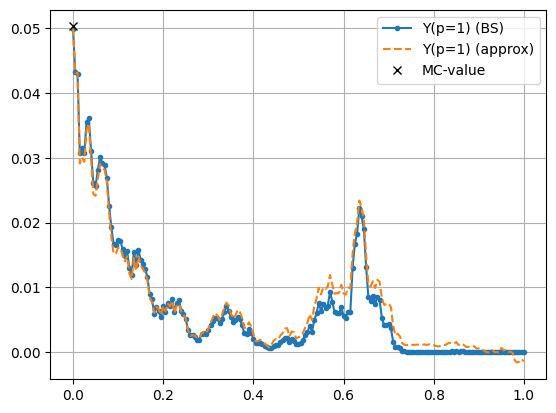

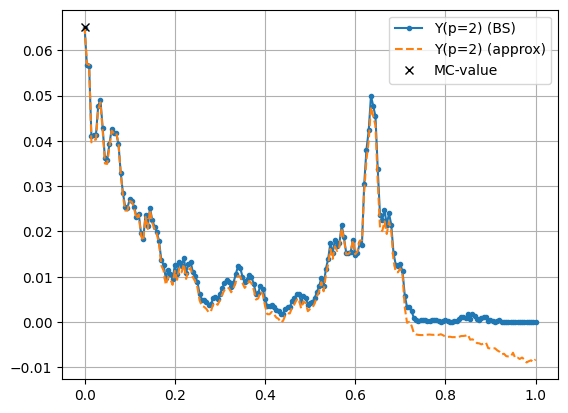

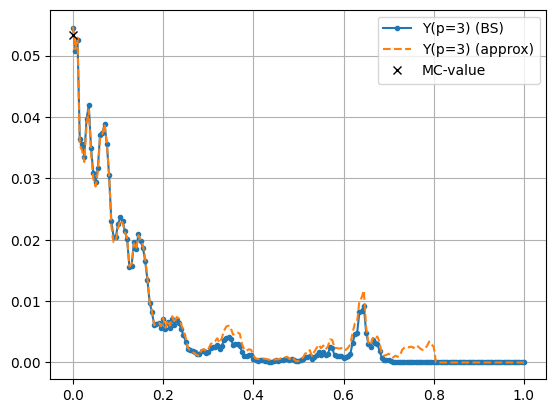

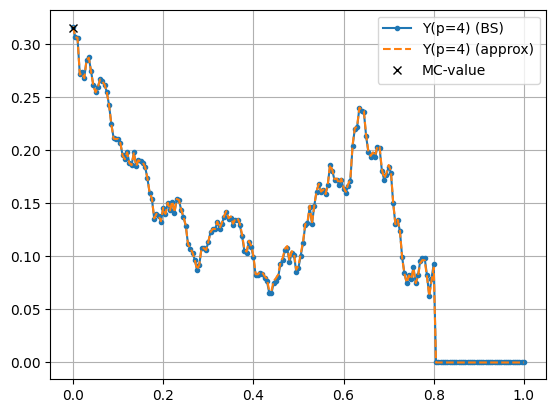

...

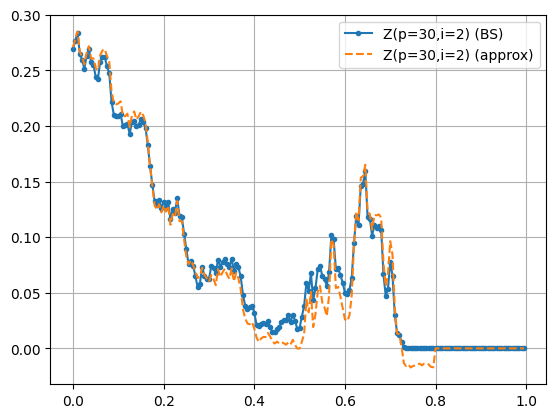

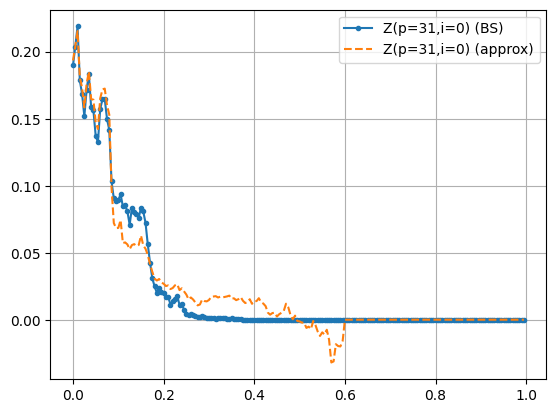

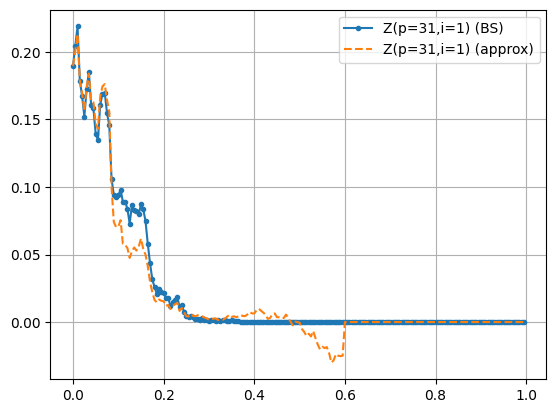

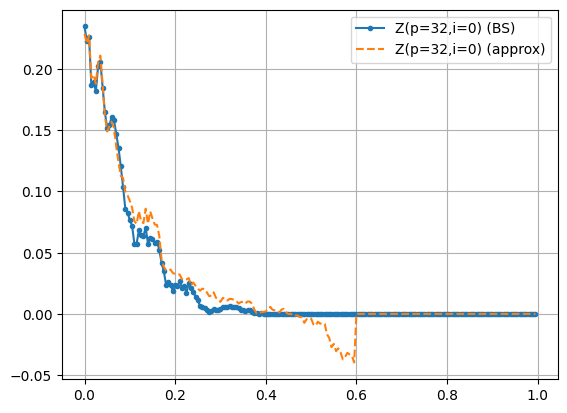

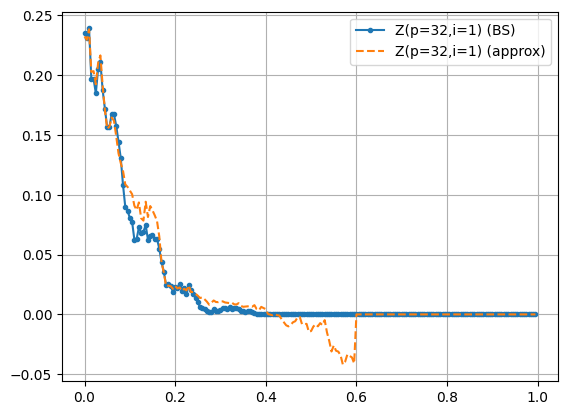

In [ ]:
n = np.random.randint(0, M_eval)

for p in range(P_Y):
  plt.figure()
  plt.plot(t,prices[n,p,:], '.-', label = f'Y(p={p}) (BS)')
  plt.plot(t,NN_Y[n,p,:], '--', label = f'Y(p={p}) (approx)')
  plt.plot(0, MC_prices[p], 'kx', label = "MC-value")
  plt.grid()
  plt.legend()


for p in range(P_Y):
  for i in range(d_p[p]):
    plt.figure()
    plt.plot(t[:-1], deltas[n,ind_Z[p]+i,:-1], '.-', label = f'Z(p={p},i={i}) (BS)')
    plt.plot(t[:-1], NN_Vx[n,ind_Z[p]+i,:], '--', label = f'Z(p={p},i={i}) (approx)')
    plt.grid()
    plt.legend()

Sum over p E|Y_N - g(X_N)|^2:  0.0015500867
Each p E|Y_N - g(X_N)|^2:  [4.948448e-05, 6.287342e-05, 5.6847915e-05, 6.5513326e-05, 1.2928785e-05, 5.905442e-06, 1.0113492e-05, 9.251131e-06, 6.598312e-05, 1.3718318e-05, 2.550285e-06, 5.758151e-05, 8.028853e-05, 7.72911e-05, 4.761214e-05, 5.8940794e-05, 3.4236138e-05, 8.152005e-05, 9.4749965e-05, 0.00011939649, 3.7014863e-05, 8.0586826e-05, 6.5176544e-05, 1.4000357e-05, 6.7486317e-06, 1.7487497e-05, 7.0911556e-06, 4.0979e-05, 4.185961e-05, 3.3080072e-05, 4.7959416e-05, 6.740284e-05, 8.3913474e-05]
E[int_t^T|Y-Y_BS|^2dt]:  [0.0038931  0.00424771 0.0040486  0.00375385 0.0016418  0.00103966
 0.0013176  0.00099776 0.00266275 0.00086227 0.00039238 0.00400962
 0.00485721 0.00491672 0.00304681 0.00338494 0.00216078 0.00319538
 0.00286753 0.0030379  0.00103221 0.00163632 0.00478087 0.00166991
 0.00115342 0.00146651 0.00101225 0.00198388 0.00346793 0.00251922
 0.00317388 0.00354342 0.0037876 ] E[sup_t|Y-Y_BS|^2]:  [7.86746969e-05 9.87254680e-05 8.9

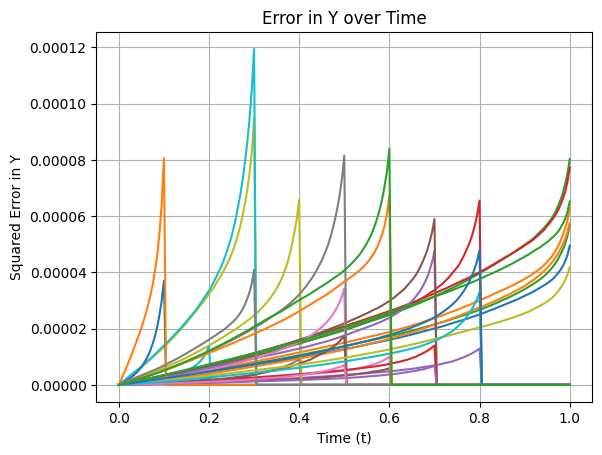

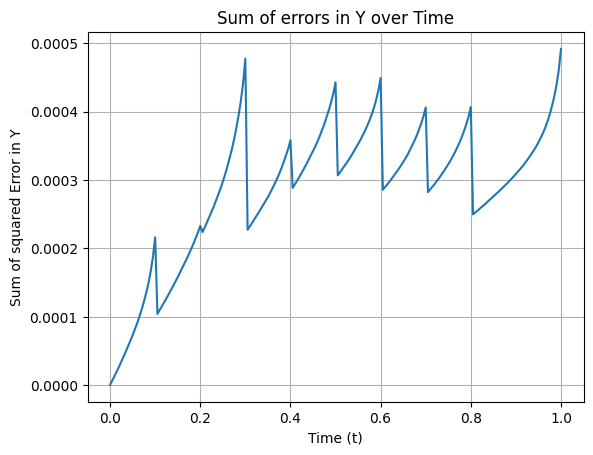

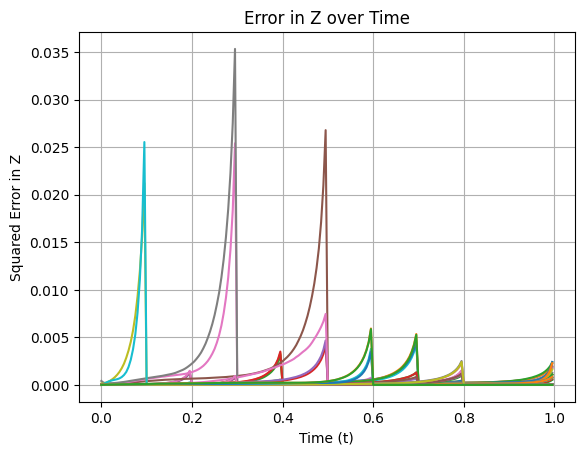

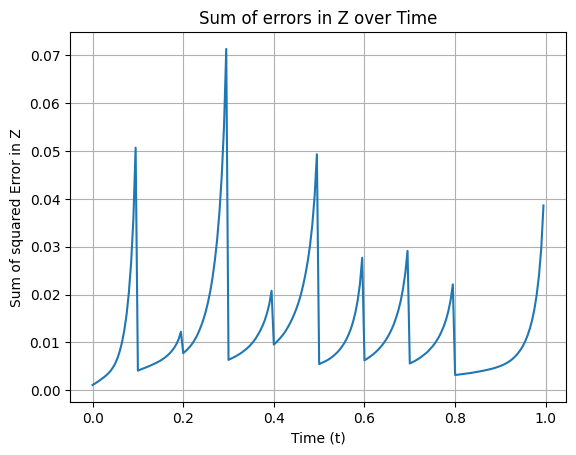

In [ ]:
Err_terminal_p = []
for p in range(P_Y):
  Err_terminal_p.append(np.mean( (NN_Y[:,p,N_p[p]] - prices[:,p,N_p[p]])**2 ))

print('Sum over p E|Y_N - g(X_N)|^2: ', np.sum(Err_terminal_p))
print('Each p E|Y_N - g(X_N)|^2: ', Err_terminal_p )

error_y_p2 = tf.reduce_mean(tf.math.abs(prices - NN_Y)**2, 0)
error_y_p = tf.sqrt(tf.reduce_sum(error_y_p2,0))
error_y = tf.sqrt(tf.reduce_sum(error_y_p2,1) * h )

error_z_p2 = tf.reduce_mean(tf.math.abs(deltas[:,:,:-1] - NN_Vx)**2, 0)
error_z_p = tf.sqrt(tf.reduce_sum(error_z_p2,0))
error_z = tf.sqrt(tf.reduce_sum(error_z_p2,1) * h )

S_error_y = tf.reduce_mean(tf.reduce_max(tf.math.abs(prices - NN_Y)**2, 2), 0) # mean of maximum error^2 per path
S_error_z = tf.reduce_mean(tf.reduce_max(tf.math.abs(deltas[:,:,:-1] - NN_Vx)**2, 2), 0) # mean of maximum error^2 per path

print('E[int_t^T|Y-Y_BS|^2dt]: ', error_y.numpy(), 'E[sup_t|Y-Y_BS|^2]: ', S_error_y.numpy())
print('E[int_t^T|Z-Z_BS|^2dt]: ', error_z.numpy(), 'E[sup_t|Z-Z_BS|^2]: ', S_error_z.numpy())


# Plot for error in Y
plt.plot(t, tf.transpose(error_y_p2))
plt.xlabel('Time (t)')
plt.ylabel('Squared Error in Y')
plt.title('Error in Y over Time')
plt.grid()

plt.figure()
plt.plot(t, tf.reduce_sum(error_y_p2,0))
plt.xlabel('Time (t)')
plt.ylabel('Sum of squared Error in Y')
plt.title('Sum of errors in Y over Time')
plt.grid()

# Create a new figure for error in Z
plt.figure()
plt.plot(t[:-1], tf.transpose(error_z_p2))
plt.xlabel('Time (t)')
plt.ylabel('Squared Error in Z')
plt.title('Error in Z over Time')
plt.grid()

plt.figure()
plt.plot(t[:-1], tf.reduce_sum(error_z_p2,0))
plt.xlabel('Time (t)')
plt.ylabel('Sum of squared Error in Z')
plt.title('Sum of errors in Z over Time')
plt.grid()

# Show the plots
plt.show()




# Nested Initial Margin computation

In [ ]:
# @title
### plot X, Y, Vx, Vxx from the neural network
alpha = 97.5 # percentile
M_eval = 2**2
M_inner = 2**12
MPR = 1 # In practice, this means MPR -> MPR*h
X = []
NN_Y = []
NN_Vx = []
IM = []
IM_BS = []
BS_prices = True
if BS_prices:
  mu_tilde_list = []
  sigma_tilde_list = []
  r_vec = r*tf.ones(d, dtype=tf.float32)

  for p in range(P_Y):
    # Select the relevant components #
    r_selected = tf.cast(tf.gather(r_vec, ind_X[p]), tf.float32)
    sigma_selected = tf.cast(tf.gather(sigma, ind_X[p]), tf.float32)
    corr_selected = tf.cast(tf.gather(tf.gather(corr_matrix, ind_X[p], axis=0), ind_X[p], axis=1), tf.float32)
    d_selected = d_p[p]

    sigma_tide_temp = tf.sqrt((1 / d_p[p]**2) * tf.linalg.matmul(tf.linalg.matmul(tf.transpose(tf.expand_dims(sigma_selected, axis=-1)), corr_selected),tf.expand_dims(sigma_selected, axis=-1))[0, 0])  # Compute volatility sigma_tilde
    mu_tilde_temp = (1 / d_p[p]) * tf.reduce_sum(r_selected - 0.5 * sigma_selected ** 2) + 0.5 * sigma_tide_temp**2   # Compute drift mu_tilde

    mu_tilde_list.append(mu_tilde_temp)
    sigma_tilde_list.append(sigma_tide_temp)

  mu_tilde = tf.stack(mu_tilde_list)
  sigma_tilde = tf.stack(sigma_tilde_list)


x0 = np.ones([M_eval,d])

X.append(tf.cast(x0, tf.float32))
inp = tf.concat([X[0], tf.fill([M_eval, 1], tf.cast(0.0, dtype=tf.float32))], axis=1)
NN_Y.append(tf.broadcast_to(full_model_2.y_0, [M_eval, P_Y]))


for n in range(0, N):
  # Update to n #
  inp = tf.concat([X[n], tf.fill([M_eval, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
  NN_Vx.append( tf.cast( full_model_2.network( inp ), tf.float32) )
  ###############

  X_k = tf.repeat(X[n], repeats=M_inner, axis=0)
  NN_Y_k = tf.repeat(NN_Y[n], repeats=M_inner, axis=0)
  NN_Vx_k = tf.repeat(NN_Vx[n], repeats=M_inner, axis=0)
  for k in range(MPR):
    NN_Y_k_temp_p = []
    NN_Y_k_temp_p_BS = []
    dW_k = tf.cast(np.random.normal(size=(M_eval*M_inner, d)) * np.sqrt(h), tf.float32)
    for p in range(0, P_Y):
      if n >= N_p[p]:
        temp_tensor = tf.zeros(M_eval*M_inner)
      elif n < N_p[p] and n + k >= N_p[p]:
        temp_tensor = model_2.g(X_k, K_p[p], ind_X[p], d_p[p])
      else:
        temp_tensor = model_2.F_Y(X_k, NN_Y_k[:,p], NN_Vx_k, dW_k, ind_X[p], ind_Z[p], d_p[p])
      # If temp_tensor has extra dimensions, squeeze them
      temp_tensor = tf.reshape(temp_tensor, [M_eval*M_inner])  # Or tf.squeeze(temp_tensor)
      NN_Y_k_temp_p.append(temp_tensor)
      ####################################################
    NN_Y_k = tf.stack(NN_Y_k_temp_p, axis=1)
    NN_Y_MPR = tf.reduce_sum(NN_Y_k, axis=1)
    Y_MPR_reshaped = tf.reshape(NN_Y_MPR, [M_eval, M_inner])
    # Compute 99th percentile for each M_inner segment
    X_k = model_2.F_X(X_k, dW_k)
    if k < MPR-1:
      inp_k = tf.concat([X_k, tf.fill([M_eval*M_inner, 1], tf.cast( (n + k + 1) * h, dtype=tf.float32))], axis=1)
      NN_Vx_k = tf.cast( full_model_2.network( inp_k ), tf.float32)
    else:
      IM.append(tfp.stats.percentile(Y_MPR_reshaped, alpha, axis=1))
      if BS_prices:
        for p in range(P_Y):
          # Gather the relevant dimensions
          X_selected = tf.gather(X_k, ind_X[p], axis=1)

          # Compute the geometric mean across the selected dimensions #
          log_X_selected = tf.math.log(X_selected)
          mean_log_X = tf.reduce_mean(log_X_selected, axis=1)
          X_k_tilde = tf.exp(mean_log_X)

          #X_tilde.append(geom_mean)

          K_adj = K_p[p] * np.exp((r - mu_tilde[p]) * (T_p[p] - t[n]))     # Adjust the strike price based on the drift difference
          BS_Y, _ = tf.exp((mu_tilde[p] - r)*(T_p[p] - t[n]))*model_2.BS(X_k_tilde, K_adj, T_p[p] - t[n], r, sigma_tilde[p])     # Compute the Black-Scholes price and delta using your BS function
          NN_Y_k_temp_p_BS.append(BS_Y)
        NN_Y_k_BS = tf.stack(NN_Y_k_temp_p_BS, axis=1)
        NN_Y_MPR_BS = tf.reduce_sum(NN_Y_k_BS, axis=1)
        Y_MPR_reshaped_BS = tf.reshape(NN_Y_MPR_BS, [M_eval, M_inner])
        IM_BS.append(tfp.stats.percentile(Y_MPR_reshaped_BS, alpha, axis=1))





  # updates to n+1 #
  dW = tf.cast(np.random.normal(size=(M_eval, d)) * np.sqrt(h), tf.float32)
  NN_Y_temp_p = []
  for p in range(0, P_Y):
    if n < N_p[p]:
      NN_Y_temp_p.append(model_2.F_Y(X[n], NN_Y[n][:,p], NN_Vx[n], dW, ind_X[p], ind_Z[p], d_p[p]))
    else:
      NN_Y_temp_p.append(tf.zeros(M_eval))

  NN_Y.append(tf.stack(NN_Y_temp_p, axis=1))
  X.append(model_2.F_X(X[n], dW))
  ###################


IM = tf.stack(IM, axis=1)
if BS_prices:
  IM_BS = tf.stack(IM_BS, axis=1)



X = tf.transpose( tf.convert_to_tensor(X), perm = [1,2,0] )
NN_Y = tf.reduce_sum(tf.transpose( tf.convert_to_tensor(NN_Y), perm = [1,2,0] ), axis=1)
NN_Vx = tf.transpose( tf.convert_to_tensor(NN_Vx), perm = [1,2,0] )


<ipython-input-3-d4567df000ee>:67: RuntimeWarning: invalid value encountered in sqrt
  d1 = (np.log(x / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
<ipython-input-3-d4567df000ee>:68: RuntimeWarning: invalid value encountered in sqrt
  d2 = d1 - sigma * np.sqrt(T)


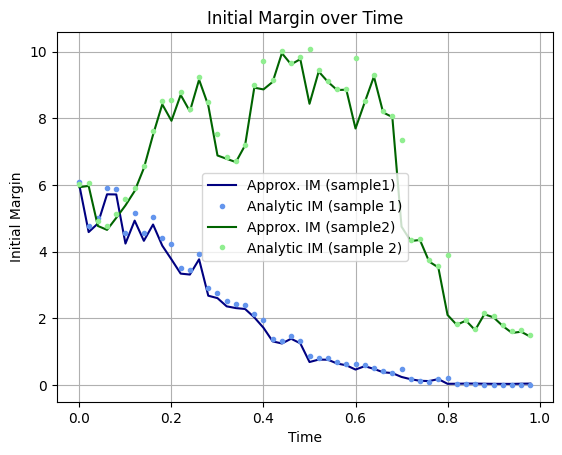

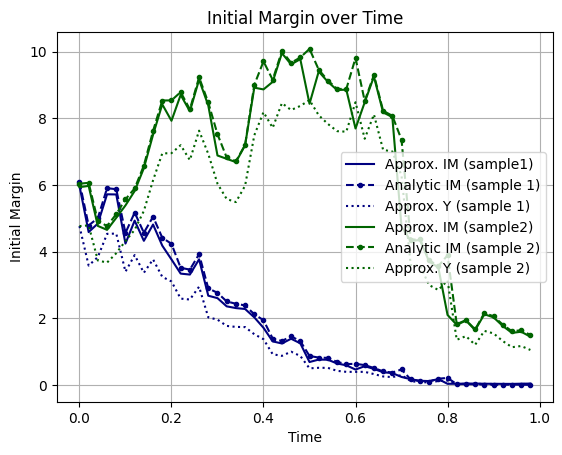

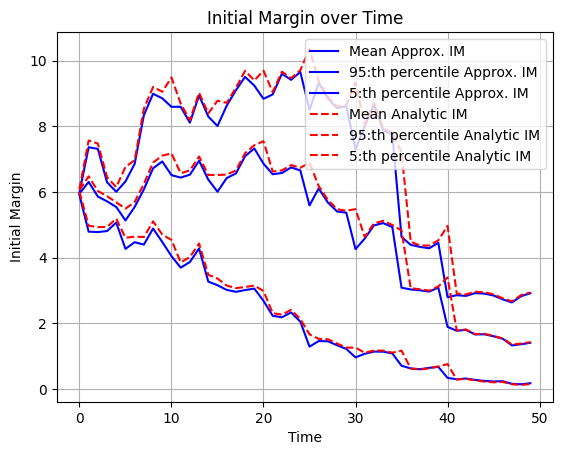

In [ ]:
colors = ['navy', 'darkgreen', 'red', 'darkorange', 'purple']  # You can specify more colors if needed
colors_ref = ['cornflowerblue', 'lightgreen', 'lightsalmon', 'moccasin', 'plum']  # You can specify more colors if needed

for i in range(2):
    plt.plot(t[:-1],IM[i, :].numpy(), color=colors[i], label=f'Approx. IM (sample{i+1})')
    plt.plot(t[:-1],IM_BS[i, :].numpy(), '.', color=colors_ref[i], label=f'Analytic IM (sample {i+1})')

plt.xlabel('Time')
plt.ylabel('Initial Margin')
plt.title('Initial Margin over Time')
plt.grid()
plt.legend()
plt.show()


for i in range(2):
    plt.plot(t[:-1], IM[i, :].numpy(),'-', color=colors[i], label=f'Approx. IM (sample{i+1})')
    plt.plot(t[:-1],IM_BS[i, :].numpy(), '.--', color=colors[i], label=f'Analytic IM (sample {i+1})')
    plt.plot(t[:-1],NN_Y[i, :-1].numpy(),':', color=colors[i], label=f'Approx. Y (sample {i+1})')

plt.xlabel('Time')
plt.ylabel('Initial Margin')
plt.title('Initial Margin over Time')
plt.grid()
plt.legend()
plt.show()


# Compute mean, 95th, and 5th percentile across the samples
mean_IM = np.mean(IM.numpy(), axis=0)
p95_IM = np.percentile(IM.numpy(), 95, axis=0)
p5_IM = np.percentile(IM.numpy(), 5, axis=0)

mean_IM_BS = np.mean(IM_BS.numpy(), axis=0)
p95_IM_BS = np.percentile(IM_BS.numpy(), 95, axis=0)
p5_IM_BS = np.percentile(IM_BS.numpy(), 5, axis=0)

# Plot the mean, 95th, and 5th percentile for IM
plt.plot(mean_IM, color='blue', label='Mean Approx. IM')
plt.plot(p95_IM, color='blue', label='95:th percentile Approx. IM')
plt.plot(p5_IM, color='blue', label='5:th percentile Approx. IM')
#plt.fill_between(range(mean_IM.shape[0]), p5_IM, p95_IM, color='b', alpha=0.2, label='5th-95th Percentile Approx. IM')

# Plot the mean, 95th, and 5th percentile for IM_BS
plt.plot(mean_IM_BS, '--', color='r', label='Mean Analytic IM')
plt.plot(p95_IM_BS, '--', color='r', label='95:th percentile Analytic IM')
plt.plot(p5_IM_BS, '--', color='r', label='5:th percentile Analytic IM')

#plt.fill_between(range(mean_IM_BS.shape[0]), p5_IM_BS, p95_IM_BS, color='r', alpha=0.2, label='5th-95th Percentile Analytic IM')

plt.xlabel('Time')
plt.ylabel('Initial Margin')
plt.title('Initial Margin over Time')
plt.grid()
plt.legend()
plt.show()

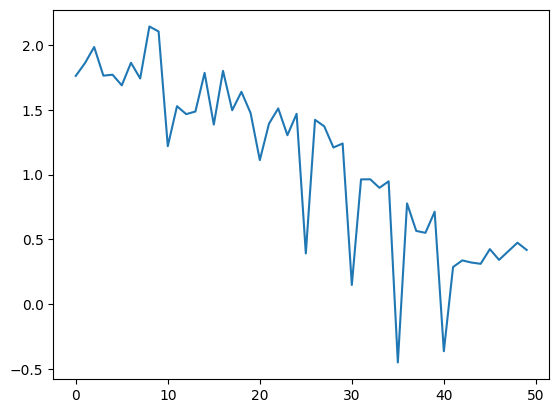

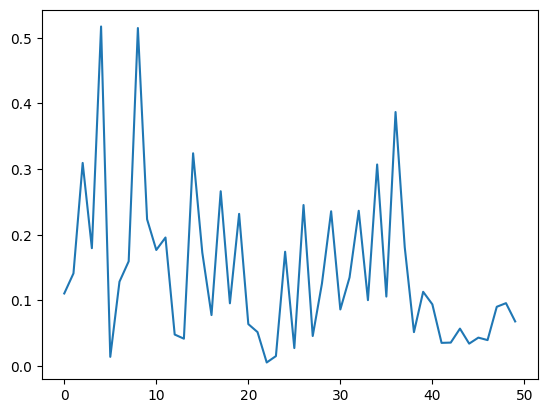

In [ ]:
diff = IM.numpy() - NN_Y.numpy()[:,:-1]
plt.plot(np.mean(diff,0))
plt.figure()
plt.plot(np.var(diff,0))

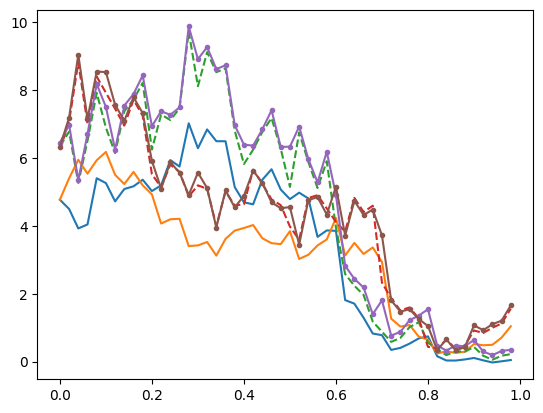

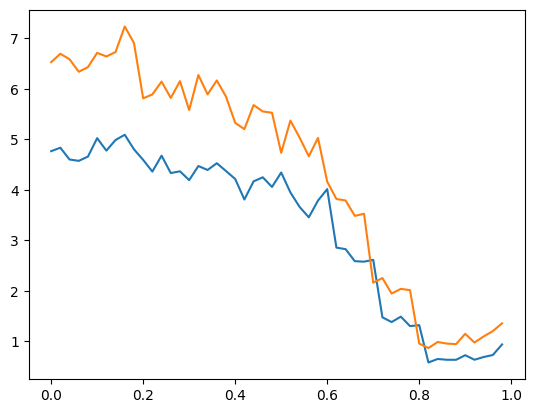

In [ ]:
plt.figure()
plt.plot(t[:-1],NN_Y[:2,:-1].numpy().T)
plt.plot(t[:-1],IM[:2,:].numpy().T, '--')
plt.plot(t[:-1],IM_BS[:2,:].numpy().T, '.-')

plt.figure()
plt.plot(t[:-1], np.mean(NN_Y[:,:-1],0))
plt.plot(t[:-1], np.mean(IM,0))




In [ ]:
mean_IM10 = np.mean(IM,0)
var_IM10 = np.var(IM,0)


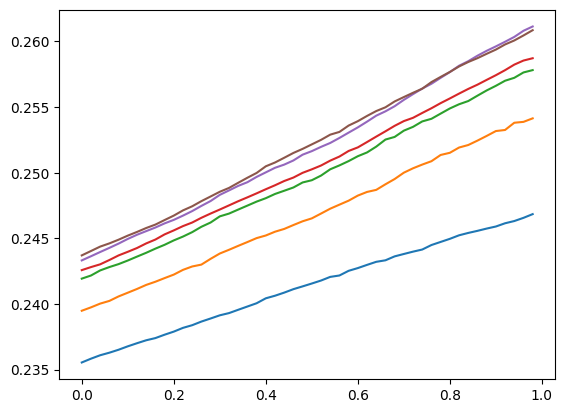

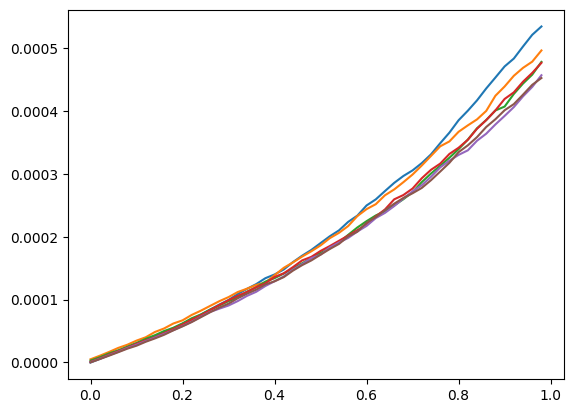

In [ ]:
plt.figure()
plt.plot(t[:-1], np.mean(NN_Y[:,:-1],0))
plt.plot(t[:-1], mean_IM2)
plt.plot(t[:-1], mean_IM4)
plt.plot(t[:-1], mean_IM6)
plt.plot(t[:-1], mean_IM8)
plt.plot(t[:-1], mean_IM10)


plt.figure()
plt.plot(t[:-1], np.var(NN_Y[:,:-1],0))
plt.plot(t[:-1], var_IM2)
plt.plot(t[:-1], var_IM4)
plt.plot(t[:-1], var_IM6)
plt.plot(t[:-1], var_IM8)
plt.plot(t[:-1], var_IM10)




# Quantile Neural Network Class


In [ ]:


############## Define Neural Network Class for Quantile Regression ##############
class QuantileNetwork(tf.keras.Model):
    def __init__(self, input_dim, neurons=[16, 16, 16], activation='relu', use_batchnorm=False, regu_cons=[0., 0.], ini_cons=None):
        super(QuantileNetwork, self).__init__()
        self.input_dim = input_dim
        self.neurons = neurons
        self.activation = activation
        self.use_batchnorm = use_batchnorm
        self.regu_1 = tf.keras.regularizers.L2(l2=regu_cons[0])
        self.regu_2 = tf.keras.regularizers.L2(l2=regu_cons[1])
        if ini_cons is None:
            self.ini_1 = 'glorot_uniform'
            self.ini_2 = 'zeros'
        else:
            self.ini_1 = tf.keras.initializers.Constant(value=ini_cons[0])
            self.ini_2 = tf.keras.initializers.Constant(value=ini_cons[1])

        # Define dense layers
        self.dense_layers = []
        self.batch_norm_layers = []
        for units in self.neurons:
            self.dense_layers.append(layers.Dense(
                units,
                activation=self.activation,
                use_bias=True,
                kernel_regularizer=self.regu_1,
                bias_regularizer=self.regu_2,
                kernel_initializer=self.ini_1,
                bias_initializer=self.ini_2
            ))
            if self.use_batchnorm:
                self.batch_norm_layers.append(layers.BatchNormalization())

        # Output layer
        self.output_layer = layers.Dense(2, activation='linear', use_bias=True,
                                         kernel_regularizer=self.regu_1,
                                         bias_regularizer=self.regu_2,
                                         kernel_initializer=self.ini_1,
                                         bias_initializer=self.ini_2)

    def call(self, inputs, training=False):
        x = inputs
        for i in range(len(self.dense_layers)):
            x = self.dense_layers[i](x)
            if self.use_batchnorm:
                x = self.batch_norm_layers[i](x, training=training)
        output = self.output_layer(x)
        return output


# Initial Margin computation with neural networks

In [ ]:

# Parameters
alpha = 0.99  # For the 99th percentile
num_epochs = 5000
batch_size = 2**12
MPR_0 = 8
validation_split = 0.2
q_models = {}

for k in range(1, N):
  MPR = min(MPR_0, N - k)
  # Create an instance of the QuantileNetwork
  inp = tf.concat([X[:, :, k], NN_Y[:, :, k], tf.expand_dims(Y[:, k], axis=1)], axis=1)
  #inp = tf.expand_dims(Y[:, k], axis=1)
  q_models[k] = QuantileNetwork(input_dim=inp.shape[1], neurons=[16, 16, 16], activation='relu', use_batchnorm=False)


  ############## Quantile Loss Function ##############
  def quantile_loss(alpha):
      def loss(y_true, y_pred):
          u_1 = y_true - y_pred[:,0]
          u_2 = y_true - y_pred[:,1]
          return tf.reduce_mean(tf.maximum(alpha * u_1, (alpha - 1) * u_1)) + tf.reduce_mean(tf.maximum((1 - alpha) * u_2, -alpha * u_2))
      return loss


  # Define the EarlyStopping callback
  early_stopping = EarlyStopping(
      monitor='val_loss',     # Metric to monitor (e.g., validation loss)
      patience=100,             # Number of epochs to wait for improvement
      restore_best_weights=True,  # Restore the model weights with the best validation performance
      verbose=1               # Print a message when stopping
  )

  # Define an exponential decay scheduler
  initial_learning_rate = 0.001  # Starting learning rate
  lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
      initial_learning_rate=initial_learning_rate,
      decay_steps=1000,  # Adjust based on your data size
      decay_rate=0.96,  # The factor by which the learning rate decreases
      staircase=True  # True for discrete decay; False for smooth decay
  )

  # Compile the model with the scheduler
  optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
  q_models[k].compile(optimizer='adam', loss=quantile_loss(alpha))

  # Train the model
  #q_models[k].fit(inp, Y[:,k+MPR] - Y[:,k], epochs=num_epochs, batch_size=batch_size, validation_split=validation_split,  verbose = 2, callbacks=[early_stopping])

  # Train the model with no verbose output
  history = q_models[k].fit(
      inp,
      Y[:, k+MPR] - Y[:, k],
      epochs=num_epochs,
      batch_size=batch_size,
      validation_split=validation_split,
      verbose=0,               # No epoch-by-epoch printout
      callbacks=[early_stopping]
  )

  # After training completes, print a summary for this model
  print(f"Model {k} training complete. Best validation loss: {min(history.history['val_loss'])}")





Utdata för streaming har trunkerats till de sista 5000 raderna.
13/13 - 0s - 6ms/step - loss: 0.0469 - val_loss: 0.0469
Epoch 101/5000
13/13 - 0s - 6ms/step - loss: 0.0469 - val_loss: 0.0469
Epoch 102/5000
13/13 - 0s - 5ms/step - loss: 0.0469 - val_loss: 0.0470
Epoch 103/5000
13/13 - 0s - 5ms/step - loss: 0.0469 - val_loss: 0.0468
Epoch 104/5000
13/13 - 0s - 5ms/step - loss: 0.0468 - val_loss: 0.0470
Epoch 105/5000
13/13 - 0s - 5ms/step - loss: 0.0469 - val_loss: 0.0468
Epoch 106/5000
13/13 - 0s - 5ms/step - loss: 0.0469 - val_loss: 0.0469
Epoch 107/5000
13/13 - 0s - 6ms/step - loss: 0.0469 - val_loss: 0.0469
Epoch 108/5000
13/13 - 0s - 6ms/step - loss: 0.0468 - val_loss: 0.0469
Epoch 109/5000
13/13 - 0s - 6ms/step - loss: 0.0468 - val_loss: 0.0468
Epoch 110/5000
13/13 - 0s - 6ms/step - loss: 0.0469 - val_loss: 0.0469
Epoch 111/5000
13/13 - 0s - 6ms/step - loss: 0.0469 - val_loss: 0.0468
Epoch 112/5000
13/13 - 0s - 6ms/step - loss: 0.0468 - val_loss: 0.0469
Epoch 113/5000
13/13 - 0s - 

KeyboardInterrupt: 

In [ ]:
W = 100
k = 1
MPR = 8
quantile_1 = np.zeros(W)
for w in range(W):
  M_ref = X.shape[0]
  X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
  NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
  Y_ref_0 = tf.reduce_sum(NN_Y_ref, axis=1)

  for n in range(k, k + MPR):
    dW = tf.cast(np.random.normal(size=(M_ref, d)) * np.sqrt(h), tf.float32)
    inp = tf.concat([X_ref, tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
    NN_Vx_ref = tf.cast( full_model_2.network( inp ), tf.float32)

    NN_Y_temp_p = []
    for p in range(0, P_Y):
      if n < N_p[p]:
        NN_Y_temp_p.append(model_2.F_Y(X_ref, NN_Y_ref[:,p], NN_Vx_ref, dW, ind_X[p], ind_Z[p], d_p[p]))
      else:
        NN_Y_temp_p.append(tf.zeros(M_eval))
    NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
    X_ref = model_2.F_X(X_ref, dW)
  Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
  delta_Y_ref = Y_ref - Y_ref_0
  quantile_1[w] = np.quantile(delta_Y_ref, alpha)







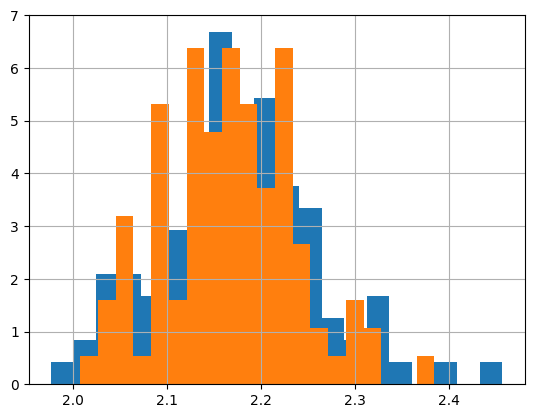

In [ ]:
plt.hist(q_alpha_pred[:W,0,k], bins=20, density=True)
plt.hist(quantile_1, 20,density=True)
plt.grid()

2048/2048 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
2048/2048 ━

NameError: name 'quantile_1' is not defined

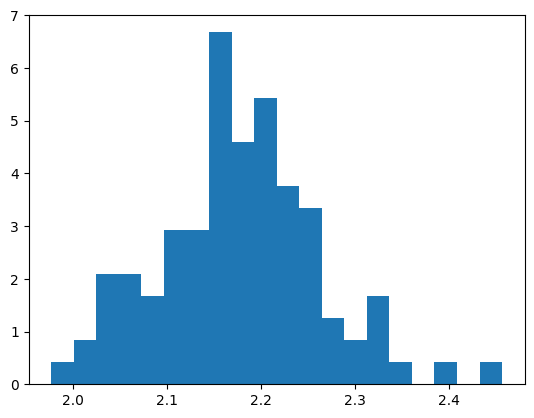

In [ ]:
MPR = 8
q_alpha_pred = np.zeros([M_eval,2,N])
q_alpha_pred[:,0,0] = np.quantile(Y[:,MPR]-Y[:,0], alpha)
q_alpha_pred[:,1,0] = np.quantile(Y[:,MPR]-Y[:,0], 1-alpha)

for k in range(1,N):
  inp = tf.concat([X[:, :, k], NN_Y[:,:,k], tf.expand_dims(Y[:, k], axis=1)], axis=1)
  #inp = tf.expand_dims(Y[:, k], axis=1)
  q_alpha_pred[:,:,k] = q_models[k].predict(inp)
k=1
plt.hist(q_alpha_pred[:100,0,k], bins=20, density=True)
plt.hist(quantile_1, 20,density=True)
plt.figure()
'''
k=2
plt.hist(q_alpha_pred[:W,k], bins=20, density=True)
plt.hist(quantile_2, 20,density=True)
plt.figure()
k=3
plt.hist(q_alpha_pred[:W,k], bins=20, density=True)
plt.hist(quantile_3, 20,density=True)
plt.figure()
'''

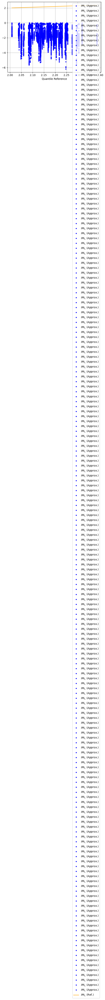

ValueError: operands could not be broadcast together with shapes (100,200) (100,) 

<Figure size 640x480 with 0 Axes>

In [ ]:
k=1
W = 100
plt.plot(quantile_1, q_alpha_pred[:W, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_1), np.max(quantile_1)],
    [np.min(quantile_1), np.max(quantile_1)],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,k] - quantile_1)
err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_1))
rel_err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_1)/(quantile_1))
print(err, rel_err)

plt.figure()
k = 15
plt.plot(quantile_15, q_alpha_pred[:W, k], '.', label=r'$IM_{t_{15}}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_15), np.max(quantile_15)],
    [np.min(quantile_15), np.max(quantile_15)],
    label=r'$IM_{t_{15}}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,k] - quantile_15)
err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_15))
rel_err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_15)/(quantile_15))
print(err, rel_err)

plt.figure()
k=45
plt.plot(quantile_45, q_alpha_pred[:W, k], '.', label=r'$IM_{t_{45}}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_45), np.max(quantile_45)],
    [np.min(quantile_45), np.max(quantile_45)],
    label=r'$IM_{t_{45}}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,k] - quantile_45)
err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_45))
rel_err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_45)/(quantile_45))
print(err, rel_err)

'''
plt.figure()
plt.plot(q_alpha_pred[:W] - Y[:W,k], quantile-Y[:W,k], '.')
plt.plot([np.min(quantile - Y[:W,k]), np.max(quantile - Y[:W,k])],[np.min(quantile - Y[:W,k]), np.max(quantile - Y[:W,k])])
plt.grid()
plt.figure()
plt.hist(q_alpha_pred[:W] - quantile)
err = np.mean(np.abs(q_alpha_pred[:W] - quantile))
rel_err = np.mean(np.abs(q_alpha_pred[:W] - quantile)/(quantile - Y[:W,k]))
plt.figure()
plt.plot(Y[:10000,k], q_alpha_pred[:10000],'.')
plt.figure()
plt.plot(Y[:W,k], quantile,'.')
print(err, rel_err)
'''

In [ ]:
W = 3
MPR = 8
quantile_0 = np.zeros([W,N+1])
quantile_0[:,0] = np.quantile(Y[:,MPR]-Y[:,0], 1 - alpha)
quantile_1 = np.zeros([W,N+1])
quantile_1[:,0] = np.quantile(Y[:,MPR]-Y[:,0], alpha)
for k in range(1,N):
  for w in range(W):
    M_ref = X.shape[0]
    X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
    NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
    Y_ref_0 = tf.reduce_sum(NN_Y_ref, axis=1)

    for n in range(k, np.minimum(k + MPR, N)):
      dW = tf.cast(np.random.normal(size=(M_ref, d)) * np.sqrt(h), tf.float32)
      inp = tf.concat([X_ref, tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
      NN_Vx_ref = tf.cast( full_model_2.network( inp ), tf.float32)

      NN_Y_temp_p = []
      for p in range(0, P_Y):
        if n < N_p[p]:
          NN_Y_temp_p.append(model_2.F_Y(X_ref, NN_Y_ref[:,p], NN_Vx_ref, dW, ind_X[p], ind_Z[p], d_p[p]))
        else:
          NN_Y_temp_p.append(tf.zeros(M_eval))
      NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
      X_ref = model_2.F_X(X_ref, dW)
    Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
    delta_Y_ref = Y_ref - Y_ref_0
    quantile_0[w,k] = np.quantile(delta_Y_ref, 1 - alpha)
    quantile_1[w,k] = np.quantile(delta_Y_ref, alpha)

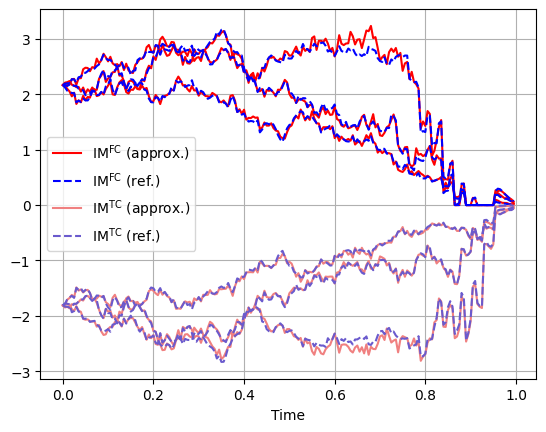

In [ ]:
plt.plot(t[:-1], np.maximum(q_alpha_pred[0, 0, :], 0), color='red', label=r'$\text{IM}^{\text{FC}}$ (approx.)')  # Add label only for the first red line
plt.plot(t[:-1], np.maximum(q_alpha_pred[1:3, 0, :].T, 0), color='red')  # Remaining red lines without labels

plt.plot(t[:-1], np.maximum(quantile_1[0, :-1], 0 ), '--', color='blue', label=r'$\text{IM}^{\text{FC}}$ (ref.)')  # Add label only for the first blue line
plt.plot(t[:-1], np.maximum(quantile_1[1:3, :-1].T, 0), '--', color='blue')  # Remaining blue lines without labels

plt.plot(t[:-1], np.minimum(q_alpha_pred[0, 1, :], 0), color='lightcoral', label=r'$\text{IM}^{\text{TC}}$ (approx.)')  # Add label only for the first red line
plt.plot(t[:-1], np.minimum(q_alpha_pred[1:3, 1, :].T, 0), color='lightcoral')  # Remaining red lines without labels

plt.plot(t[:-1], np.minimum(quantile_0[0, :-1], 0), '--', color='slateblue', label=r'$\text{IM}^{\text{TC}}$ (ref.)')  # Add label only for the first blue line
plt.plot(t[:-1], np.minimum(quantile_0[1:3, :-1].T, 0), '--', color='slateblue')  # Remaining blue lines without labels

plt.xlabel('Time')
plt.grid()
plt.legend()  # Add the legend to the plot

ValueError: The 'color' keyword argument must have one color per dataset, but 200 datasets and 1 colors were provided

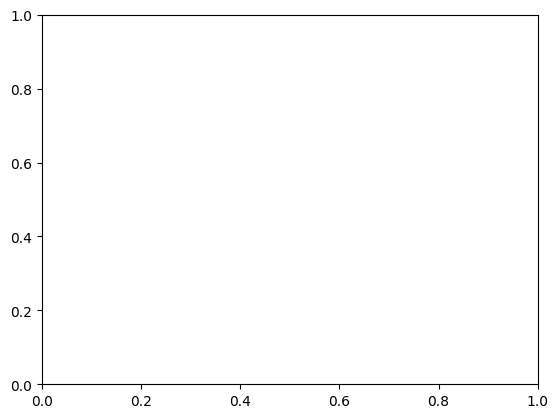

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Data for the first histogram
data1 = q_alpha_pred[:100000, 1]
# Plot the histogram
plt.hist(data1, bins=50, density=True, color='gray', edgecolor='black', alpha=0.6, label=r'Distribution $IM_{t_1}$')
# Fit a normal distribution
mean1, std1 = np.mean(data1), np.std(data1)
x1 = np.linspace(np.min(data1), np.max(data1), 1000)
pdf1 = norm.pdf(x1, mean1, std1)
# Plot the fitted normal distribution
plt.plot(x1, pdf1, color='red', label='Fitted Normal Distribution')
# Add grid, labels, legend
plt.grid()
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.title('Histogram and Fitted Normal Distribution for $IM_{t_1}$')
plt.show()

# Data for the second histogram
data2 = q_alpha_pred[:100000, 15]
# Plot the histogram
plt.hist(data2, bins=50, density=True, color='gray', edgecolor='black', alpha=0.6, label=r'Distribution $IM_{t_{15}}$')
# Fit a normal distribution
mean2, std2 = np.mean(data2), np.std(data2)
x2 = np.linspace(np.min(data2), np.max(data2), 1000)
pdf2 = norm.pdf(x2, mean2, std2)
# Plot the fitted normal distribution
plt.plot(x2, pdf2, color='red', label='Fitted Normal Distribution')
# Add grid, labels, legend
plt.grid()
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.title('Histogram and Fitted Normal Distribution for $IM_{t_{15}}$')
plt.show()

# Data for the third histogram
data3 = q_alpha_pred[:100000, 45]
# Plot the histogram
plt.hist(data3, bins=50, density=True, color='gray', edgecolor='black', alpha=0.6, label=r'Distribution $IM_{t_{45}}$')
# Fit a normal distribution
mean3, std3 = np.mean(data3), np.std(data3)
x3 = np.linspace(np.min(data3), np.max(data3), 1000)
pdf3 = norm.pdf(x3, mean3, std3)
# Plot the fitted normal distribution
plt.plot(x3, pdf3, color='red', label='Fitted Normal Distribution')
# Add grid, labels, legend
plt.grid()
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.title('Histogram and Fitted Normal Distribution for $IM_{t_{45}}$')
plt.show()


# Train and store IM-model


In [ ]:
# Define the path where you want to save the models
quantile_models_path = '/content/drive/MyDrive/quantile_models'

# Create the directory if it doesn't exist
os.makedirs(quantile_models_path, exist_ok=True)

alpha = 0.99  # For the 99th percentile
num_epochs = 5000
batch_size = 2**12
MPR_0 = 8
validation_split = 0.2
q_models = {}

for k in range(1, N):
    MPR = min(MPR_0, N - k)
    # Create an instance of the QuantileNetwork
    inp = tf.concat([X[:, :, k], NN_Y[:, :, k], tf.expand_dims(Y[:, k], axis=1)], axis=1)
    q_models[k] = QuantileNetwork(input_dim=inp.shape[1], neurons=[16, 16, 16], activation='relu', use_batchnorm=False)

    # Quantile Loss Function
    def quantile_loss(alpha):
      def loss(y_true, y_pred):
          u_1 = y_true - y_pred[:,0]
          u_2 = y_true - y_pred[:,1]
          return tf.reduce_mean(tf.maximum(alpha * u_1, (alpha - 1) * u_1)) + tf.reduce_mean(tf.maximum((1 - alpha) * u_2, -alpha * u_2))
      return loss

    # Define the EarlyStopping callback
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=100,
        restore_best_weights=True,
        verbose=1
    )

    # Define an exponential decay scheduler
    initial_learning_rate = 0.001
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=initial_learning_rate,
        decay_steps=1000,
        decay_rate=0.96,
        staircase=True
    )

    # Compile the model with the optimizer and loss function
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
    q_models[k].compile(optimizer=optimizer, loss=quantile_loss(alpha))

    # Train the model
    q_models[k].fit(
        inp,
        Y[:, k + MPR] - Y[:, k],
        epochs=num_epochs,
        batch_size=batch_size,
        validation_split=validation_split,
        verbose=2,
        callbacks=[early_stopping]
    )

    # Save the model weights after training
    # Generate a unique filename for the model weights
    model_filename = f'quantile_model_k_{k}.weights.h5'
    model_filepath = os.path.join(quantile_models_path, model_filename)

    # Check if the file already exists
    if os.path.exists(model_filepath):
      # Modify the filename to prevent overwriting
      timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
      model_filename = f'quantile_model_k_{k}_{timestamp}.weights.h5'
      model_filepath = os.path.join(quantile_models_path, model_filename)

    # Save the weights
    q_models[k].save_weights(model_filepath)
    print(f"Model for k={k} saved to {model_filepath}")

    # Save the model parameters
    parameters_filename = f'quantile_model_k_{k}_parameters.pkl'
    parameters_filepath = os.path.join(quantile_models_path, parameters_filename)

    # Check if the parameters file exists
    if os.path.exists(parameters_filepath):
        # Modify the filename to prevent overwriting
        timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
        parameters_filename = f'quantile_model_k_{k}_parameters_{timestamp}.pkl'
        parameters_filepath = os.path.join(quantile_models_path, parameters_filename)

    # Prepare the parameters to save
    parameters_to_save = {
        'input_dim': inp.shape[1],
        'neurons': [16, 16, 16],
        'activation': 'relu',
        'use_batchnorm': False,
        'alpha': alpha,
        'MPR': MPR,
        # Add any other parameters you want to save
    }

    # Save the parameters
    with open(parameters_filepath, 'wb') as f:
        pickle.dump(parameters_to_save, f)
    print(f"Parameters for model k={k} saved to {parameters_filepath}")

In [ ]:

# Define the path where you want to save the models
quantile_models_path = '/content/drive/MyDrive/quantile_models_200'

# Create the directory if it doesn't exist
os.makedirs(quantile_models_path, exist_ok=True)

alpha = 0.99  # For the 99th percentile
num_epochs = 5000
batch_size = 2**12
MPR_0 = 8
validation_split = 0.2
q_models = {}

# Use extension = "_200" or "" as desired
extension = "_200"

start_time = time.time()  # Start timing the entire process

for k in range(1, N):
    start_time_k = time.time()  # Start timing for this specific network

    MPR = min(MPR_0, N - k)
    # Create an instance of the QuantileNetwork
    inp = tf.concat([X[:, :, k], NN_Y[:, :, k], tf.expand_dims(Y[:, k], axis=1)], axis=1)
    q_models[k] = QuantileNetwork(input_dim=inp.shape[1], neurons=[16, 16, 16], activation='relu', use_batchnorm=False)

    # Quantile Loss Function
    def quantile_loss(alpha):
        def loss(y_true, y_pred):
            u_1 = y_true - y_pred[:,0]
            u_2 = y_true - y_pred[:,1]
            return tf.reduce_mean(tf.maximum(alpha * u_1, (alpha - 1) * u_1)) + tf.reduce_mean(tf.maximum((1 - alpha) * u_2, -alpha * u_2))
        return loss

    # Define the EarlyStopping callback
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=100,
        restore_best_weights=True,
        verbose=1
    )

    # Define an exponential decay scheduler
    initial_learning_rate = 0.001
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=initial_learning_rate,
        decay_steps=1000,
        decay_rate=0.96,
        staircase=True
    )

    # Compile the model with the optimizer and loss function
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
    q_models[k].compile(optimizer=optimizer, loss=quantile_loss(alpha))

    # Train the model with no epoch-by-epoch printing
    q_models[k].fit(
        inp,
        Y[:, k + MPR] - Y[:, k],
        epochs=num_epochs,
        batch_size=batch_size,
        validation_split=validation_split,
        verbose=0,  # No per-epoch prints
        callbacks=[early_stopping]
    )

    # Print after training is done (one print per model)
    end_time_k = time.time()
    total_elapsed = end_time_k - start_time
    k_elapsed = end_time_k - start_time_k
    print(f"Training completed for model k={k}")
    print(f"Time for model k={k}: {k_elapsed:.2f} seconds")
    print(f"Total time elapsed: {total_elapsed:.2f} seconds")

    # Save the model weights after training
    model_filename = f'quantile_model_k_{k}{extension}.weights.h5'
    model_filepath = os.path.join(quantile_models_path, model_filename)

    if os.path.exists(model_filepath):
        timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
        model_filename = f'quantile_model_k_{k}{extension}_{timestamp}.weights.h5'
        model_filepath = os.path.join(quantile_models_path, model_filename)

    q_models[k].save_weights(model_filepath)
    print(f"Model for k={k} saved to {model_filepath}")

    # Save the model parameters
    parameters_filename = f'quantile_model_k_{k}_parameters{extension}.pkl'
    parameters_filepath = os.path.join(quantile_models_path, parameters_filename)

    if os.path.exists(parameters_filepath):
        timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
        parameters_filename = f'quantile_model_k_{k}_parameters{extension}_{timestamp}.pkl'
        parameters_filepath = os.path.join(quantile_models_path, parameters_filename)

    parameters_to_save = {
        'input_dim': inp.shape[1],
        'neurons': [16, 16, 16],
        'activation': 'relu',
        'use_batchnorm': False,
        'alpha': alpha,
        'MPR': MPR,
    }

    with open(parameters_filepath, 'wb') as f:
        pickle.dump(parameters_to_save, f)
    print(f"Parameters for model k={k} saved to {parameters_filepath}")

    # Print a blank line for visibility
    print()


# Load and run IM-model


In [ ]:
# Define the extension used during saving, e.g., extension = "_200"
# If no extension was used, set extension = ""
extension = "_200"

# Define the path where the models are saved
quantile_models_path = '/content/drive/MyDrive/quantile_models_200'

# Dictionary to store the loaded models
loaded_q_models = {}

for k in range(1, N):
    # Generate the expected filename patterns with the extension
    model_filename_pattern = f'quantile_model_k_{k}{extension}'
    parameters_filename_pattern = f'quantile_model_k_{k}_parameters{extension}'

    # List all files in the directory
    all_files = os.listdir(quantile_models_path)

    # Find the model file
    matching_model_files = [f for f in all_files if f.startswith(model_filename_pattern) and f.endswith('.weights.h5')]
    if not matching_model_files:
        print(f"No saved model found for k={k}")
        continue
    matching_model_files.sort(reverse=True)
    model_filename = matching_model_files[0]
    model_filepath = os.path.join(quantile_models_path, model_filename)

    # Find the parameters file
    matching_param_files = [f for f in all_files if f.startswith(parameters_filename_pattern) and f.endswith('.pkl')]
    if matching_param_files:
        matching_param_files.sort(reverse=True)
        parameters_filename = matching_param_files[0]
        parameters_filepath = os.path.join(quantile_models_path, parameters_filename)

        # Load the parameters
        with open(parameters_filepath, 'rb') as f:
            parameters_loaded = pickle.load(f)
        print(f"Parameters for model k={k} loaded from {parameters_filepath}")
    else:
        print(f"No parameters file found for model k={k}")
        parameters_loaded = None

    # Reconstruct the model with loaded parameters
    if parameters_loaded is not None:
        quantile_model = QuantileNetwork(
            input_dim=parameters_loaded['input_dim'],
            neurons=parameters_loaded['neurons'],
            activation=parameters_loaded['activation'],
            use_batchnorm=parameters_loaded['use_batchnorm']
        )
    else:
        # Use default parameters if not available (adjust as needed)
        quantile_model = QuantileNetwork(input_dim=inp.shape[1], neurons=[16, 16, 16], activation='relu', use_batchnorm=False)

    # Build the model by calling it once with sample data
    sample_inp = tf.concat([X[:1, :, k], NN_Y[:1, :, k], tf.expand_dims(Y[:1, k], axis=1)], axis=1)
    quantile_model(sample_inp)

    # Load the weights
    quantile_model.load_weights(model_filepath)
    print(f"Model for k={k} loaded from {model_filepath}")

    # Store the loaded model
    loaded_q_models[k] = quantile_model


'''
# Define the path where the models are saved
quantile_models_path = '/content/drive/MyDrive/quantile_models'

# Dictionary to store the loaded models
loaded_q_models = {}

for k in range(1, N):
    # Generate the expected filename patterns
    model_filename_pattern = f'quantile_model_k_{k}'
    parameters_filename_pattern = f'quantile_model_k_{k}_parameters'

    # List all files in the directory
    all_files = os.listdir(quantile_models_path)

    # Find the model file
    matching_model_files = [f for f in all_files if f.startswith(model_filename_pattern) and f.endswith('.weights.h5')]
    if not matching_model_files:
        print(f"No saved model found for k={k}")
        continue
    matching_model_files.sort(reverse=True)
    model_filename = matching_model_files[0]
    model_filepath = os.path.join(quantile_models_path, model_filename)

    # Find the parameters file
    matching_param_files = [f for f in all_files if f.startswith(parameters_filename_pattern) and f.endswith('.pkl')]
    if matching_param_files:
        matching_param_files.sort(reverse=True)
        parameters_filename = matching_param_files[0]
        parameters_filepath = os.path.join(quantile_models_path, parameters_filename)

        # Load the parameters
        with open(parameters_filepath, 'rb') as f:
            parameters_loaded = pickle.load(f)
        print(f"Parameters for model k={k} loaded from {parameters_filepath}")
    else:
        print(f"No parameters file found for model k={k}")
        parameters_loaded = None

    # Reconstruct the model with loaded parameters
    if parameters_loaded is not None:
        quantile_model = QuantileNetwork(
            input_dim=parameters_loaded['input_dim'],
            neurons=parameters_loaded['neurons'],
            activation=parameters_loaded['activation'],
            use_batchnorm=parameters_loaded['use_batchnorm']
        )
    else:
        # Use default parameters if not available (adjust as needed)
        quantile_model = QuantileNetwork(input_dim=inp.shape[1], neurons=[16, 16, 16], activation='relu', use_batchnorm=False)

    # Build the model by calling it once with sample data
    # Prepare a sample input (adjust batch size as needed)
    sample_inp = tf.concat([X[:1, :, k], NN_Y[:1, :, k], tf.expand_dims(Y[:1, k], axis=1)], axis=1)
    quantile_model(sample_inp)

    # Load the weights
    quantile_model.load_weights(model_filepath)
    print(f"Model for k={k} loaded from {model_filepath}")

    # Store the loaded model
    loaded_q_models[k] = quantile_model
'''

Parameters for model k=1 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_1_parameters_200.pkl
Model for k=1 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_1_200.weights.h5
Parameters for model k=2 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_2_parameters_200.pkl
Model for k=2 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_2_200.weights.h5
Parameters for model k=3 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_3_parameters_200.pkl
Model for k=3 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_3_200.weights.h5
Parameters for model k=4 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_4_parameters_200.pkl
Model for k=4 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_4_200.weights.h5
Parameters for model k=5 loaded from /content/drive/MyDrive/quantile_models_200/quantile_model_k_5_parameters_200.pk

'\n# Define the path where the models are saved\nquantile_models_path = \'/content/drive/MyDrive/quantile_models\'\n\n# Dictionary to store the loaded models\nloaded_q_models = {}\n\nfor k in range(1, N):\n    # Generate the expected filename patterns\n    model_filename_pattern = f\'quantile_model_k_{k}\'\n    parameters_filename_pattern = f\'quantile_model_k_{k}_parameters\'\n\n    # List all files in the directory\n    all_files = os.listdir(quantile_models_path)\n\n    # Find the model file\n    matching_model_files = [f for f in all_files if f.startswith(model_filename_pattern) and f.endswith(\'.weights.h5\')]\n    if not matching_model_files:\n        print(f"No saved model found for k={k}")\n        continue\n    matching_model_files.sort(reverse=True)\n    model_filename = matching_model_files[0]\n    model_filepath = os.path.join(quantile_models_path, model_filename)\n\n    # Find the parameters file\n    matching_param_files = [f for f in all_files if f.startswith(parameters_

In [ ]:
MPR = 8
alpha = 0.99
q_alpha_pred = np.zeros([M_eval,2,N])
q_alpha_high_0 = np.quantile(Y[:,MPR]-Y[:,0], alpha)
q_alpha_low_0 = np.quantile(Y[:,MPR]-Y[:,0], 1-alpha)
q_alpha_pred[:,0,0] = q_alpha_high_0
q_alpha_pred[:,1,0] = q_alpha_low_0
for k in range(1,N):
  inp = tf.concat([X[:, :, k], NN_Y[:,:,k], tf.expand_dims(Y[:, k], axis=1)], axis=1)
  #inp = tf.expand_dims(Y[:, k], axis=1)
  q_alpha_pred[:,:,k] = loaded_q_models[k](inp)
MVA_0 = np.sum(np.mean(np.exp(-r*t[:-1]) * (np.maximum(q_alpha_pred[:,0,:], 0)*.025 - np.minimum(q_alpha_pred[:,1,:], 0)*r) * h, 0) )


# IM-model evaluate and plot


0.04680362672451449


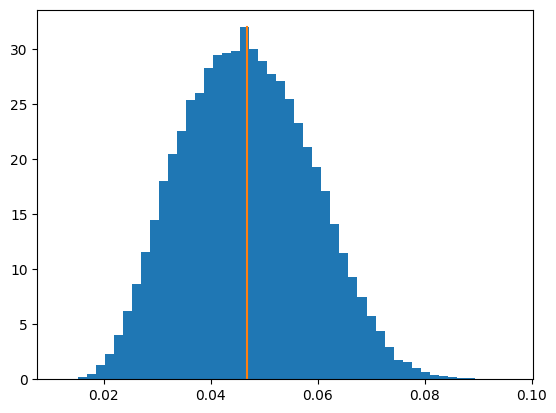

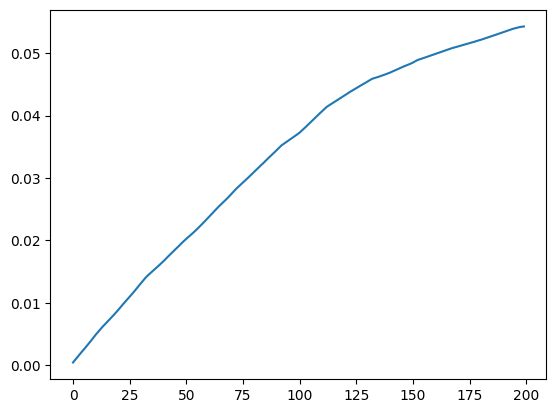

In [ ]:
aaa = (np.exp(-r*t[:-1]) * (np.maximum(q_alpha_pred[:,0,:], 0)*.025 - np.minimum(q_alpha_pred[:,1,:], 0)*.015) * h)
bbb = np.mean(aaa,0)
ccc = np.sum(aaa,1)
plt.hist(ccc, 50, density=True)
plt.plot([np.mean(ccc), np.mean(ccc)], [0,32])
print(np.mean(ccc))

plt.figure()
plt.plot(np.cumsum(aaa[0,:]))

In [ ]:
W = 3
MPR = 8
alpha = 0.99
quantile = np.zeros([W,2,N+1])
quantile[:,0,0] = np.quantile(Y[:,MPR]-Y[:,0], alpha)
quantile[:,1,0] = np.quantile(Y[:,MPR]-Y[:,0], 1-alpha)

for k in range(1,N):
  for w in range(W):
    M_ref = X.shape[0]
    X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
    NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
    Y_ref_0 = tf.reduce_sum(NN_Y_ref, axis=1)

    for n in range(k, np.minimum(k + MPR, N)):
      dW = tf.cast(np.random.normal(size=(M_ref, d)) * np.sqrt(h), tf.float32)
      inp = tf.concat([X_ref, tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
      NN_Vx_ref = tf.cast( full_model_2.network( inp ), tf.float32)

      NN_Y_temp_p = []
      for p in range(0, P_Y):
        if n < N_p[p]:
          NN_Y_temp_p.append(model_2.F_Y(X_ref, NN_Y_ref[:,p], NN_Vx_ref, dW, ind_X[p], ind_Z[p], d_p[p]))
        else:
          NN_Y_temp_p.append(tf.zeros(M_eval))
      NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
      X_ref = model_2.F_X(X_ref, dW)
    Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
    delta_Y_ref = Y_ref - Y_ref_0
    quantile[w,0,k] = np.quantile(delta_Y_ref, alpha)
    quantile[w,1,k] = np.quantile(delta_Y_ref, 1-alpha)

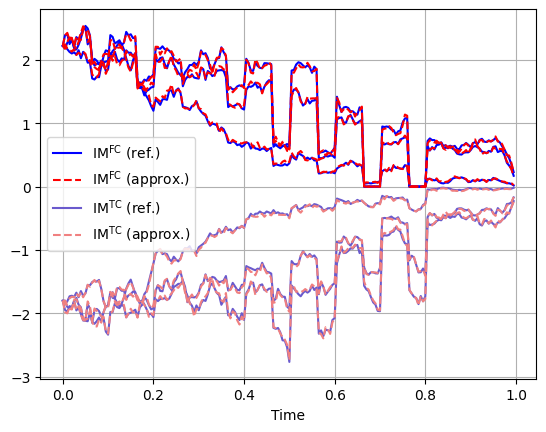

<Figure size 640x480 with 0 Axes>

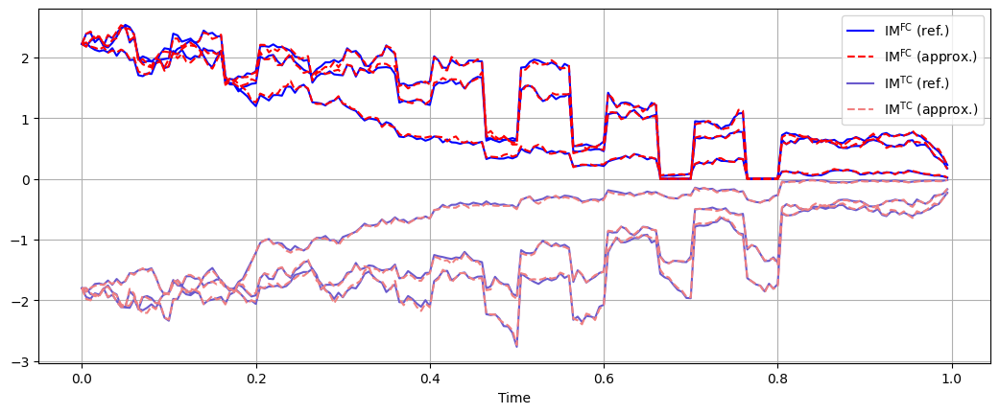

In [ ]:


plt.plot(t[:-1], np.maximum(quantile[0,0,:-1], 0 ), color='blue', label=r'$\text{IM}^{\text{FC}}$ (ref.)')  # Add label only for the first blue line
plt.plot(t[:-1], np.maximum(quantile[1:3,0,:-1].T, 0), color='blue')  # Remaining blue lines without labels

plt.plot(t[:-1], np.maximum(q_alpha_pred[0, 0, :], 0), '--', color='red', label=r'$\text{IM}^{\text{FC}}$ (approx.)')  # Add label only for the first red line
plt.plot(t[:-1], np.maximum(q_alpha_pred[1:3, 0, :].T, 0), '--', color='red')  # Remaining red lines without labels

plt.plot(t[:-1], np.minimum(quantile[0,1,:-1], 0), color='slateblue', label=r'$\text{IM}^{\text{TC}}$ (ref.)')  # Add label only for the first blue line
plt.plot(t[:-1], np.minimum(quantile[1:3,1,:-1].T, 0), color='slateblue')  # Remaining blue lines without labels

plt.plot(t[:-1], np.minimum(q_alpha_pred[0, 1, :], 0),'--', color='lightcoral', label=r'$\text{IM}^{\text{TC}}$ (approx.)')  # Add label only for the first red line
plt.plot(t[:-1], np.minimum(q_alpha_pred[1:3, 1, :].T, 0),'--', color='lightcoral')  # Remaining red lines without labels


plt.xlabel('Time')
plt.grid()
plt.legend()  # Add the legend to the plot

plt.figure()
plt.figure(figsize=(12.8,4.8))
plt.plot(t[:-1], np.maximum(quantile[0,0,:-1], 0 ), color='blue', label=r'$\text{IM}^{\text{FC}}$ (ref.)')  # Add label only for the first blue line
plt.plot(t[:-1], np.maximum(quantile[1:3,0,:-1].T, 0), color='blue')  # Remaining blue lines without labels

plt.plot(t[:-1], np.maximum(q_alpha_pred[0, 0, :], 0), '--', color='red', label=r'$\text{IM}^{\text{FC}}$ (approx.)')  # Add label only for the first red line
plt.plot(t[:-1], np.maximum(q_alpha_pred[1:3, 0, :].T, 0), '--', color='red')  # Remaining red lines without labels

plt.plot(t[:-1], np.minimum(quantile[0,1,:-1], 0), color='slateblue', label=r'$\text{IM}^{\text{TC}}$ (ref.)')  # Add label only for the first blue line
plt.plot(t[:-1], np.minimum(quantile[1:3,1,:-1].T, 0), color='slateblue')  # Remaining blue lines without labels

plt.plot(t[:-1], np.minimum(q_alpha_pred[0, 1, :], 0),'--', color='lightcoral', label=r'$\text{IM}^{\text{TC}}$ (approx.)')  # Add label only for the first red line
plt.plot(t[:-1], np.minimum(q_alpha_pred[1:3, 1, :].T, 0),'--', color='lightcoral')  # Remaining red lines without labels


plt.xlabel('Time')
plt.grid()
plt.legend()  # Add the legend to the plot

In [ ]:
W = 200
k = 39
MPR = 8
quantile_39 = np.zeros([W,2])
for w in range(W):
  M_ref = X.shape[0]
  X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
  NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
  Y_ref_0 = tf.reduce_sum(NN_Y_ref, axis=1)

  for n in range(k, k + MPR):
    dW = tf.cast(np.random.normal(size=(M_ref, d)) * np.sqrt(h), tf.float32)
    inp = tf.concat([X_ref, tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
    NN_Vx_ref = tf.cast( full_model_2.network( inp ), tf.float32)

    NN_Y_temp_p = []
    for p in range(0, P_Y):
      if n < N_p[p]:
        NN_Y_temp_p.append(model_2.F_Y(X_ref, NN_Y_ref[:,p], NN_Vx_ref, dW, ind_X[p], ind_Z[p], d_p[p]))
      else:
        NN_Y_temp_p.append(tf.zeros(M_eval))
    NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
    X_ref = model_2.F_X(X_ref, dW)
  Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
  delta_Y_ref = Y_ref - Y_ref_0
  quantile_39[w,0] = np.quantile(delta_Y_ref, alpha)
  quantile_39[w,1] = np.quantile(delta_Y_ref, 1-alpha)


In [ ]:
quantile_39.shape

(200, 2)

In [ ]:
plt.figure()
# Data for the third histogram
# Plot the histogram
plt.hist(data45, bins=50, density=True, color='gray', edgecolor='black', alpha=0.6, label=r'Emp. dist. at $t_{45}$')
# Fit a normal distribution
mean45, std45 = np.mean(data45), np.std(data45)
x45 = np.linspace(np.min(data45), np.max(data45), 1000)
pdf45 = norm.pdf(x45, mean45, std45)
# Plot the fitted normal distribution
plt.plot(x45, pdf45, color='red', label='Fitted Normal dist.')
# Calculate 99th and 1st quantiles
quantile_99 = norm.ppf(0.99, mean45, std45)
quantile_1 = norm.ppf(0.01, mean45, std45)

# Calculate y-values for theoretical quantiles
theoretical_y_99 = norm.pdf(quantile_99, mean45, std45)
theoretical_y_1 = norm.pdf(quantile_1, mean45, std45)


# Calculate empirical quantiles
empirical_quantile_99 = np.quantile(data45, 0.99)
empirical_quantile_1 = np.quantile(data45, 0.01)

# Calculate y-values for empirical quantiles
empirical_y_99 = norm.pdf(empirical_quantile_99, mean45, std45)
empirical_y_1 = norm.pdf(empirical_quantile_1, mean45, std45)

# Add vertical lines for empirical quantiles
plt.axvline(quantile_99, color='blue', linestyle='--', label='Fitted 99th Quantile')
plt.axvline(empirical_quantile_99, color='blue', linestyle='-', label='Emp. 99th Quantile')
plt.axvline(quantile_1, color='green', linestyle='--', label='Fitted 1st Quantile')
plt.axvline(empirical_quantile_1, color='green', linestyle='-', label='Emp. 1st Quantile')

text = (
    f"F. 99th Q.: {quantile_99:.3f}\n"
    f"E. 99th Q.: {empirical_quantile_99:.3f}\n"
    f"F. 1st Q.: {quantile_1:.3f}\n"
    f"E. 1st Q.: {empirical_quantile_1:.3f}"
)
plt.text(0.05, 0.1, text, transform=plt.gca().transAxes, fontsize=10, va='bottom', ha='left', bbox=dict(facecolor='white', alpha=0.8))

# Add grid, labels, legend
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.show()
plt.figure()
# Data for the third histogram
data39 = delta_Y_ref[:100000]
# Plot the histogram
plt.hist(data39, bins=50, density=True, color='gray', edgecolor='black', alpha=0.6, label=r'Emp. dist. at $t_{39}$')
# Fit a normal distribution
mean39, std39 = np.mean(data39), np.std(data39)
x39 = np.linspace(np.min(data39), np.max(data39), 1000)
pdf39 = norm.pdf(x39, mean39, std39)
# Plot the fitted normal distribution
plt.plot(x39, pdf39, color='red', label='Fitted Normal dist.')
# Calculate 99th and 1st quantiles
quantile_99 = norm.ppf(0.99, mean39, std39)
quantile_1 = norm.ppf(0.01, mean39, std39)

# Calculate empirical quantiles
empirical_quantile_99 = np.quantile(data39, 0.99)
empirical_quantile_1 = np.quantile(data39, 0.01)


# Add vertical lines for empirical quantiles
plt.axvline(quantile_99, color='blue', linestyle='--', label='Fitted 99th Quantile')
plt.axvline(empirical_quantile_99, color='blue', linestyle='-', label='Emp. 99th Quantile')
plt.axvline(quantile_1, color='green', linestyle='--', label='Fitted 1st Quantile')
plt.axvline(empirical_quantile_1, color='green', linestyle='-', label='Emp. 1st Quantile')

text = (
    f"F. 99th Q.: {quantile_99:.3f}\n"
    f"E. 99th Q.: {empirical_quantile_99:.3f}\n"
    f"F. 1st Q.: {quantile_1:.3f}\n"
    f"E. 1st Q.: {empirical_quantile_1:.3f}"
)
plt.text(0.90, 0.1, text, transform=plt.gca().transAxes, fontsize=10, va='bottom', ha='left', bbox=dict(facecolor='white', alpha=0.8))

# Add grid, labels, legend
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.show()

NameError: name 'data45' is not defined

<Figure size 640x480 with 0 Axes>

In [ ]:
k=1
W = 100
plt.plot(quantile_1[:,0], q_alpha_pred[:W,0, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_1[:,0]), np.max(quantile_1[:,0])],
    [np.min(quantile_1[:,0]), np.max(quantile_1[:,0])],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,0,k] - quantile_1[:,0])
err = np.mean(np.abs(q_alpha_pred[:W,0,k] - quantile_1[:,0]))
rel_err = np.mean(np.abs(q_alpha_pred[:W,0,k] - quantile_1[:,0])/(quantile_1[:,0]))
print(err, rel_err)

plt.figure()
plt.plot(quantile_1[:,1], q_alpha_pred[:W,1, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_1[:,1]), np.max(quantile_1[:,1])],
    [np.min(quantile_1[:,1]), np.max(quantile_1[:,1])],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,1,k] - quantile_1[:,1])

plt.figure()
k = 15
plt.plot(quantile_15[:,0], q_alpha_pred[:W,0, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_15[:,0]), np.max(quantile_15[:,0])],
    [np.min(quantile_15[:,0]), np.max(quantile_15[:,0])],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,0,k] - quantile_15[:,0])
err = np.mean(np.abs(q_alpha_pred[:W,0,k] - quantile_15[:,0]))
rel_err = np.mean(np.abs(q_alpha_pred[:W,0,k] - quantile_15[:,0])/(quantile_15[:,0]))
print(err, rel_err)

plt.figure()
plt.plot(quantile_15[:,1], q_alpha_pred[:W,1, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_15[:,1]), np.max(quantile_15[:,1])],
    [np.min(quantile_15[:,1]), np.max(quantile_15[:,1])],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,1,k] - quantile_15[:,1])

plt.figure()
k = 45
plt.plot(quantile_45[:,0], q_alpha_pred[:W,0, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_45[:,0]), np.max(quantile_45[:,0])],
    [np.min(quantile_45[:,0]), np.max(quantile_45[:,0])],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,0,k] - quantile_45[:,0])
err = np.mean(np.abs(q_alpha_pred[:W,0,k] - quantile_45[:,0]))
rel_err = np.mean(np.abs(q_alpha_pred[:W,0,k] - quantile_45[:,0])/(quantile_45[:,0]))
print(err, rel_err)

plt.figure()
plt.plot(quantile_45[:,1], q_alpha_pred[:W,1, k], '.', label=r'$IM_{t_1}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_45[:,1]), np.max(quantile_45[:,1])],
    [np.min(quantile_45[:,1]), np.max(quantile_45[:,1])],
    label=r'$IM_{t_1}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,1,k] - quantile_45[:,1])

'''
plt.figure()
k = 15
plt.plot(quantile_15, q_alpha_pred[:W, k], '.', label=r'$IM_{t_{15}}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_15), np.max(quantile_15)],
    [np.min(quantile_15), np.max(quantile_15)],
    label=r'$IM_{t_{15}}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,k] - quantile_15)
err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_15))
rel_err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_15)/(quantile_15))
print(err, rel_err)

plt.figure()
k=45
plt.plot(quantile_45, q_alpha_pred[:W, k], '.', label=r'$IM_{t_{45}}$ (Approx.)', color='blue')  # Blue scatter points
plt.plot(
    [np.min(quantile_45), np.max(quantile_45)],
    [np.min(quantile_45), np.max(quantile_45)],
    label=r'$IM_{t_{45}}$ (Ref.)',
    color='orange'
)  # Orange reference line
plt.grid()
plt.legend()  # Add legend
plt.xlabel('Quantile Reference')
plt.show()
plt.figure()
plt.hist(q_alpha_pred[:W,k] - quantile_45)
err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_45))
rel_err = np.mean(np.abs(q_alpha_pred[:W,k] - quantile_45)/(quantile_45))
print(err, rel_err)
'''

# ColVA - Neural Network Class

In [ ]:
############## Define Neural Network Classes ##############
class SubNetwork(tf.keras.Model):   # 3 call methods, "call" for Vx, "second_call" for Vxx, "y0_call" for y0 used in deep DP
    def __init__(self, dim_x, dim_w, portfolio_pars, neurons, activation, use_batnorm = False, regu_cons=[0., 0.], ini_cons=None ):
        super(SubNetwork, self).__init__()
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.m = dim_w
        self.neurons = neurons
        self.activation = activation
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.use_batnorm = use_batnorm
        self.regu_1 = tf.keras.regularizers.L2( l2=regu_cons[0] )   # should same as self.regu_1 = None
        self.regu_2 = tf.keras.regularizers.L2( l2=regu_cons[1] )
        if ini_cons == None:
          self.ini_1 = "glorot_uniform"
          self.ini_2 = "zeros"
        else:
          self.ini_1 = tf.keras.initializers.Constant(value=ini_cons[0])
          self.ini_2 = tf.keras.initializers.Constant(value=ini_cons[1])
        self.dense_layers1 = []       # 12 are for each call method below
        self.dense_layers2 = []
        self.batch_norm1 = []
        self.batch_norm2 = []
        for i in range(len(self.neurons)):
            self.dense_layers1.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.dense_layers2.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.batch_norm1.append( tf.keras.layers.BatchNormalization() )
            self.batch_norm2.append( tf.keras.layers.BatchNormalization() )
        self.dense_out = tf.keras.layers.Dense(self.d_defaultable, activation='linear', use_bias=True, \
                            kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2)

    def call(self, x_in):         # get z.
        x = x_in
        #x = tf.squeeze(x_in, axis=-1)     # x_in.shape =[B,d]
        for i in range(len(self.neurons)):
            x = self.dense_layers1[i](x)
            if self.use_batnorm:
              x = self.batch_norm1[i](x)
        x = self.dense_out(x)
        return x    # output shape = [B,P_Z]

class FullNetwork(tf.keras.Model):
    def __init__(self, N, h, dim_x, dim_w, portfolio_pars, neurons=[16,16,16], activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None):
        super(FullNetwork, self).__init__()
        self.N = N    # number of subNN
        self.h = h    # step size
        self.dim_x = dim_x
        self.dim_w = dim_w
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.portfolio_parameters = portfolio_pars
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.neurons = neurons
        self.activation = activation
        self.use_batnorm = use_batnorm
        self.regu_cons = regu_cons
        self.ini_cons = ini_cons
        self.network = SubNetwork(dim_x=self.dim_x, dim_w=self.dim_w, portfolio_pars = self.portfolio_parameters, neurons=self.neurons, activation=self.activation, \
                                           use_batnorm=self.use_batnorm, regu_cons=self.regu_cons, ini_cons=self.ini_cons)
        self.ColVA_0 = self.add_weight(name="ColVA_0", shape=[1], initializer=tf.keras.initializers.RandomUniform(minval=0.0, maxval=0.1), trainable=True)



    def call(self, x_input):    # input shape x=[B,d,1]
        # Initializations #
        NNx = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNx_reduced = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NN_ColVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_ColVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NNy = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNy_sum = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)

        if measures > 1:
          NNx2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NN_ColVA2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NNvx_ColVA2 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
          if measures >2:
            NNx3 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
            NN_ColVA3 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
            NNvx_ColVA3 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        ####################

        # Initialize tau #
        tau = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        if measures > 1:
          tau2 = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
          if measures > 2:
            tau3 = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        ##################

        # Update X_0 #
        NNx = NNx.write(0, x_input)
        if measures > 1:
          NNx2 = NNx2.write(0, x_input)
          if measures > 2:
            NNx3 = NNx3.write(0, x_input)
        NNx_reduced = NNx_reduced.write(0, NNx.read(0)[:,:d])
        ##############

        # Update ColVA_0 #
        #initial_value = tf.fill([batch_size], -0.034189181637877444)
        #NN_ColVA = NN_ColVA.write(0, initial_value)  # Broadcasting y_0
        #if measures > 1:
        #  NN_ColVA2 = NN_ColVA2.write(0, initial_value) # Broadcasting y_0
        #    if measures > 2:
        #       NN_ColVA3 = NN_ColVA3.write(0, initial_value)  # Broadcasting y_0
        NN_ColVA = NN_ColVA.write(0, tf.broadcast_to(self.ColVA_0, [batch_size]))  # Broadcasting y_0
        if measures > 1:
          NN_ColVA2 = NN_ColVA2.write(0, tf.broadcast_to(self.ColVA_0, [batch_size]))  # Broadcasting y_0
          if measures > 2:
            NN_ColVA3 = NN_ColVA3.write(0, tf.broadcast_to(self.ColVA_0, [batch_size]))  # Broadcasting y_0
        ################

        # Update Y_0 #
        NNy = NNy.write(0, tf.broadcast_to(full_model_2.y_0, [batch_size, P_Y]))
        NNy_sum = NNy_sum.write(0, tf.reduce_sum(NNy.read(0), axis=1))  # Sum over P_Y components
        ##############

        for n in range(0, self.N):
          NNdW = tf.random.normal( shape = [batch_size,self.dim_w], mean=0, stddev=np.sqrt(self.h))
          NNdW_reduced = NNdW[:,:d]
          time_tensor = tf.fill([batch_size, 1], tf.cast(n * self.h, dtype=tf.float32))

          # Update Z_MVA_n #
          inp_ColVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          NNvx_ColVA = NNvx_ColVA.write(n, self.network( inp_ColVA ))
          if measures > 1:
            inp_ColVA2 = tf.concat([NNx2.read(n), time_tensor], axis=1)
            NNvx_ColVA2 = NNvx_ColVA2.write(n, self.network( inp_ColVA2 ))
            if measures > 2:
              inp_ColVA3 = tf.concat([NNx3.read(n), time_tensor], axis=1)
              NNvx_ColVA3 = NNvx_ColVA3.write(n, self.network( inp_ColVA3 ))
          ##################

          # Update MVA_{n+1} #
          ColVA_np1 = model_3.F_ColVA(NNx.read(n), NNy_sum.read(n), NN_ColVA.read(n), NNvx_ColVA.read(n), NNdW)
          NN_ColVA = NN_ColVA.write(n+1,ColVA_np1)
          if measures > 1:
            ColVA_np1_2 = (
              model_3.F_ColVA(NNx2.read(n), NNy_sum.read(n), NN_ColVA2.read(n), NNvx_ColVA2.read(n), NNdW)
              - self.h * b1 * NNvx_ColVA2.read(n)[:, -2]
            )
            NN_ColVA2 = NN_ColVA2.write(n+1,ColVA_np1_2)
            if measures > 2:
              ColVA_np1_3 = (
                model_3.F_ColVA(NNx3.read(n), NNy_sum.read(n), NN_ColVA3.read(n), NNvx_ColVA3.read(n), NNdW)
                - self.h * b2 * NNvx_ColVA3.read(n)[:, -1]
              )
              NN_ColVA3 = NN_ColVA3.write(n+1,ColVA_np1_3)
          ####################

          # Update Y_{n+1} #
          inp_y = tf.concat([NNx_reduced.read(n), time_tensor], axis=1)
          NNvx = NNvx.write(n, full_model_2.network( inp_y ))
          NNy_temp = []
          for p in range(0,self.P_Y):
            if n < N_p[p]:
              NNy_p = model_2.F_Y(NNx_reduced.read(n), NNy.read(n)[:,p], NNvx.read(n), NNdW_reduced, self.ind_X[p], self.ind_Z[p], self.d_p[p])
            else:
              NNy_p = tf.zeros(batch_size)
            NNy_temp.append(NNy_p)
          NNy = NNy.write(n + 1,tf.stack(NNy_temp, axis=1))
          NNy_sum = NNy_sum.write(n+1, tf.reduce_sum(NNy.read(n+1), axis=1))  # Sum over P_Y components
          ##################

          # Update dW_n and X_{n+1} #
          NNx = NNx.write(n + 1, model_3.F_X_EM(NNx.read(n), NNdW))
          if measures > 1:
            CM2 = tf.constant([0, 0, 0, 0, 0, -self.h * b1, 0], dtype=tf.float32)
            CM2 = tf.tile(tf.expand_dims(CM2, axis=0), [batch_size, 1])  # Shape: (batch_size, dim_x)
            NNx2_temp = model_3.F_X_EM(NNx2.read(n), NNdW) + CM2
            NNx2 = NNx2.write(n + 1, NNx2_temp)
            if measures > 2:
              CM3 = tf.constant([0, 0, 0, 0, 0, 0, -self.h * b2], dtype=tf.float32)
              CM3 =  tf.tile(tf.expand_dims(CM3, axis=0), [batch_size, 1])  # Shape: (batch_size, dim_x)
              NNx3_temp = model_3.F_X_EM(NNx3.read(n), NNdW) + CM3
              NNx3 = NNx3.write(n + 1, NNx3_temp)
          ###########################
          NNx_reduced =  NNx_reduced.write(n + 1, NNx.read(n+1)[:,:d])
          ###########################


          # Updating tau #
          # Condition for tau1 and tau2
          condition_1 = tf.less(NNx.read(n + 1)[:, -2], B1)  # Access second-to-last column
          condition_2 = tf.less(NNx.read(n + 1)[:, -1], B2)  # Access last column
          # Update tau[:, 0] for the first time step where condition_1 is True
          tau_cond_1 = tf.where(tf.logical_and(condition_1, tf.equal(tau[:, 0], self.N + 1)), n + 1, tau[:, 0])
          # Update tau[:, 1] for the first time step where condition_2 is True
          tau_cond_2 = tf.where(tf.logical_and(condition_2, tf.equal(tau[:, 1], self.N + 1)), n + 1, tau[:, 1])
          # Update tau with new values
          tau = tf.stack([tau_cond_1, tau_cond_2], axis=1)

          if measures > 1:
            condition_1_2 = tf.less(NNx2.read(n + 1)[:, -2], B1)
            condition_2_2 = tf.less(NNx2.read(n + 1)[:, -1], B2)
            tau_cond_1_2 = tf.where(tf.logical_and(condition_1_2, tf.equal(tau2[:, 0], self.N + 1)), n + 1, tau2[:, 0])
            tau_cond_2_2 = tf.where(tf.logical_and(condition_2_2, tf.equal(tau2[:, 1], self.N + 1)), n + 1, tau2[:, 1])
            tau2 = tf.stack([tau_cond_1_2, tau_cond_2_2], axis=1)
            if measures > 2:
              condition_1_3 = tf.less(NNx3.read(n + 1)[:, -2], B1)
              condition_2_3 = tf.less(NNx3.read(n + 1)[:, -1], B2)
              tau_cond_1_3 = tf.where(tf.logical_and(condition_1_3, tf.equal(tau3[:, 0], self.N + 1)), n + 1, tau3[:, 0])
              tau_cond_2_3 = tf.where(tf.logical_and(condition_2_3, tf.equal(tau3[:, 1], self.N + 1)), n + 1, tau3[:, 1])
              tau3 = tf.stack([tau_cond_1_3, tau_cond_2_3], axis=1)
          ################

        # After the loop, compute tau_min for each sample
        tau_combined = tf.stack([
        tf.fill([batch_size], self.N),  # Ensure self.N is included
        tau[:, 0],
        tau[:, 1]
        ], axis=1)  # Shape: [batch_size, 3]

        if measures > 1:
          tau_combined2 = tf.stack([
          tf.fill([batch_size], self.N),  # Ensure self.N is included
          tau2[:, 0],
          tau2[:, 1]
          ], axis=1)

          if measures > 2:
            tau_combined3 = tf.stack([
            tf.fill([batch_size], self.N),  # Ensure self.N is included
            tau3[:, 0],
            tau3[:, 1]
            ], axis=1)

        # Compute the minimum stopping time per sample
        tau_min = tf.reduce_min(tau_combined, axis=1)  # Shape: [batch_size]

        # Convert to int32
        tau_min_int = tf.cast(tau_min, tf.int32)  # Convert to int32

        # Stack NN_MVA and transpose to shape [batch_size, N+1]
        NN_ColVA_stacked = NN_ColVA.stack()  # Shape: [N+1, batch_size]
        NN_ColVA_stacked = tf.transpose(NN_ColVA_stacked, perm=[1, 0])  # Shape: [batch_size, N+1]

        # Create indices for tf.gather_nd
        batch_indices = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
        gather_indices = tf.stack([batch_indices, tau_min_int], axis=1)  # Shape: [batch_size, 2]

        # Gather NN_MVA at tau_min for each sample
        NN_ColVA_at_tau_min = tf.gather_nd(NN_ColVA_stacked, gather_indices)  # Shape: [batch_size]

        if measures > 1:
          tau_min2 = tf.reduce_min(tau_combined2, axis=1)  # Shape: [batch_size]
          tau_min_int2 = tf.cast(tau_min2, tf.int32)  # Convert to int32
          NN_ColVA_stacked2 = NN_ColVA2.stack()
          NN_ColVA_stacked2 = tf.transpose(NN_ColVA_stacked2, perm=[1, 0])
          batch_indices2 = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
          gather_indices2 = tf.stack([batch_indices2, tau_min_int2], axis=1)
          NN_ColVA_at_tau_min2 = tf.gather_nd(NN_ColVA_stacked2, gather_indices2)  # Shape: [batch_size]

          if measures > 2:
            tau_min3 = tf.reduce_min(tau_combined3, axis=1)  # Shape: [batch_size]
            tau_min_int3 = tf.cast(tau_min3, tf.int32)  # Convert to int32
            NN_ColVA_stacked3 = NN_ColVA3.stack()
            NN_ColVA_stacked3 = tf.transpose(NN_ColVA_stacked3, perm=[1, 0])
            batch_indices3 = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
            gather_indices3 = tf.stack([batch_indices3, tau_min_int3], axis=1)
            NN_ColVA_at_tau_min3 = tf.gather_nd(NN_ColVA_stacked3, gather_indices3)  # Shape: [batch_size]
          else:
            NN_ColVA_at_tau_min3 = tf.constant(0., dtype=tf.float32)
        else:
          NN_ColVA_at_tau_min2 = tf.constant(0., dtype=tf.float32)
          NN_ColVA_at_tau_min3 = tf.constant(0., dtype=tf.float32)

        # Compute the loss
        loss_final = tf.stack([
            tf.reduce_mean(NN_ColVA_at_tau_min ** 2),
            tf.reduce_mean(NN_ColVA_at_tau_min2 ** 2),
            tf.reduce_mean(NN_ColVA_at_tau_min3 ** 2)
        ])

        return NN_ColVA.read(0)[0], loss_final

# ColVA - train neural network


Start of epoch 0


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'sub_network_18', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Training total loss at step 0: 0.04393778
Individual loss components:  [0.0171186  0.0143331  0.01248608]
Seen so far: 2048 samples
The current learning rate is 0.0049980474
ColVA_0 (approx.):  0.06559402 CVA_0 (ref.):  0.0
Time elapsed 954.1543047428131

Start of epoch 1
Training total loss at step 0: 0.00002745
Individual loss components:  [6.8615391e-06 1.1481543e-05 9.1024040e-06]
Seen so far: 2048 samples
The current learning rate is 0.0040920554
ColVA_0 (approx.):  -0.05113382 CVA_0 (ref.):  0.0
Time elapsed 379.95533061027527

Start of epoch 2
Training total loss at step 0: 0.00001603
Individual loss components:  [3.4715497e-06 7.2250423e-06 5.3324165e-06]
Seen so far: 2048 samples
The current learning rate is 0.0033502914
ColVA_0 (approx.):  -0.05119969 CVA_0 (ref.):  0.0
Time elapsed 380.37802624702454

Start of epoch 3
Training total loss at step 0: 0.00001462
Individual loss components:  [3.1475820e-06 7.3426077e-06 4.1280800e-06]
Seen so far: 2048 samples
The current learni

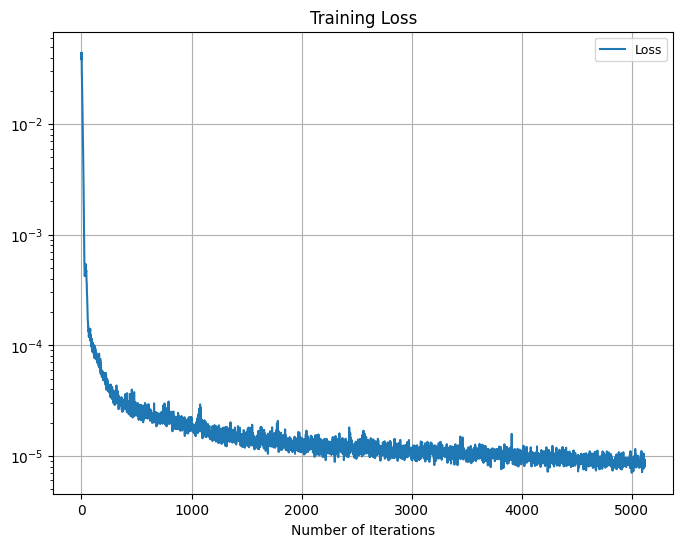

In [ ]:
# NN params
num_epochs = 10
batch_size = 2**11 #2**12
initial_lr = 0.005
neurons = [50,50,50,50]
M_train = 2**20  # Number training of samples
###########

sigma_defaultable = tf.constant([0.2, 0.25, 0.25, 0.25, 0.3, 0.2, 0.3], dtype=tf.float32)
corr_matrix_defaultable = tf.constant([
    [1.0, 0.9, 0.2, 0.5, 0.1, 0.1, 0.2],
    [0.9, 1.0, 0.4, 0.3, 0.2, 0.3, 0.2],
    [0.2, 0.4, 1.0, 0.2, 0.75, 0.15, 0.25],
    [0.5, 0.3, 0.2, 1.0, 0.35, 0.05, 0.15],
    [0.1, 0.2, 0.75, 0.35, 1.0, 0.15, 0.05],
    [0.1, 0.3, 0.15, 0.05, 0.15, 1.0, 0.25],
    [0.2, 0.2, 0.25, 0.15, 0.05, 0.25, 1.0]
], dtype=tf.float32)
L_defaultable = np.linalg.cholesky(corr_matrix_defaultable)


# Prepare the training dataset
B1 = 0.575
B2 = 0.675
measures = 3
b1 = 0.35
b2 = 0.2
d_defaultable = d + 2
x0 = np.ones([M_train,d_defaultable])
x0_tf = tf.convert_to_tensor(x0, dtype=tf.float32)
x_train = x0_tf    # shape = [M_train, dim_x, 1]
y_train = tf.zeros( [M_train, 1] )
train_dataset = tf.data.Dataset.from_tensor_slices( (x_train, y_train) )
#train_dataset = train_dataset.shuffle(buffer_size=batch_size*10).batch(batch_size)  # buffer_size doesn't matter in this code
train_dataset = train_dataset.batch(batch_size)

model_parameters_3 = ['GBM', h, d_defaultable, r, sigma_defaultable, L_defaultable]
model_3 = ModelClass(model_parameters_3)
portfolio_parameters_tf = [P_Y, P_Z, ind_X, ind_Z, d_p, K_p]
ColVA_model = FullNetwork(N=N, h=h, dim_x=d_defaultable, dim_w=d_defaultable, portfolio_pars = portfolio_parameters_tf, \
            neurons=neurons, activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None)


ColVA_0_history = []
loss_history = []
lr_history = []
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_lr, decay_steps=int(M_train/batch_size), decay_rate=tf.math.exp(-0.2), staircase=False)
optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
#optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule)

# customize loss function
def dummy_loss(y_true, y_model):
    return y_model  # Return the full list of losses

@tf.function
def train_step(input_x, input_y):
    with tf.GradientTape() as tape:
        # Unpack the outputs from the model
        NN_ColVA_0, loss_components = ColVA_model(input_x, training=True)
        # Compute the total loss as an equal-weighted sum of the three components
        total_loss = tf.reduce_sum(loss_components)
    # Compute gradients
    grads = tape.gradient(total_loss, ColVA_model.trainable_weights)
    # Apply gradients to update the model weights
    optimizer.apply_gradients(zip(grads, ColVA_model.trainable_weights))
    return [NN_ColVA_0, total_loss, grads, loss_components]

# Customized train loop
start = time.time()
for epoch in range(num_epochs):
    print("\nStart of epoch %d" % (epoch,))
    # Iterate over the batches of the dataset.
    for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
        output_train = train_step(x_batch_train, y_batch_train)
        NN_ColVA_0 = output_train[0].numpy()
        total_loss_value = output_train[1].numpy()
        loss_components = output_train[3].numpy()  # Get individual loss components

        ColVA_0_history.append(NN_ColVA_0)
        loss_history.append(total_loss_value)
        lr_history.append(lr_schedule(optimizer.iterations).numpy())

        if step == 0:
            print("Training total loss at step %d: %.8f" % (step, float(total_loss_value)))
            print("Individual loss components: ", loss_components)
            print("Seen so far: %s samples" % ((step + 1) * batch_size))
            print("The current learning rate is", lr_schedule(optimizer.iterations).numpy())
            print('ColVA_0 (approx.): ', NN_ColVA_0, 'CVA_0 (ref.): ', 0.)
            end = time.time()
            print('Time elapsed', end - start)
            start = time.time()


######################### print loss and save loss history and learning rate history
plt.figure(figsize=(8, 6))
plt.plot(loss_history, label='Loss')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.yscale('log')
plt.grid()
plt.show()

# ColVA - Store parameters

In [ ]:
### Saves locally ###

# Define the time steps extension
extension = "200_m3"

# Create directories for weights and parameters if they don't exist
os.makedirs('path_to_weights', exist_ok=True)
os.makedirs('path_to_parameters', exist_ok=True)

# Save the weights with the time steps extension
weights_path = f'path_to_weights/ColVA_model_weights{extension}.weights.h5'
ColVA_model.save_weights(weights_path)


# Define the parameters to save
params_to_save = {
    'model_parameters_3': model_parameters_3,
    'portfolio_parameters_tf': portfolio_parameters_tf,
    'num_epochs': num_epochs,
    'batch_size': batch_size,
    'initial_lr': initial_lr,
    'neurons': neurons,
    'M_train': M_train,
    'N': N,
    'd_defaultable': d_defaultable,
    'T': T,
    't': t,
    'h': h,
    'r': r,
    'x0': x0,
    'sigma_defaultable': sigma_defaultable,
    'corr_matrix_defaultable': corr_matrix_defaultable,
    'L_defaultable': L_defaultable,
    'B1': B1,
    'B2': B2,
    'measures': measures,
    'b1': b1,
    'b2': b2,
    'ind_X': ind_X,
    'd_p': d_p,
    'P_Y': P_Y,
    'P_Z': P_Z,
    'K_p': K_p,
    'N_p': N_p,
    'T_p': T_p,
    'ind_Z': ind_Z,
    'MC_prices_0': MC_prices_0,
    'MC_prices': MC_prices
}

# Save the parameters with the time steps extension
parameters_path = f'path_to_parameters/ColVA_parameters{extension}.pkl'
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save, f)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')



# Define paths in Google Drive with the extension
weights_path = f'/content/drive/MyDrive/ColVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/ColVA_parameters{extension}.pkl'

# Save the weights to Google Drive
ColVA_model.save_weights(weights_path)

# Function to convert TensorFlow tensors to NumPy arrays
def convert_tensors(obj):
    if isinstance(obj, tf.Tensor):
        return obj.numpy()
    elif isinstance(obj, list):
        return [convert_tensors(item) for item in obj]
    elif isinstance(obj, dict):
        return {key: convert_tensors(value) for key, value in obj.items()}
    else:
        return obj

# Convert TensorFlow tensors to NumPy arrays
params_to_save_converted = convert_tensors(params_to_save)

# Save the parameters to Google Drive
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save_converted, f)

print(f"Weights saved to {weights_path}")
print(f"Parameters saved to {parameters_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Weights saved to /content/drive/MyDrive/ColVA_model_weights200_m3.weights.h5
Parameters saved to /content/drive/MyDrive/ColVA_parameters200_m3.pkl


# ColVA - Load parameters

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pickle
import tensorflow as tf

# Define the extension for the file names
extension = "200_m2"  # Use "" for old parameters without extensions, or "_200" for new ones

# Define paths using the extension
weights_path = f'/content/drive/MyDrive/ColVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/ColVA_parameters{extension}.pkl'

# Load the parameters
with open(parameters_path, 'rb') as f:
    params_loaded = pickle.load(f)

# Reconstruct necessary variables and model as before
model_parameters_3 = params_loaded['model_parameters_3']
portfolio_parameters_tf = params_loaded['portfolio_parameters_tf']
neurons = params_loaded['neurons']
N = params_loaded['N']
h = params_loaded['h']
d_defaultable = params_loaded['d_defaultable']
T = params_loaded['T']
t = params_loaded['t']
r = params_loaded['r']
sigma_defaultable = params_loaded['sigma_defaultable']
corr_matrix_defaultable = params_loaded['corr_matrix_defaultable']
L_defaultable = params_loaded['L_defaultable']
B1 = params_loaded['B1']
B2 = params_loaded['B2']
measures = params_loaded['measures']
b1 = params_loaded['b1']
b2 = params_loaded['b2']
batch_size = params_loaded['batch_size']
x0_tf = tf.convert_to_tensor(params_loaded['x0'], dtype=tf.float32)
M_train = params_loaded['M_train']
P_Y = params_loaded['P_Y']
P_Z = params_loaded['P_Z']
ind_X = params_loaded['ind_X']
ind_Z = params_loaded['ind_Z']
d_p = params_loaded['d_p']
K_p = params_loaded['K_p']
N_p = params_loaded['N_p']
T_p = params_loaded['T_p']
MC_prices_0 = params_loaded['MC_prices_0']
MC_prices = params_loaded['MC_prices']

model_3 = ModelClass(model_parameters_3)

# Instantiate the model
ColVA_model = FullNetwork(
    N=N,
    h=h,
    dim_x=d_defaultable,
    dim_w=d_defaultable,
    portfolio_pars=portfolio_parameters_tf,
    neurons=neurons,
    activation='relu',
    use_batnorm=False,
    regu_cons=[0., 0.],
    ini_cons=None
)

# Initialize the model before loading weights
dummy_input = x0_tf[:batch_size, :]  # shape = [2048, d_defaultable], for example
_ = ColVA_model(dummy_input)  # Forces the top-level build


# Load the weights from Google Drive
ColVA_model.load_weights(weights_path)

print(f"Weights and parameters loaded successfully from {weights_path} and {parameters_path}")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 124, in error_handler
    del filtered_tb  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__
    return call_fn(*args, **kwargs)  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_u

Weights and parameters loaded successfully from /content/drive/MyDrive/ColVA_model_weights200_m2.weights.h5 and /content/drive/MyDrive/ColVA_parameters200_m2.pkl


# ColVA - Evaluation

In [ ]:
# Initialize parameters
push_bank_def = False
np.random.seed(0)
M_eval = 2**16
X = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
X[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)
X_reduced = np.zeros([N+1, M_eval, d], dtype=np.float32)
X_reduced[0] = X[0][:,:d]

NN_Y = np.zeros([N+1, M_eval, P_Y], dtype=np.float32)
NN_Y[0] = np.tile(full_model_2.y_0.numpy(), (M_eval, 1))

Y = np.zeros([N+1, M_eval], dtype=np.float32)
Y[0] = np.sum(NN_Y[0], axis=1)

NN_Vx = np.zeros([N, M_eval, P_Z], dtype=np.float32)

ColVA = np.zeros([M_eval, N+1], dtype=np.float32)
ColVA[:, 0] = ColVA_model.ColVA_0.numpy()
ColVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)
inp_ColVA = np.concatenate([X[0], np.zeros([M_eval, 1], dtype=np.float32)], axis=1)
ColVAx[:, :, 0] = ColVA_model.network(inp_ColVA)

tau = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]

# Main loop
for n in range(N):
    dW = np.random.normal(size=(M_eval, d_defaultable)) * np.sqrt(h)
    dW_reduced = dW[:,:d]

    # Update ColVAx
    inp_ColVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    ColVAx[:, :, n] = ColVA_model.network(inp_ColVA)

    # Compute ColVA[:, n+1]
    ColVA[:, n+1] = model_3.F_ColVA(X[n], Y[n], ColVA[:, n], ColVAx[:, :, n], dW)
    if push_bank_def:
        ColVA[:, n+1] = ColVA[:, n+1] - b1 * ColVAx[:,-2,n] * h

    # Update NN_Vx
    inp_y = np.concatenate([X_reduced[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    NN_Vx[n] = full_model_2.network(inp_y).numpy()
    for p in range(P_Y):
        if n < N_p[p]:
            NN_Y[n+1, :, p] = model_2.F_Y(X_reduced[n], NN_Y[n, :, p], NN_Vx[n], dW_reduced, ind_X[p], ind_Z[p], d_p[p])
    Y[n+1] = np.sum(NN_Y[n+1], axis=1)

    # Update X[n+1]
    X[n+1] = model_3.F_X(X[n], dW)
    if push_bank_def:
        X[n+1] = X[n+1] - np.array([0, 0, 0, 0, 0, b1 * h, 0], dtype=np.float32)
    X_reduced[n+1] = X[n+1][:,:d]
    # Update tau
    condition_1 = X[n+1, :, -2] < B1  # Access second-to-last column
    condition_2 = X[n+1, :, -1] < B2  # Access last column
    tau[:, 0] = np.where(np.logical_and(condition_1, tau[:, 0] == N + 1), n + 1, tau[:, 0])
    tau[:, 1] = np.where(np.logical_and(condition_2, tau[:, 1] == N + 1), n + 1, tau[:, 1])

    # Compute tau_min
    tau_combined = np.vstack([np.full(M_eval, N), tau[:, 0], tau[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min = np.min(tau_combined, axis=1)  # Shape: [M_eval]

    # Create active masks using <= instead of <
    active_n = (n <= tau_min).astype(float)      # Paths active at time n
    active_n1 = (n + 1 <= tau_min).astype(float)  # Paths active at time n+1

tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]

# Post-processing
X = np.transpose(X, axes=[1, 2, 0])
NN_Y = np.transpose(NN_Y, axes=[1, 2, 0])
NN_Vx = np.transpose(NN_Vx, axes=[1, 2, 0])

for p in range(P_Y):
    NN_Vx[:, N_p[p]:, ind_Z[p]:ind_Z[p]+d_p[p]] = 0

YT = []
Y0 = []
for p in range(P_Y):
    YT_p = model_2.g(X[:, :, N_p[p]], K_p[p], ind_X[p], d_p[p])
    YT.append(YT_p)
    Y0.append(np.exp(-r * T_p[p]) * np.mean(YT_p))

Y = np.sum(NN_Y, axis=1)

In [ ]:
# Comopute reference solution for ColVA_0
tau_min = tau_min.astype(int)  # Shape: [M_eval]
# Compute the term inside the sum
r_col_lending = 0.085
r_col_borrowing = 0.075
col_frac = 0.5
term = np.exp(-r * (t[:-1])) * (
   (r - r_col_lending) * col_frac * np.maximum(Y[:,:-1],0) + (r - r_col_borrowing) * col_frac * np.minimum(Y[:,:-1],0)
) * h  # Shape: [M_eval, N]

# Create the mask based on tau_min
mask = np.arange(N)[np.newaxis, :] < tau_min[:, np.newaxis]  # Shape: [M_eval, N]
# Apply the mask to the term
masked_term = term * mask  # Shape: [M_eval, N]
# Sum over time steps for each path
S = np.sum(masked_term, axis=1)  # Shape: [M_eval]
# Compute MVA_0 as the mean over all paths
ColVA_0 = np.mean(S)
ColVA_0

-0.05130290548174944

In [ ]:
# To find an index when the bank defaults
tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]
bank_def_0 = bank_def_index[np.argmin(tau_combined[bank_def_index,1])]
tau_combined[bank_def_0-4:bank_def_0+4]
print('P(Counterparty def.): ', 1/M_eval*len(counterparty_def_index))
print('P(Bank def.): ', 1/M_eval*len(bank_def_index))
bank_def_0


P(Counterparty def.):  0.16925048828125
P(Bank def.):  0.001922607421875


7744

No defaul:  0.828826904296875 Counterparty defaults:  0.16925048828125 Bank Defaults:  0.001922607421875
MSE no def.:  1.049523e-06 MSE counterparty def.:  4.887494e-06 MSE bank def.:  2.7247243e-06


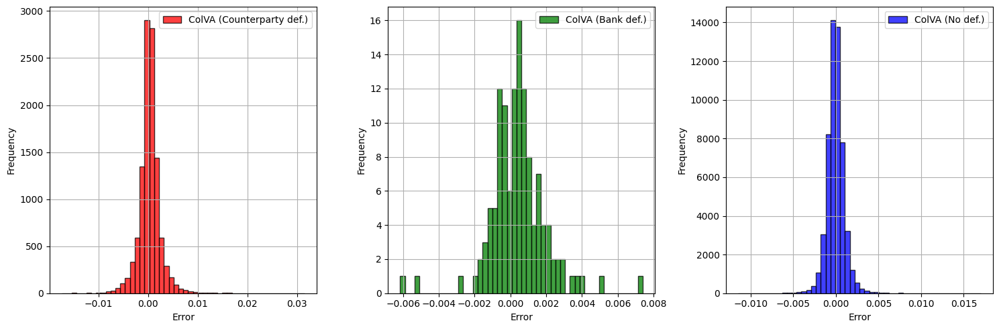

In [ ]:
tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]

# Compute terminal values of CVA
ColVA_terminal = ColVA[np.arange(len(tau_min)), tau_min]  # Shape: (4096,)


# Separate terminal errors by event type
errors_no_def = ColVA_terminal[no_def_index]
errors_bank_def = ColVA_terminal[bank_def_index]
errors_counterparty_def = ColVA_terminal[counterparty_def_index]

print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('MSE no def.: ', np.mean(errors_no_def**2), 'MSE counterparty def.: ', np.mean(errors_counterparty_def**2), 'MSE bank def.: ', np.mean(errors_bank_def**2))


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), tight_layout=True)

# Subplot 1
axes[0].hist(errors_counterparty_def, bins=50, alpha=0.75, color='red', edgecolor='black', label='ColVA (Counterparty def.)')
axes[0].set_xlabel('Error')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True)

# Subplot 2
axes[1].hist(errors_bank_def, bins=50, alpha=0.75, color='green', edgecolor='black', label='ColVA (Bank def.)')
axes[1].set_xlabel('Error')
axes[1].set_ylabel('Frequency')
axes[1].legend()
axes[1].grid(True)

# Subplot 3
axes[2].hist(errors_no_def, bins=50, alpha=0.75, color='blue', edgecolor='black', label='ColVA (No def.)')
axes[2].set_xlabel('Error')
axes[2].set_ylabel('Frequency')
axes[2].legend()
axes[2].grid(True)

plt.show()

In [ ]:
np.random.seed(1)
W = 3
w_0 = bank_def_0
M_ref = 2**12 #2**10
ColVA_w = np.zeros([W,N+1])
ColVA_w[:,0] = ColVA_0

for k in range(1,N):
  print('k: ', k)
  for w in range(w_0, w_0 + W):
    alive = tf.ones(M_ref)
    X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
    NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
    Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
    C = np.zeros([M_ref, N+1])
    C[:,k] = col_frac * Y_ref
    for n in range(k, N):
      dW = tf.cast(np.random.normal(size=(M_ref, d+2)) * np.sqrt(h), tf.float32)

      # defaulted or not #
      alive = alive * tf.cast(X_ref[:, -2] > B1, dtype=tf.float32) * tf.cast(X_ref[:, -1] > B2, dtype=tf.float32)
      # Update Y
      inp_y = tf.concat([X_ref[:,:d], tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
      NN_Vx_ref = tf.cast( full_model_2.network( inp_y ), tf.float32)
      NN_Y_temp_p = []
      for p in range(0, P_Y):
        if n < N_p[p]:
          NN_Y_temp_p.append(model_2.F_Y(X_ref[:,:d], NN_Y_ref[:,p], NN_Vx_ref, dW[:,:d], ind_X[p], ind_Z[p], d_p[p]))
        else:
          NN_Y_temp_p.append(tf.zeros(M_ref))
      NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
      Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
      C[:,n+1] = col_frac * Y_ref * alive
      ##########

      # Update X #
      X_ref = model_3.F_X(X_ref, dW)
      ############
    term = np.exp(-r * (t[:-1])) * (
        (r - r_col_lending) * np.maximum(C[:,:-1],0) + (r - r_col_borrowing) * np.minimum(C[:,:-1],0)
        ) * h
    ColVA_w[w-w_0,k] = np.mean( np.sum(term, 1) )

for w in range(w_0, w_0 + W):
  ColVA_w[w-w_0,tau_min[w]:] = 0

k:  1
k:  2
k:  3
k:  4
k:  5
k:  6
k:  7
k:  8
k:  9
k:  10
k:  11
k:  12
k:  13
k:  14
k:  15
k:  16
k:  17
k:  18
k:  19
k:  20
k:  21
k:  22
k:  23
k:  24
k:  25
k:  26
k:  27
k:  28
k:  29
k:  30
k:  31
k:  32
k:  33
k:  34
k:  35
k:  36
k:  37
k:  38
k:  39
k:  40
k:  41
k:  42
k:  43
k:  44
k:  45
k:  46
k:  47
k:  48
k:  49
k:  50
k:  51
k:  52
k:  53
k:  54
k:  55
k:  56
k:  57
k:  58
k:  59
k:  60
k:  61
k:  62
k:  63
k:  64
k:  65
k:  66
k:  67
k:  68
k:  69
k:  70
k:  71
k:  72
k:  73
k:  74
k:  75
k:  76
k:  77
k:  78
k:  79
k:  80
k:  81
k:  82
k:  83
k:  84
k:  85
k:  86
k:  87
k:  88
k:  89
k:  90
k:  91
k:  92
k:  93
k:  94
k:  95
k:  96
k:  97
k:  98
k:  99
k:  100
k:  101
k:  102
k:  103
k:  104
k:  105
k:  106
k:  107
k:  108
k:  109
k:  110
k:  111
k:  112
k:  113
k:  114
k:  115
k:  116
k:  117
k:  118
k:  119
k:  120
k:  121
k:  122
k:  123
k:  124
k:  125
k:  126
k:  127
k:  128
k:  129
k:  130
k:  131
k:  132
k:  133
k:  134
k:  135
k:  136
k:  137
k:  138
k:  

In [ ]:
ColVA_m1[1:,:].shape
ColVA[w_0+1:w_0+3,:]=ColVA_m1[1:,:]



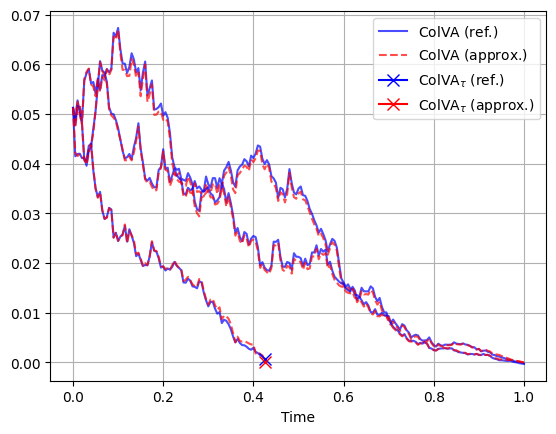

In [ ]:
for i, w in enumerate(range(w_0, w_0+W)):
    tau_w = tau_min[w]

    # Slice up to and including the default time (or final time)
    t_slice = t[:tau_w+1]
    # Reference ColVA sample path
    colva_slice = -ColVA[w, :tau_w+1]
    # Approximation sample path
    colva_w_slice = -ColVA_w[w - w_0, :tau_w+1]  # adjust index if needed

    # Plot the reference path
    plt.plot(
        t_slice, colva_slice,
        linestyle='-', alpha=0.7, color='blue',
        label=r'$\text{ColVA (ref.)}$' if i == 0 else ""
    )
    # Plot the approximation path
    plt.plot(
        t_slice, colva_w_slice,
        linestyle='--', alpha=0.7, color='red',
        label=r'$\text{ColVA (approx.)}$' if i == 0 else ""
    )

    # If this path defaults before index 200, put an "x" at the final point
    if tau_w < 200:
        # Blue cross for the reference
        plt.plot(
            t[tau_w], -ColVA[w, tau_w],
            marker='x', color='blue', markersize=8,
            label=r'$\text{ColVA}_{\tau}$ (ref.)' if i == 0 else ""
        )
        # Red cross for the approximation
        plt.plot(
            t[tau_w], -ColVA_w[w - w_0, tau_w],
            marker='x', color='red', markersize=8,
            label=r'$\text{ColVA}_{\tau}$ (approx.)' if i == 0 else ""
        )

plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()


<ipython-input-118-8c175632920c>:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')
<ipython-input-118-8c175632920c>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


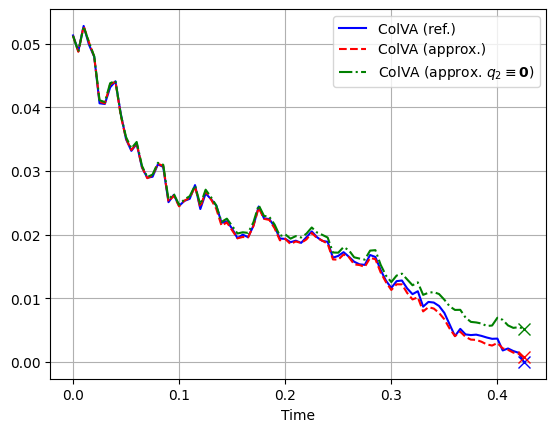

<Figure size 640x480 with 0 Axes>

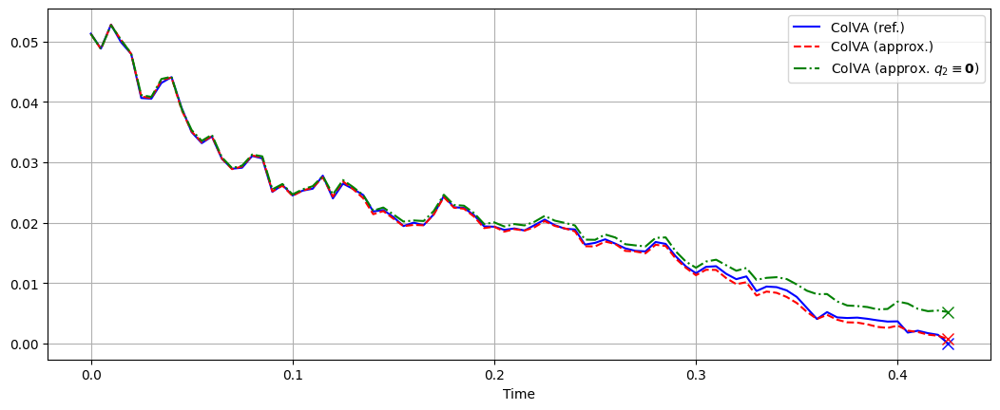

In [ ]:
plt.plot(t[:86],-ColVA_w[0,:86], color='blue')
plt.plot(t[:86],-ColVA[w_0,:86], '--', color = 'red')
plt.plot(t[:86], -ColVA_m1[0,:86], '-.', color='green')
plt.plot(t[85], -ColVA_w[0, 85],marker='x', color='blue', markersize=8)
plt.plot(t[85], -ColVA_m1[0, 85],marker='x', color='green', markersize=8)
plt.plot(t[85], -ColVA[w_0, 85],marker='x', color='red', markersize=8)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Time')
plt.legend(['ColVA (ref.)', 'ColVA (approx.)', r'ColVA (approx. $q_2\equiv \mathbf{0}$)'])



plt.figure()
plt.figure(figsize=(12.8,4.8))
plt.plot(t[:86],-ColVA_w[0,:86], color='blue')
plt.plot(t[:86],-ColVA[w_0,:86], '--', color = 'red')
plt.plot(t[:86], -ColVA_m1[0,:86], '-.', color='green')
plt.plot(t[85], -ColVA_w[0, 85],marker='x', color='blue', markersize=8)
plt.plot(t[85], -ColVA_m1[0, 85],marker='x', color='green', markersize=8)
plt.plot(t[85], -ColVA[w_0, 85],marker='x', color='red', markersize=8)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Time')
plt.legend(['ColVA (ref.)', 'ColVA (approx.)', r'ColVA (approx. $q_2\equiv \mathbf{0}$)'])


In [ ]:
ColVAx_m2 = ColVAx[w_0, :, :84]
EColVAx_m2 = np.mean(-ColVAx[bank_def_index,5,:84],0)

<ipython-input-110-99c6d8c97a87>:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


Text(0.5, 0, 'Time')

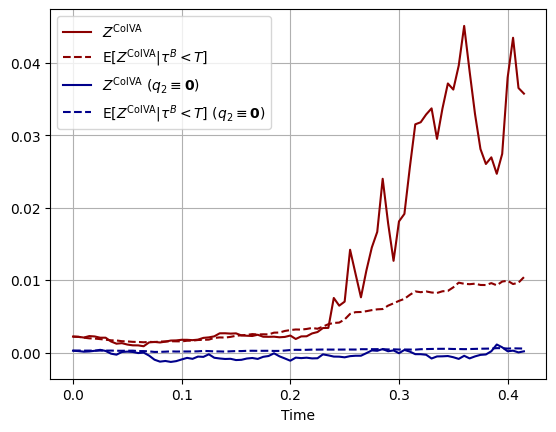

In [ ]:
plt.plot(t[:84],-ColVAx_m2[5,:], color='darkred')
plt.plot(t[:84], EColVAx_m2,'--', color= 'darkred')
plt.plot(t[:84],-ColVAx[w_0, 5, :84], color = 'darkblue')
plt.plot(t[:84],-np.mean(ColVAx[bank_def_index, 5, :84],0),'--', color = 'darkblue')


plt.grid()
plt.legend(loc='best')
plt.legend([r'$Z^\text{ColVA}$', r'E$[Z^\text{ColVA}|\tau^B<T]$', r'$Z^\text{ColVA}$ ($q_2\equiv \mathbf{0}$)', r'E$[Z^\text{ColVA}|\tau^B<T]$ ($q_2\equiv \mathbf{0}$)',])
plt.xlabel('Time')





# MVA - Neural Network Class

In [ ]:
############## Define Neural Network Classes ##############
class SubNetwork(tf.keras.Model):   # 3 call methods, "call" for Vx, "second_call" for Vxx, "y0_call" for y0 used in deep DP
    def __init__(self, dim_x, dim_w, portfolio_pars, neurons, activation, use_batnorm = False, regu_cons=[0., 0.], ini_cons=None ):
        super(SubNetwork, self).__init__()
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.m = dim_w
        self.neurons = neurons
        self.activation = activation
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.use_batnorm = use_batnorm
        self.regu_1 = tf.keras.regularizers.L2( l2=regu_cons[0] )   # should same as self.regu_1 = None
        self.regu_2 = tf.keras.regularizers.L2( l2=regu_cons[1] )
        if ini_cons == None:
          self.ini_1 = "glorot_uniform"
          self.ini_2 = "zeros"
        else:
          self.ini_1 = tf.keras.initializers.Constant(value=ini_cons[0])
          self.ini_2 = tf.keras.initializers.Constant(value=ini_cons[1])
        self.dense_layers1 = []       # 12 are for each call method below
        self.dense_layers2 = []
        self.batch_norm1 = []
        self.batch_norm2 = []
        for i in range(len(self.neurons)):
            self.dense_layers1.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.dense_layers2.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.batch_norm1.append( tf.keras.layers.BatchNormalization() )
            self.batch_norm2.append( tf.keras.layers.BatchNormalization() )
        self.dense_out = tf.keras.layers.Dense(self.d_defaultable, activation='linear', use_bias=True, \
                            kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2)

    def call(self, x_in):         # get z.
        x = x_in
        #x = tf.squeeze(x_in, axis=-1)     # x_in.shape =[B,d]
        for i in range(len(self.neurons)):
            x = self.dense_layers1[i](x)
            if self.use_batnorm:
              x = self.batch_norm1[i](x)
        x = self.dense_out(x)
        return x    # output shape = [B,P_Z]

class FullNetwork(tf.keras.Model):
    def __init__(self, N, h, dim_x, dim_w, portfolio_pars, neurons=[16,16,16], activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None):
        super(FullNetwork, self).__init__()
        self.N = N    # number of subNN
        self.h = h    # step size
        self.dim_x = dim_x
        self.dim_w = dim_w
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.portfolio_parameters = portfolio_pars
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.neurons = neurons
        self.activation = activation
        self.use_batnorm = use_batnorm
        self.regu_cons = regu_cons
        self.ini_cons = ini_cons
        self.network = SubNetwork(dim_x=self.dim_x, dim_w=self.dim_w, portfolio_pars = self.portfolio_parameters, neurons=self.neurons, activation=self.activation, \
                                           use_batnorm=self.use_batnorm, regu_cons=self.regu_cons, ini_cons=self.ini_cons)
        self.MVA_0 = self.add_weight(name="MVA_0", shape=[1], initializer=tf.keras.initializers.RandomUniform(minval=0.0, maxval=0.1), trainable=True)



    def call(self, x_input):    # input shape x=[B,d,1]
        # Initializations #
        NNx = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNx_reduced = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NN_MVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_MVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NNy = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNy_sum = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NN_IM = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)

        if measures > 1:
          NNx2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NN_MVA2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NNvx_MVA2 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
          if measures >2:
            NNx3 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
            NN_MVA3 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
            NNvx_MVA3 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        ####################

        # Initialize tau #
        tau = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        if measures > 1:
          tau2 = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
          if measures > 2:
            tau3 = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        ##################

        # Update X_0 #
        NNx = NNx.write(0, x_input)
        if measures > 1:
          NNx2 = NNx2.write(0, x_input)
          if measures > 2:
            NNx3 = NNx3.write(0, x_input)
        NNx_reduced = NNx_reduced.write(0, NNx.read(0)[:,:d])
        ##############

        # Update MVA_0 #
        #initial_value = tf.fill([batch_size], -0.034189181637877444)
        #NN_MVA = NN_MVA.write(0, initial_value)  # Broadcasting y_0
        #if measures > 1:
        #  NN_MVA2 = NN_MVA2.write(0, initial_value) # Broadcasting y_0
        #    if measures > 2:
        #       NN_MVA3 = NN_MVA3.write(0, initial_value)  # Broadcasting y_0
        NN_MVA = NN_MVA.write(0, tf.broadcast_to(self.MVA_0, [batch_size]))  # Broadcasting y_0
        if measures > 1:
          NN_MVA2 = NN_MVA2.write(0, tf.broadcast_to(self.MVA_0, [batch_size]))  # Broadcasting y_0
          if measures > 2:
            NN_MVA3 = NN_MVA3.write(0, tf.broadcast_to(self.MVA_0, [batch_size]))  # Broadcasting y_0
        ################

        mean_MVA = []
        mean_MVA.append( tf.reduce_mean(NN_MVA.read(0)))

        # Update Y_0 #
        NNy = NNy.write(0, tf.broadcast_to(full_model_2.y_0, [batch_size, P_Y]))
        NNy_sum = NNy_sum.write(0, tf.reduce_sum(NNy.read(0), axis=1))  # Sum over P_Y components
        ##############

        # Update IM_0 #
        q_99 = tf.cast(q_alpha_high_0, dtype=tf.float32)
        q_01 = tf.cast(q_alpha_low_0, dtype=tf.float32)

        NN_IM_0 = tf.stack([tf.fill([batch_size], q_99), tf.fill([batch_size], q_01)], axis=1)
        NN_IM = NN_IM.write(0, NN_IM_0)
        ###############
        for n in range(0, self.N):
          NNdW = tf.random.normal( shape = [batch_size,self.dim_w], mean=0, stddev=np.sqrt(self.h))
          NNdW_reduced = NNdW[:,:d]
          time_tensor = tf.fill([batch_size, 1], tf.cast(n * self.h, dtype=tf.float32))

          # Update Z_MVA_n #
          inp_MVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          NNvx_MVA = NNvx_MVA.write(n, self.network( inp_MVA ))
          if measures > 1:
            inp_MVA2 = tf.concat([NNx2.read(n), time_tensor], axis=1)
            NNvx_MVA2 = NNvx_MVA2.write(n, self.network( inp_MVA2 ))
            if measures > 2:
              inp_MVA3 = tf.concat([NNx3.read(n), time_tensor], axis=1)
              NNvx_MVA3 = NNvx_MVA3.write(n, self.network( inp_MVA3 ))
          ##################

          # Update MVA_{n+1} #
          MVA_np1 = model_3.F_MVA(NNx.read(n), NN_MVA.read(n), NNvx_MVA.read(n), NN_IM.read(n), NNdW)
          NN_MVA = NN_MVA.write(n+1,MVA_np1)
          if measures > 1:
            MVA_np1_2 = (
              model_3.F_MVA(NNx2.read(n), NN_MVA2.read(n), NNvx_MVA2.read(n), NN_IM.read(n), NNdW)
              - self.h * b1 * NNvx_MVA2.read(n)[:, -2]
            )
            NN_MVA2 = NN_MVA2.write(n+1,MVA_np1_2)
            if measures > 2:
              MVA_np1_3 = (
                model_3.F_MVA(NNx3.read(n), NN_MVA3.read(n), NNvx_MVA3.read(n), NN_IM.read(n), NNdW)
                - self.h * b2 * NNvx_MVA3.read(n)[:, -1]
              )
              NN_MVA3 = NN_MVA3.write(n+1,MVA_np1_3)
          ####################

          # Update Y_{n+1} #
          inp_y = tf.concat([NNx_reduced.read(n), time_tensor], axis=1)
          NNvx = NNvx.write(n, full_model_2.network( inp_y ))
          NNy_temp = []
          for p in range(0,self.P_Y):
            if n < N_p[p]:
              NNy_p = model_2.F_Y(NNx_reduced.read(n), NNy.read(n)[:,p], NNvx.read(n), NNdW_reduced, self.ind_X[p], self.ind_Z[p], self.d_p[p])
            else:
              NNy_p = tf.zeros(batch_size)
            NNy_temp.append(NNy_p)
          NNy = NNy.write(n + 1,tf.stack(NNy_temp, axis=1))
          NNy_sum = NNy_sum.write(n+1, tf.reduce_sum(NNy.read(n+1), axis=1))  # Sum over P_Y components
          ##################

          # Update dW_n and X_{n+1} #
          NNx = NNx.write(n + 1, model_3.F_X_EM(NNx.read(n), NNdW))
          if measures > 1:
            CM2 = tf.constant([0, 0, 0, 0, 0, -self.h * b1, 0], dtype=tf.float32)
            CM2 = tf.tile(tf.expand_dims(CM2, axis=0), [batch_size, 1])  # Shape: (batch_size, dim_x)
            NNx2_temp = model_3.F_X_EM(NNx2.read(n), NNdW) + CM2
            NNx2 = NNx2.write(n + 1, NNx2_temp)
            if measures > 2:
              CM3 = tf.constant([0, 0, 0, 0, 0, 0, -self.h * b2], dtype=tf.float32)
              CM3 =  tf.tile(tf.expand_dims(CM3, axis=0), [batch_size, 1])  # Shape: (batch_size, dim_x)
              NNx3_temp = model_3.F_X_EM(NNx3.read(n), NNdW) + CM3
              NNx3 = NNx3.write(n + 1, NNx3_temp)
          ###########################
          NNx_reduced =  NNx_reduced.write(n + 1, NNx.read(n+1)[:,:d])
          ###########################

          # Update IM_{n+1} #
          if n < self.N - 1:
            inp_IM = tf.concat([NNx_reduced.read(n+1), NNy.read(n+1), tf.expand_dims(NNy_sum.read(n+1), axis=1)], axis=1)
            q_model_output = loaded_q_models[n+1](inp_IM)
            q_0 = tf.maximum(q_model_output[:, 0], 0)
            q_1 = tf.minimum(q_model_output[:, 1], 0)
            NN_IM = NN_IM.write(n+1, tf.stack([q_0, q_1], axis=1))
          ##################

          # Updating tau #
          # Condition for tau1 and tau2
          condition_1 = tf.less(NNx.read(n + 1)[:, -2], B1)  # Access second-to-last column
          condition_2 = tf.less(NNx.read(n + 1)[:, -1], B2)  # Access last column
          # Update tau[:, 0] for the first time step where condition_1 is True
          tau_cond_1 = tf.where(tf.logical_and(condition_1, tf.equal(tau[:, 0], self.N + 1)), n + 1, tau[:, 0])
          # Update tau[:, 1] for the first time step where condition_2 is True
          tau_cond_2 = tf.where(tf.logical_and(condition_2, tf.equal(tau[:, 1], self.N + 1)), n + 1, tau[:, 1])
          # Update tau with new values
          tau = tf.stack([tau_cond_1, tau_cond_2], axis=1)

          if measures > 1:
            condition_1_2 = tf.less(NNx2.read(n + 1)[:, -2], B1)
            condition_2_2 = tf.less(NNx2.read(n + 1)[:, -1], B2)
            tau_cond_1_2 = tf.where(tf.logical_and(condition_1_2, tf.equal(tau2[:, 0], self.N + 1)), n + 1, tau2[:, 0])
            tau_cond_2_2 = tf.where(tf.logical_and(condition_2_2, tf.equal(tau2[:, 1], self.N + 1)), n + 1, tau2[:, 1])
            tau2 = tf.stack([tau_cond_1_2, tau_cond_2_2], axis=1)
            if measures > 2:
              condition_1_3 = tf.less(NNx3.read(n + 1)[:, -2], B1)
              condition_2_3 = tf.less(NNx3.read(n + 1)[:, -1], B2)
              tau_cond_1_3 = tf.where(tf.logical_and(condition_1_3, tf.equal(tau3[:, 0], self.N + 1)), n + 1, tau3[:, 0])
              tau_cond_2_3 = tf.where(tf.logical_and(condition_2_3, tf.equal(tau3[:, 1], self.N + 1)), n + 1, tau3[:, 1])
              tau3 = tf.stack([tau_cond_1_3, tau_cond_2_3], axis=1)
          ################

        # After the loop, compute tau_min for each sample
        tau_combined = tf.stack([
        tf.fill([batch_size], self.N),  # Ensure self.N is included
        tau[:, 0],
        tau[:, 1]
        ], axis=1)  # Shape: [batch_size, 3]

        if measures > 1:
          tau_combined2 = tf.stack([
          tf.fill([batch_size], self.N),  # Ensure self.N is included
          tau2[:, 0],
          tau2[:, 1]
          ], axis=1)

          if measures > 2:
            tau_combined3 = tf.stack([
            tf.fill([batch_size], self.N),  # Ensure self.N is included
            tau3[:, 0],
            tau3[:, 1]
            ], axis=1)

        # Compute the minimum stopping time per sample
        tau_min = tf.reduce_min(tau_combined, axis=1)  # Shape: [batch_size]

        # Convert to int32
        tau_min_int = tf.cast(tau_min, tf.int32)  # Convert to int32

        # Stack NN_MVA and transpose to shape [batch_size, N+1]
        NN_MVA_stacked = NN_MVA.stack()  # Shape: [N+1, batch_size]
        NN_MVA_stacked = tf.transpose(NN_MVA_stacked, perm=[1, 0])  # Shape: [batch_size, N+1]

        # Create indices for tf.gather_nd
        batch_indices = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
        gather_indices = tf.stack([batch_indices, tau_min_int], axis=1)  # Shape: [batch_size, 2]

        # Gather NN_MVA at tau_min for each sample
        NN_MVA_at_tau_min = tf.gather_nd(NN_MVA_stacked, gather_indices)  # Shape: [batch_size]

        if measures > 1:
          tau_min2 = tf.reduce_min(tau_combined2, axis=1)  # Shape: [batch_size]
          tau_min_int2 = tf.cast(tau_min2, tf.int32)  # Convert to int32
          NN_MVA_stacked2 = NN_MVA2.stack()
          NN_MVA_stacked2 = tf.transpose(NN_MVA_stacked2, perm=[1, 0])
          batch_indices2 = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
          gather_indices2 = tf.stack([batch_indices2, tau_min_int2], axis=1)
          NN_MVA_at_tau_min2 = tf.gather_nd(NN_MVA_stacked2, gather_indices2)  # Shape: [batch_size]

          if measures > 2:
            tau_min3 = tf.reduce_min(tau_combined3, axis=1)  # Shape: [batch_size]
            tau_min_int3 = tf.cast(tau_min3, tf.int32)  # Convert to int32
            NN_MVA_stacked3 = NN_MVA3.stack()
            NN_MVA_stacked3 = tf.transpose(NN_MVA_stacked3, perm=[1, 0])
            batch_indices3 = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
            gather_indices3 = tf.stack([batch_indices3, tau_min_int3], axis=1)
            NN_MVA_at_tau_min3 = tf.gather_nd(NN_MVA_stacked3, gather_indices3)  # Shape: [batch_size]
          else:
            NN_MVA_at_tau_min3 = tf.constant(0., dtype=tf.float32)
        else:
          NN_MVA_at_tau_min2 = tf.constant(0., dtype=tf.float32)
          NN_MVA_at_tau_min3 = tf.constant(0., dtype=tf.float32)

        # Compute the loss
        loss_final = tf.stack([
            tf.reduce_mean(NN_MVA_at_tau_min ** 2),
            tf.reduce_mean(NN_MVA_at_tau_min2 ** 2),
            tf.reduce_mean(NN_MVA_at_tau_min3 ** 2)
        ])

        return NN_MVA.read(0)[0], loss_final


# MVA - train neural network


Start of epoch 0


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'sub_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Training total loss at step 0: 0.01438215
Individual loss components:  [0.01438215 0.         0.        ]
Seen so far: 2048 samples
The current learning rate is 0.0049980474
MVA_0 (approx.):  0.06428943 MVA_0 (ref.):  -0.034513973116698383
Time elapsed 721.582736492157

Start of epoch 1
Training total loss at step 0: 0.00000243
Individual loss components:  [2.4313294e-06 0.0000000e+00 0.0000000e+00]
Seen so far: 2048 samples
The current learning rate is 0.004092055
MVA_0 (approx.):  -0.037808176 MVA_0 (ref.):  -0.034513973116698383
Time elapsed 261.3886504173279

Start of epoch 2
Training total loss at step 0: 0.00000157
Individual loss components:  [1.5665066e-06 0.0000000e+00 0.0000000e+00]
Seen so far: 2048 samples
The current learning rate is 0.0033502914
MVA_0 (approx.):  -0.037813105 MVA_0 (ref.):  -0.034513973116698383
Time elapsed 299.7259855270386

Start of epoch 3
Training total loss at step 0: 0.00000106
Individual loss components:  [1.0583663e-06 0.0000000e+00 0.0000000e+00

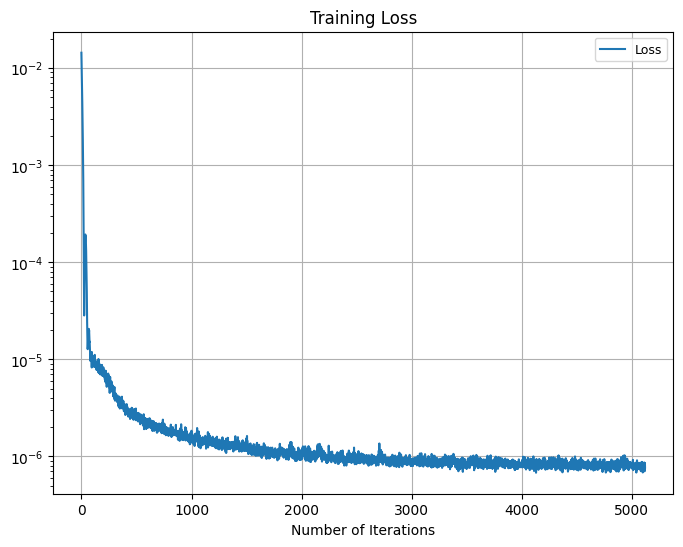

In [ ]:
# NN params
num_epochs = 10
batch_size = 2**11 #2**12
initial_lr = 0.005
neurons = [50,50,50,50]
M_train = 2**20  # Number training of samples
###########

sigma_defaultable = tf.constant([0.2, 0.25, 0.25, 0.25, 0.3, 0.2, 0.3], dtype=tf.float32)
corr_matrix_defaultable = tf.constant([
    [1.0, 0.9, 0.2, 0.5, 0.1, 0.1, 0.2],
    [0.9, 1.0, 0.4, 0.3, 0.2, 0.3, 0.2],
    [0.2, 0.4, 1.0, 0.2, 0.75, 0.15, 0.25],
    [0.5, 0.3, 0.2, 1.0, 0.35, 0.05, 0.15],
    [0.1, 0.2, 0.75, 0.35, 1.0, 0.15, 0.05],
    [0.1, 0.3, 0.15, 0.05, 0.15, 1.0, 0.25],
    [0.2, 0.2, 0.25, 0.15, 0.05, 0.25, 1.0]
], dtype=tf.float32)
L_defaultable = np.linalg.cholesky(corr_matrix_defaultable)


# Prepare the training dataset
B1 = 0.575
B2 = 0.675
measures = 1
b1 = 0.35
b2 = 0.05
d_defaultable = d + 2

x0 = np.ones([M_train,d_defaultable])
x0_tf = tf.convert_to_tensor(x0, dtype=tf.float32)
x_train = x0_tf    # shape = [M_train, dim_x, 1]
y_train = tf.zeros( [M_train, 1] )
train_dataset = tf.data.Dataset.from_tensor_slices( (x_train, y_train) )
#train_dataset = train_dataset.shuffle(buffer_size=batch_size*10).batch(batch_size)  # buffer_size doesn't matter in this code
train_dataset = train_dataset.batch(batch_size)

model_parameters_3 = ['GBM', h, d_defaultable, r, sigma_defaultable, L_defaultable]
model_3 = ModelClass(model_parameters_3)
portfolio_parameters_tf = [P_Y, P_Z, ind_X, ind_Z, d_p, K_p]
MVA_model = FullNetwork(N=N, h=h, dim_x=d_defaultable, dim_w=d_defaultable, portfolio_pars = portfolio_parameters_tf, \
            neurons=neurons, activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None)


MVA_0_history = []
loss_history = []
lr_history = []
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_lr, decay_steps=int(M_train/batch_size), decay_rate=tf.math.exp(-0.2), staircase=False)
optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
#optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule)

# customize loss function
def dummy_loss(y_true, y_model):
    return y_model  # Return the full list of losses

@tf.function
def train_step(input_x, input_y):
    with tf.GradientTape() as tape:
        # Unpack the outputs from the model
        NN_MVA_0, loss_components = MVA_model(input_x, training=True)
        # Compute the total loss as an equal-weighted sum of the three components
        total_loss = tf.reduce_sum(loss_components)
    # Compute gradients
    grads = tape.gradient(total_loss, MVA_model.trainable_weights)
    # Apply gradients to update the model weights
    optimizer.apply_gradients(zip(grads, MVA_model.trainable_weights))
    return [NN_MVA_0, total_loss, grads, loss_components]

# Customized train loop
start = time.time()
for epoch in range(num_epochs):
    print("\nStart of epoch %d" % (epoch,))
    # Iterate over the batches of the dataset.
    for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
        output_train = train_step(x_batch_train, y_batch_train)
        NN_MVA_0 = output_train[0].numpy()
        total_loss_value = output_train[1].numpy()
        loss_components = output_train[3].numpy()  # Get individual loss components

        MVA_0_history.append(NN_MVA_0)
        loss_history.append(total_loss_value)
        lr_history.append(lr_schedule(optimizer.iterations).numpy())

        if step == 0:
            print("Training total loss at step %d: %.8f" % (step, float(total_loss_value)))
            print("Individual loss components: ", loss_components)
            print("Seen so far: %s samples" % ((step + 1) * batch_size))
            print("The current learning rate is", lr_schedule(optimizer.iterations).numpy())
            print('MVA_0 (approx.): ', NN_MVA_0, 'MVA_0 (ref.): ', -0.034513973116698383)
            end = time.time()
            print('Time elapsed', end - start)
            start = time.time()


######################### print loss and save loss history and learning rate history
plt.figure(figsize=(8, 6))
plt.plot(loss_history, label='Loss')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.yscale('log')
plt.grid()
plt.show()

# MVA - Store parameters for future use

In [ ]:
### Saves locally ###

# Define the time steps extension
extension = "200_m1"

# Create directories for weights and parameters if they don't exist
os.makedirs('path_to_weights', exist_ok=True)
os.makedirs('path_to_parameters', exist_ok=True)

# Save the weights with the time steps extension
weights_path = f'path_to_weights/MVA_model_weights{extension}.weights.h5'
MVA_model.save_weights(weights_path)


# Define the parameters to save
params_to_save = {
    'model_parameters_3': model_parameters_3,
    'portfolio_parameters_tf': portfolio_parameters_tf,
    'num_epochs': num_epochs,
    'batch_size': batch_size,
    'initial_lr': initial_lr,
    'neurons': neurons,
    'M_train': M_train,
    'N': N,
    'd_defaultable': d_defaultable,
    'T': T,
    't': t,
    'h': h,
    'r': r,
    'x0': x0,
    'sigma_defaultable': sigma_defaultable,
    'corr_matrix_defaultable': corr_matrix_defaultable,
    'L_defaultable': L_defaultable,
    'B1': B1,
    'B2': B2,
    'measures': measures,
    'b1': b1,
    'b2': b2,
    'ind_X': ind_X,
    'd_p': d_p,
    'P_Y': P_Y,
    'P_Z': P_Z,
    'K_p': K_p,
    'N_p': N_p,
    'T_p': T_p,
    'ind_Z': ind_Z,
    'MC_prices_0': MC_prices_0,
    'MC_prices': MC_prices
}

# Save the parameters with the time steps extension
parameters_path = f'path_to_parameters/MVA_parameters{extension}.pkl'
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save, f)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')



# Define paths in Google Drive with the extension
weights_path = f'/content/drive/MyDrive/MVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/MVA_parameters{extension}.pkl'

# Save the weights to Google Drive
MVA_model.save_weights(weights_path)

# Function to convert TensorFlow tensors to NumPy arrays
def convert_tensors(obj):
    if isinstance(obj, tf.Tensor):
        return obj.numpy()
    elif isinstance(obj, list):
        return [convert_tensors(item) for item in obj]
    elif isinstance(obj, dict):
        return {key: convert_tensors(value) for key, value in obj.items()}
    else:
        return obj

# Convert TensorFlow tensors to NumPy arrays
params_to_save_converted = convert_tensors(params_to_save)

# Save the parameters to Google Drive
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save_converted, f)

print(f"Weights saved to {weights_path}")
print(f"Parameters saved to {parameters_path}")




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Weights saved to /content/drive/MyDrive/MVA_model_weights200_m1.weights.h5
Parameters saved to /content/drive/MyDrive/MVA_parameters200_m1.pkl


# MVA - Load parameters

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pickle
import tensorflow as tf

# Define the extension for the file names
extension = "200_m2"  # Use "" for old parameters without extensions, or "_200" for new ones

# Define paths using the extension
weights_path = f'/content/drive/MyDrive/MVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/MVA_parameters{extension}.pkl'

# Load the parameters
with open(parameters_path, 'rb') as f:
    params_loaded = pickle.load(f)

# Reconstruct necessary variables and model as before
model_parameters_3 = params_loaded['model_parameters_3']
portfolio_parameters_tf = params_loaded['portfolio_parameters_tf']
neurons = params_loaded['neurons']
N = params_loaded['N']
h = params_loaded['h']
d_defaultable = params_loaded['d_defaultable']
T = params_loaded['T']
t = params_loaded['t']
r = params_loaded['r']
sigma_defaultable = params_loaded['sigma_defaultable']
corr_matrix_defaultable = params_loaded['corr_matrix_defaultable']
L_defaultable = params_loaded['L_defaultable']
B1 = params_loaded['B1']
B2 = params_loaded['B2']
measures = params_loaded['measures']
b1 = params_loaded['b1']
b2 = params_loaded['b2']
batch_size = params_loaded['batch_size']
x0_tf = tf.convert_to_tensor(params_loaded['x0'], dtype=tf.float32)
M_train = params_loaded['M_train']
P_Y = params_loaded['P_Y']
P_Z = params_loaded['P_Z']
ind_X = params_loaded['ind_X']
ind_Z = params_loaded['ind_Z']
d_p = params_loaded['d_p']
K_p = params_loaded['K_p']
N_p = params_loaded['N_p']
T_p = params_loaded['T_p']
MC_prices_0 = params_loaded['MC_prices_0']
MC_prices = params_loaded['MC_prices']

model_3 = ModelClass(model_parameters_3)

# Instantiate the model
MVA_model = FullNetwork(
    N=N,
    h=h,
    dim_x=d_defaultable,
    dim_w=d_defaultable,
    portfolio_pars=portfolio_parameters_tf,
    neurons=neurons,
    activation='relu',
    use_batnorm=False,
    regu_cons=[0., 0.],
    ini_cons=None
)

# Initialize the model before loading weights
dummy_input = x0_tf[:batch_size, :]  # shape = [2048, d_defaultable], for example
_ = MVA_model(dummy_input)

# Load the weights from Google Drive
MVA_model.load_weights(weights_path)

print(f"Weights and parameters loaded successfully from {weights_path} and {parameters_path}")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 124, in error_handler
    del filtered_tb  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__
    return call_fn(*args, **kwargs)  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_u

Weights and parameters loaded successfully from /content/drive/MyDrive/MVA_model_weights200_m2.weights.h5 and /content/drive/MyDrive/MVA_parameters200_m2.pkl


# MVA - Evaluation

In [ ]:
# Initialize parameters
push_bank_def = False
np.random.seed(0)
M_eval = 2**16
X = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
X[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)
X_reduced = np.zeros([N+1, M_eval, d], dtype=np.float32)
X_reduced[0] = X[0][:,:d]

NN_Y = np.zeros([N+1, M_eval, P_Y], dtype=np.float32)
NN_Y[0] = np.tile(full_model_2.y_0.numpy(), (M_eval, 1))

Y = np.zeros([N+1, M_eval], dtype=np.float32)
Y[0] = np.sum(NN_Y[0], axis=1)

NN_Vx = np.zeros([N, M_eval, P_Z], dtype=np.float32)

MVA = np.zeros([M_eval, N+1], dtype=np.float32)
MVA[:, 0] = MVA_model.MVA_0.numpy()
MVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)
inp_MVA = np.concatenate([X[0], np.zeros([M_eval, 1], dtype=np.float32)], axis=1)
MVAx[:, :, 0] = MVA_model.network(inp_MVA)

q_alpha_pred = np.zeros([M_eval, 2, N], dtype=np.float32)
q_alpha_pred[:, 0, 0] = q_alpha_high_0
q_alpha_pred[:, 1, 0] = q_alpha_low_0

tau = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]

# Main loop
for n in range(N):
    dW = np.random.normal(size=(M_eval, d_defaultable)) * np.sqrt(h)
    dW_reduced = dW[:,:d]

    # Update MVAx
    inp_MVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    MVAx[:, :, n] = MVA_model.network(inp_MVA)

    # Compute MVA[:, n+1]
    if n > 0:
        MVA[:, n] = MVA[:, n] * active_n # Zero MVA[:, n] where paths have defaulted at time n
        inp_q = np.concatenate([X_reduced[n], NN_Y[n], Y[n][:, np.newaxis]], axis=1)
        q_output = loaded_q_models[n](inp_q)
        q_alpha_pred[:, 0, n] = np.maximum(q_output[:, 0], 0)
        q_alpha_pred[:, 1, n] = np.minimum(q_output[:, 1], 0)
    MVA[:, n+1] = model_3.F_MVA(X[n], MVA[:, n], MVAx[:, :, n], q_alpha_pred[:, :, n], dW)
    if push_bank_def:
        MVA[:, n+1] = MVA[:, n+1] - b1 * MVAx[:,-2,n] * h

    # Update NN_Vx
    inp_y = np.concatenate([X_reduced[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    NN_Vx[n] = full_model_2.network(inp_y).numpy()
    for p in range(P_Y):
        if n < N_p[p]:
            NN_Y[n+1, :, p] = model_2.F_Y(X_reduced[n], NN_Y[n, :, p], NN_Vx[n], dW_reduced, ind_X[p], ind_Z[p], d_p[p])
    Y[n+1] = np.sum(NN_Y[n+1], axis=1)

    # Update X[n+1]
    X[n+1] = model_3.F_X(X[n], dW)
    if push_bank_def:
        X[n+1] = X[n+1] - np.array([0, 0, 0, 0, 0, b1 * h, 0], dtype=np.float32)
    X_reduced[n+1] = X[n+1][:,:d]
    # Update tau
    condition_1 = X[n+1, :, -2] < B1  # Access second-to-last column
    condition_2 = X[n+1, :, -1] < B2  # Access last column

    tau[:, 0] = np.where(np.logical_and(condition_1, tau[:, 0] == N + 1), n + 1, tau[:, 0])
    tau[:, 1] = np.where(np.logical_and(condition_2, tau[:, 1] == N + 1), n + 1, tau[:, 1])

    # Compute tau_min
    tau_combined = np.vstack([np.full(M_eval, N), tau[:, 0], tau[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min = np.min(tau_combined, axis=1)  # Shape: [M_eval]

    # Create active masks using <= instead of <
    active_n = (n <= tau_min).astype(float)      # Paths active at time n
    active_n1 = (n + 1 <= tau_min).astype(float)  # Paths active at time n+1

tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]

# Post-processing
X = np.transpose(X, axes=[1, 2, 0])
NN_Y = np.transpose(NN_Y, axes=[1, 2, 0])
NN_Vx = np.transpose(NN_Vx, axes=[1, 2, 0])

for p in range(P_Y):
    NN_Vx[:, N_p[p]:, ind_Z[p]:ind_Z[p]+d_p[p]] = 0

YT = []
Y0 = []
for p in range(P_Y):
    YT_p = model_2.g(X[:, :, N_p[p]], K_p[p], ind_X[p], d_p[p])
    YT.append(YT_p)
    Y0.append(np.exp(-r * T_p[p]) * np.mean(YT_p))

Y = np.sum(NN_Y, axis=1)


In [ ]:
# Assuming you have already computed tau_min as integer indices
tau_min = tau_min.astype(int)  # Shape: [M_eval]
# Compute the term inside the sum
r_IM_lending = 0.065
r_IM_borrowing = 0.05
term = np.exp(-r * t[:-1]) * (
    (r - r_IM_lending) * np.minimum(q_alpha_pred[:, 1, :], 0) - r_IM_borrowing * np.maximum(q_alpha_pred[:, 0, :], 0) ) * h  # Shape: [M_eval, N]
# Create the mask based on tau_min
mask = np.arange(N)[np.newaxis, :] < tau_min[:, np.newaxis]  # Shape: [M_eval, N]
# Apply the mask to the term
masked_term = term * mask  # Shape: [M_eval, N]
# Sum over time steps for each path
S = np.sum(masked_term, axis=1)  # Shape: [M_eval]
# Compute MVA_0 as the mean over all paths
MVA_0 = np.mean(S)
MVA_0

-0.0378742695151452

No defaul:  0.828826904296875 Counterparty defaults:  0.16925048828125 Bank Defaults:  0.001922607421875
MSE no def.:  6.2499305e-07 MSE counterparty def.:  2.0696668e-06 MSE bank def.:  1.1144067e-06


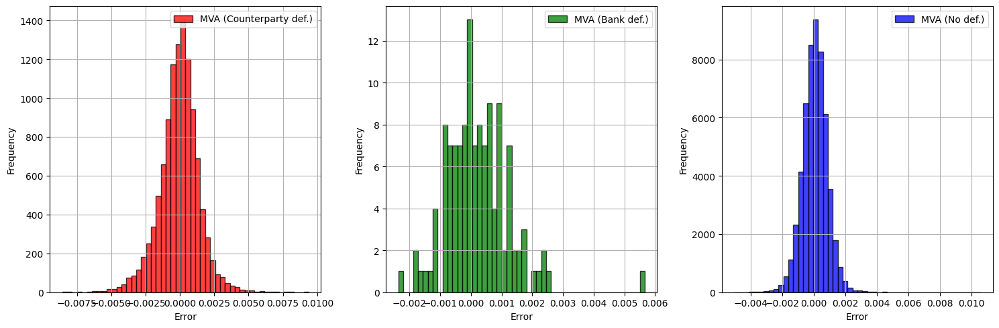

In [ ]:
# Compute terminal values of CVA
MVA_terminal = MVA[np.arange(len(tau_min)), tau_min]  # Shape: (4096,)


# Separate terminal errors by event type
errors_no_def = MVA_terminal[no_def_index]
errors_bank_def = MVA_terminal[bank_def_index]
errors_counterparty_def = MVA_terminal[counterparty_def_index]

print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('MSE no def.: ', np.mean(errors_no_def**2), 'MSE counterparty def.: ', np.mean(errors_counterparty_def**2), 'MSE bank def.: ', np.mean(errors_bank_def**2))


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), tight_layout=True)

# Subplot 1
axes[0].hist(errors_counterparty_def, bins=50, alpha=0.75, color='red', edgecolor='black', label='MVA (Counterparty def.)')
axes[0].set_xlabel('Error')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True)

# Subplot 2
axes[1].hist(errors_bank_def, bins=50, alpha=0.75, color='green', edgecolor='black', label='MVA (Bank def.)')
axes[1].set_xlabel('Error')
axes[1].set_ylabel('Frequency')
axes[1].legend()
axes[1].grid(True)

# Subplot 3
axes[2].hist(errors_no_def, bins=50, alpha=0.75, color='blue', edgecolor='black', label='MVA (No def.)')
axes[2].set_xlabel('Error')
axes[2].set_ylabel('Frequency')
axes[2].legend()
axes[2].grid(True)

plt.show()

In [ ]:
B1,B2

(0.575, 0.675)

No defaul:  0.8309326171875 Counterparty defaults:  0.166961669921875 Bank Defaults:  0.002105712890625
MSE no def.:  6.1496854e-07 MSE counterparty def.:  2.0830678e-06 MSE bank def.:  9.192552e-07


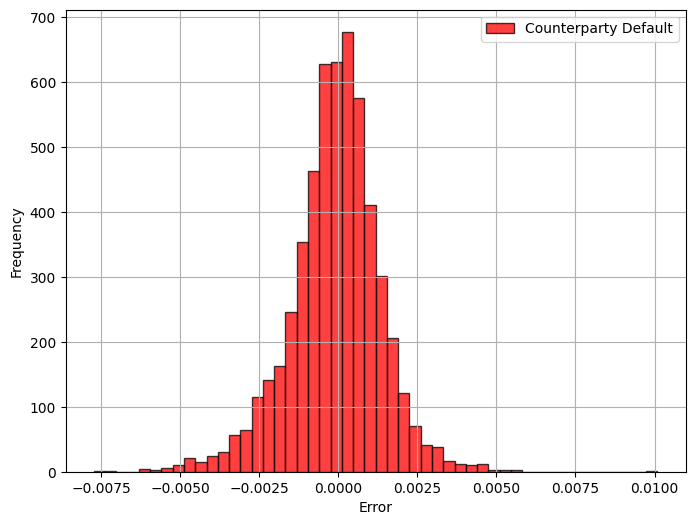

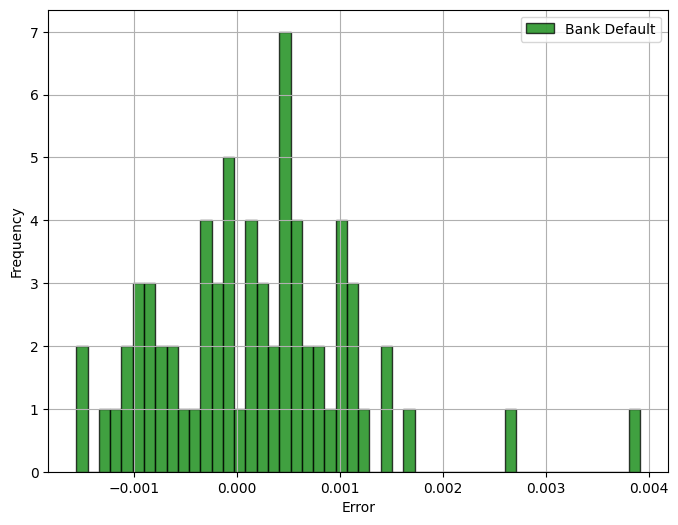

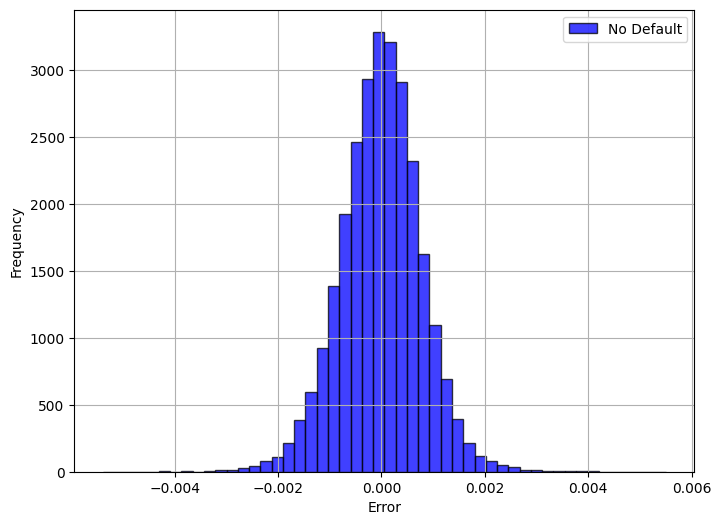

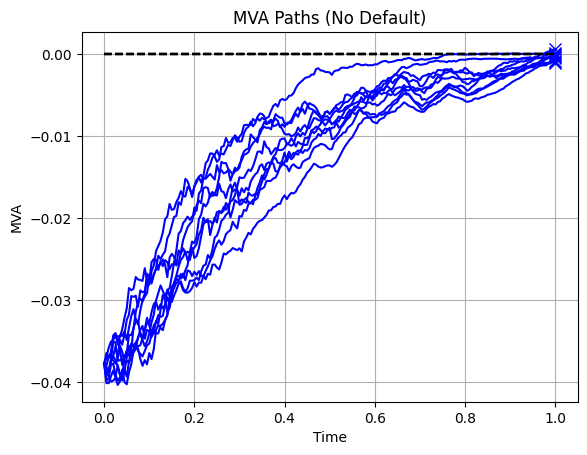

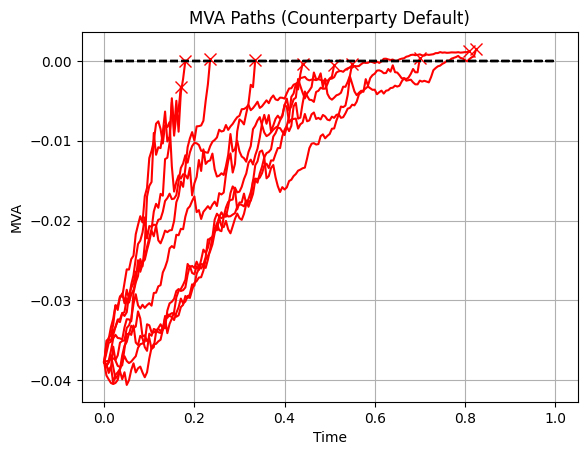

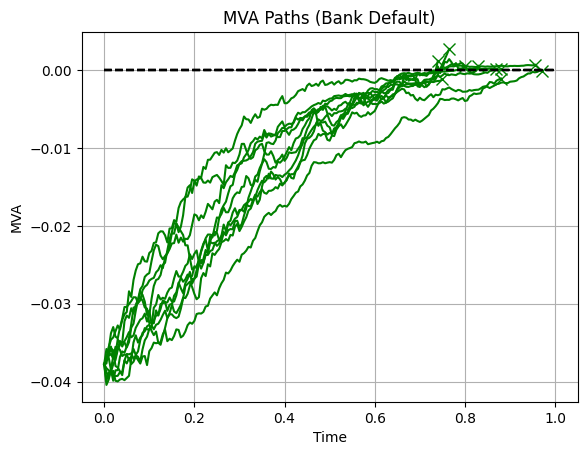

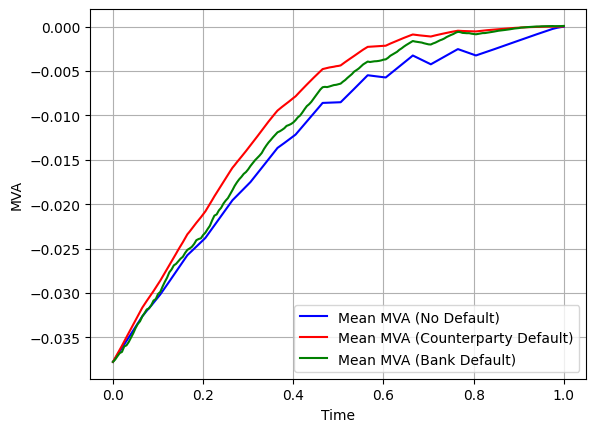

'\nmeasure = 1:\nNo defaul:  0.630462646484375 Counterparty defaults:  0.1375732421875 Bank Defaults:  0.231964111328125\nMSE no def.:  1.9204917e-06 MSE counterparty def.:  9.016246e-06 MSE bank def.:  9.1037255e-06\n\nmeasure = 2:\nNo defaul:  0.630462646484375 Counterparty defaults:  0.1375732421875 Bank Defaults:  0.231964111328125\nMSE no def.:  1.4522277e-06 MSE counterparty def.:  9.906126e-06 MSE bank def.:  2.6236215e-05\n'

In [ ]:
tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]


# Compute terminal values of MVA
MVA_terminal = MVA[np.arange(len(tau_min)), tau_min]  # Shape: (4096,)


# Separate terminal errors by event type
errors_no_def = MVA_terminal[no_def_index]
errors_bank_def = MVA_terminal[bank_def_index]
errors_counterparty_def = MVA_terminal[counterparty_def_index]

print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('MSE no def.: ', np.mean(errors_no_def**2), 'MSE counterparty def.: ', np.mean(errors_counterparty_def**2), 'MSE bank def.: ', np.mean(errors_bank_def**2))

# Plot histograms for terminal errors for different events
plt.figure(figsize=(8, 6))
plt.hist(errors_counterparty_def, bins=50, alpha=0.75, color='red', edgecolor='black', label='Counterparty Defaults')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.grid()
plt.show()

# Plot histograms for terminal errors for different events
plt.figure(figsize=(8, 6))
plt.hist(errors_bank_def, bins=50, alpha=0.75, color='green', edgecolor='black', label='Bank Defaults')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.grid()
plt.show()

# Plot histograms for terminal errors for different events
plt.figure(figsize=(8, 6))
plt.hist(errors_no_def, bins=50, alpha=0.75, color='blue', edgecolor='black', label='No Default')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.grid()
plt.show()

# Plot paths with no default (terminal_event == 0)
plt.figure()
for idx in no_def_index[:10]:
    tau_idx = tau_min[idx]
    plt.plot(t[:tau_idx + 1], MVA[idx, :tau_idx + 1], color='blue')
    plt.plot(t[tau_idx], MVA[idx, tau_idx], 'x', markersize=8, color='blue')  # Add 'x' at end of path
    plt.plot(t, 0*t, '--', color='black', label='Ref.')
plt.title("MVA Paths (No Default)")
plt.xlabel("Time")
plt.ylabel("MVA")
plt.grid()
plt.show()

# Plot paths with counterparty default (terminal_event == 2)
plt.figure()
for idx in counterparty_def_index[:10]:
    tau_idx = tau_min[idx]
    plt.plot(t[:tau_idx + 1], MVA[idx, :tau_idx + 1], color='red')
    plt.plot(t[tau_idx], MVA[idx, tau_idx], 'x', markersize=8, color='red')  # Add 'x' at end of path
    plt.plot(t, 0*t, '--', color='black', label='Ref.')
plt.title("MVA Paths (Counterparty Default)")
plt.xlabel("Time")
plt.ylabel("MVA")
plt.grid()
plt.show()

# Plot paths with bank default (terminal_event == 1)
plt.figure()
for idx in bank_def_index[:10]:
    tau_idx = tau_min[idx]
    plt.plot(t[:tau_idx + 1], MVA[idx, :tau_idx + 1], color='green')
    plt.plot(t[tau_idx], MVA[idx, tau_idx], 'x', markersize=8, color='green')  # Add 'x' at end of path
    plt.plot(t, 0*t, '--', color='black', label='Ref.')
plt.title("MVA Paths (Bank Default)")
plt.xlabel("Time")
plt.ylabel("MVA")
plt.grid()
plt.show()


# Compute mean MVA paths for each category
mean_MVA_no_def = np.mean(MVA[no_def_index], axis=0)
mean_MVA_bank_def = np.mean(MVA[bank_def_index], axis=0)
mean_MVA_counterparty_def = np.mean(MVA[counterparty_def_index], axis=0)

# Plot mean MVA path for no default (terminal_event == 0)
plt.figure()
plt.plot(t, mean_MVA_no_def, color='blue', label='Mean MVA (No Default)')
plt.plot(t, mean_MVA_counterparty_def, color='red', label='Mean MVA (Counterparty Default)')
plt.plot(t, mean_MVA_bank_def, color='green', label='Mean MVA (Bank Default)')
plt.xlabel("Time")
plt.ylabel("MVA")
plt.grid()
plt.legend()
plt.show()
'''
measure = 1:
No defaul:  0.630462646484375 Counterparty defaults:  0.1375732421875 Bank Defaults:  0.231964111328125
MSE no def.:  1.9204917e-06 MSE counterparty def.:  9.016246e-06 MSE bank def.:  9.1037255e-06

measure = 2:
No defaul:  0.630462646484375 Counterparty defaults:  0.1375732421875 Bank Defaults:  0.231964111328125
MSE no def.:  1.4522277e-06 MSE counterparty def.:  9.906126e-06 MSE bank def.:  2.6236215e-05
'''

In [ ]:
np.mean(np.argmin(tau_combined,1) == 0), np.mean(np.argmin(tau_combined,1) == 1),  np.mean(np.argmin(tau_combined,1) == 2)

(0.802947998046875, 0.00091552734375, 0.196136474609375)

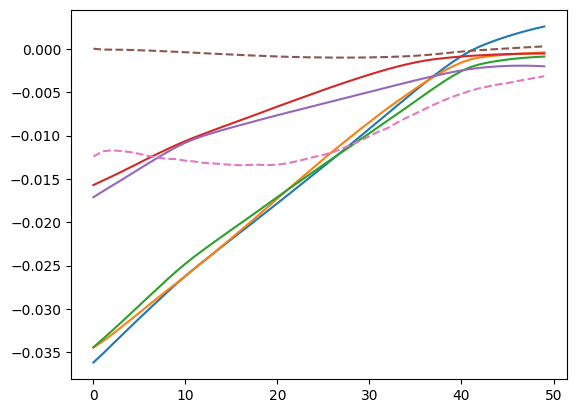

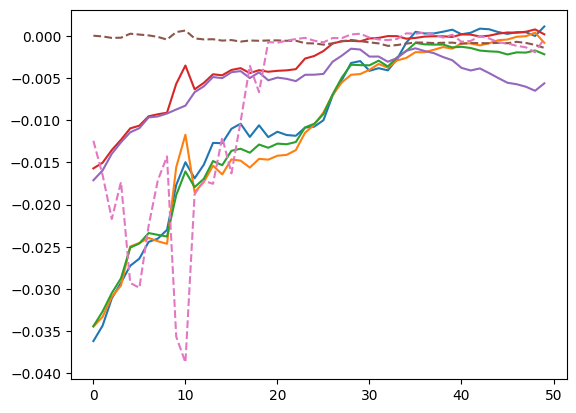

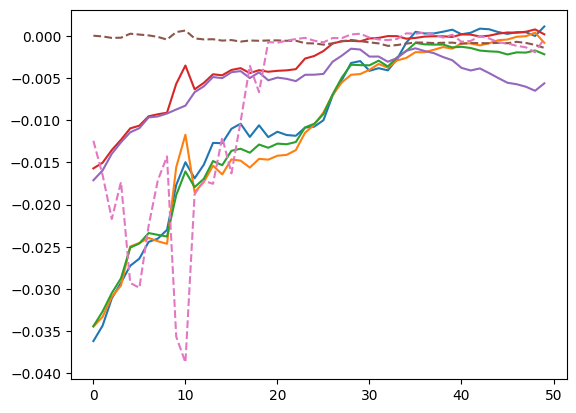

In [ ]:
plt.plot(np.mean(MVAx[:,:d,:],0).T)
plt.plot(np.mean(MVAx[:,d:,:],0).T,'--')
plt.figure()
plt.plot(MVAx[5242,:d,:].T)
plt.plot(MVAx[5242,d:,:].T,'--')
plt.figure()
plt.plot(MVAx[5242,:d,:].T)
plt.plot(MVAx[5242,d:,:].T,'--')

In [ ]:
bank_def_index, counterparty_def_index, no_def_index
bank_def_0 = bank_def_index[np.argmin(tau_combined[bank_def_index,1])]
tau_combined[bank_def_0-3:bank_def_0+3]
bank_def_0


15725

In [ ]:
np.random.seed(1)
W = 3
w_0 = bank_def_0
MPR = 8
alpha = 0.99
M_ref = 2**10
MVA_w = np.zeros([W,N+1])
MVA_w[:,0] = MVA_0

for k in range(1,N):
  print('k: ', k)
  for w in range(w_0, w_0 + W):
    alive = tf.ones(M_ref)
    q_alpha_pred_ref = np.zeros([M_ref,2,N])
    X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
    NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
    Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)

    for n in range(k, N):
      dW = tf.cast(np.random.normal(size=(M_ref, d+2)) * np.sqrt(h), tf.float32)

      # defaulted or not #
      alive = alive * tf.cast(X_ref[:, -2] > B1, dtype=tf.float32) * tf.cast(X_ref[:, -1] > B2, dtype=tf.float32)
      ####################

      inp_IM = tf.concat([X_ref[:, :d], NN_Y_ref, tf.expand_dims(Y_ref, axis=1)], axis=1)
      q_alpha_pred_ref_temp = loaded_q_models[n].predict(inp_IM, verbose=0)
      q_alpha_pred_ref[:,0,n] = q_alpha_pred_ref_temp[:,0] * alive
      q_alpha_pred_ref[:,1,n] = q_alpha_pred_ref_temp[:,1] * alive

      # Update Y
      inp_y = tf.concat([X_ref[:,:d], tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
      NN_Vx_ref = tf.cast( full_model_2.network( inp_y ), tf.float32)
      NN_Y_temp_p = []
      for p in range(0, P_Y):
        if n < N_p[p]:
          NN_Y_temp_p.append(model_2.F_Y(X_ref[:,:d], NN_Y_ref[:,p], NN_Vx_ref, dW[:,:d], ind_X[p], ind_Z[p], d_p[p]))
        else:
          NN_Y_temp_p.append(tf.zeros(M_ref))
      NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
      Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)
      ##########

      # Update X #
      X_ref = model_3.F_X(X_ref, dW)
      ############

    MVA_w[w-w_0,k] = np.sum(np.mean(np.exp(-r*(t[:-1])) * ( (r - r_IM_lending) * np.minimum(q_alpha_pred_ref[:,1,:], 0) - r_IM_borrowing * np.maximum(q_alpha_pred_ref[:,0,:], 0)) * h, 0) )
for w in range(w_0, w_0 + W):
  MVA_w[w-w_0,tau_min[w]:] = 0

k:  1
k:  2
k:  3
k:  4
k:  5
k:  6
k:  7
k:  8
k:  9
k:  10
k:  11
k:  12
k:  13
k:  14
k:  15
k:  16
k:  17
k:  18
k:  19
k:  20
k:  21
k:  22
k:  23
k:  24
k:  25
k:  26
k:  27
k:  28
k:  29
k:  30
k:  31
k:  32
k:  33
k:  34
k:  35
k:  36
k:  37
k:  38
k:  39
k:  40
k:  41
k:  42
k:  43
k:  44
k:  45
k:  46
k:  47
k:  48
k:  49
k:  50
k:  51
k:  52
k:  53
k:  54
k:  55
k:  56
k:  57
k:  58
k:  59
k:  60
k:  61
k:  62
k:  63
k:  64
k:  65
k:  66
k:  67
k:  68
k:  69
k:  70
k:  71
k:  72
k:  73
k:  74
k:  75
k:  76
k:  77
k:  78
k:  79
k:  80
k:  81
k:  82
k:  83
k:  84
k:  85
k:  86
k:  87
k:  88
k:  89
k:  90
k:  91
k:  92
k:  93
k:  94
k:  95
k:  96
k:  97
k:  98
k:  99
k:  100
k:  101
k:  102
k:  103
k:  104
k:  105
k:  106
k:  107
k:  108
k:  109
k:  110
k:  111
k:  112
k:  113
k:  114
k:  115
k:  116
k:  117
k:  118
k:  119
k:  120
k:  121
k:  122
k:  123
k:  124
k:  125
k:  126
k:  127
k:  128
k:  129
k:  130
k:  131
k:  132
k:  133
k:  134
k:  135
k:  136
k:  137
k:  138
k:  

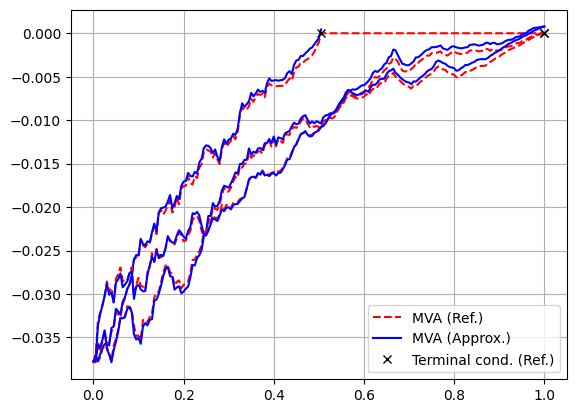

In [ ]:
for w in range(W):
  plt.plot(t,MVA_w[w,:], '--', color = 'red', label = 'MVA (Ref.)' if w==0 else None)
  plt.plot(t[:tau_min[w+w_0]+1],MVA[w+w_0,:tau_min[w+w_0]+1], color = 'blue', label = 'MVA (Approx.)'if w==0 else None)
  plt.plot([t[tau_min[w+w_0]]], [0], 'x', color = 'black', label = 'Terminal cond. (Ref.)'if w==0 else None)
plt.grid()
plt.legend()



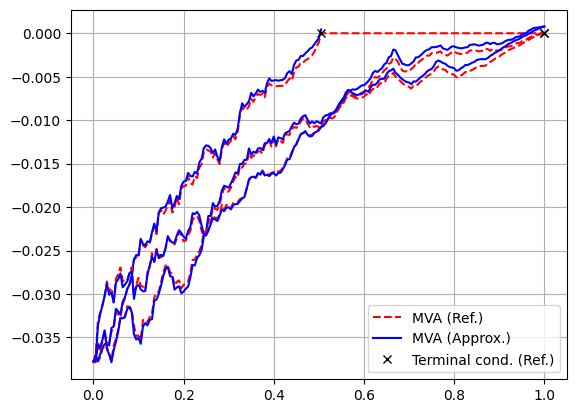

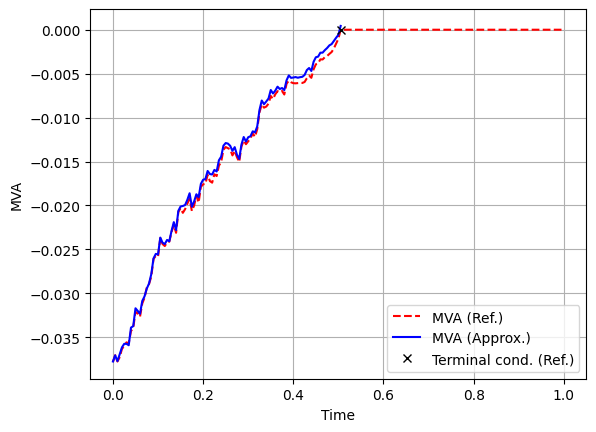

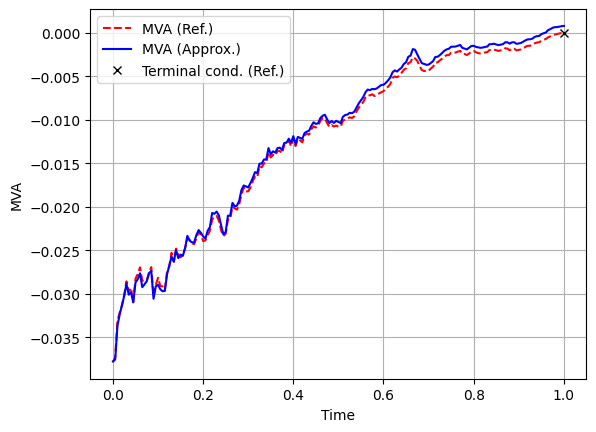

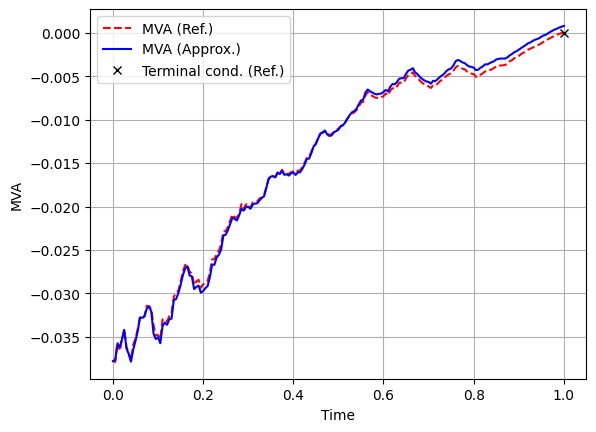

<Figure size 640x480 with 0 Axes>

In [ ]:
for w in range(W):
  plt.plot(t,MVA_w[w,:], '--', color = 'red', label = 'MVA (Ref.)' if w==0 else None)
  plt.plot(t[:tau_min[w+w_0]+1],MVA[w+w_0,:tau_min[w+w_0]+1], color = 'blue', label = 'MVA (Approx.)'if w==0 else None)
  plt.plot([t[tau_min[w+w_0]]], [0], 'x', color = 'black', label = 'Terminal cond. (Ref.)'if w==0 else None)
plt.grid()
plt.legend()

plt.figure()
for w in range(W):
    plt.plot(t, MVA_w[w, :], '--', color='red', label='MVA (Ref.)')  # Add label only once
    plt.plot(t[:tau_min[w + w_0] + 1], MVA[w + w_0, :tau_min[w + w_0] + 1], color='blue', label='MVA (Approx.)')  # Add label only once
    plt.plot([t[tau_min[w + w_0]]], [0], 'x', color='black', label='Terminal cond. (Ref.)')  # Add label only once
    plt.grid()
    plt.legend(loc='best')  # Add legend to each plot
    plt.xlabel("Time")  # Label for x-axis
    plt.ylabel("MVA")  # Label for y-axis
    plt.figure()  # Create a new figure for the next plot


In [ ]:
tau

array([[201, 201],
       [201,  34],
       [133, 201],
       ...,
       [182, 201],
       [198, 201],
       [ 81, 188]])

In [ ]:
bb1 = 1.0*b1
bb2 = 1.0*b2

bb1 = 0.2
bb2 = 0.05
# Initialize parameters
M_eval = 2**15
XX = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
XX[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)

X2 = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
X2[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)

X3 = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
X3[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)


tau = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]
tau2 = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]
tau3 = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]

# Main loop
for n in range(N):
    dW = np.random.normal(size=(M_eval, d_defaultable)) * np.sqrt(h)

    # Update X[n+1]
    XX[n+1] = model_3.F_X(XX[n], dW)

    X2[n+1] = model_3.F_X(X2[n], dW)
    X2[n+1,:,-2] += -h*bb1

    X3[n+1] = model_3.F_X(X3[n], dW)
    X3[n+1,:,-1] += -h*bb2
    # Update tau
    condition_1 = XX[n+1, :, -2] < B1  # Access second-to-last column
    condition_2 = XX[n+1, :, -1] < B2  # Access last column
    tau[:, 0] = np.where(np.logical_and(condition_1, tau[:, 0] == N + 1), n + 1, tau[:, 0])
    tau[:, 1] = np.where(np.logical_and(condition_2, tau[:, 1] == N + 1), n + 1, tau[:, 1])

    condition_12 = X2[n+1, :, -2] < B1  # Access second-to-last column
    condition_22 = X2[n+1, :, -1] < B2  # Access last column
    tau2[:, 0] = np.where(np.logical_and(condition_12, tau2[:, 0] == N + 1), n + 1, tau2[:, 0])
    tau2[:, 1] = np.where(np.logical_and(condition_22, tau2[:, 1] == N + 1), n + 1, tau2[:, 1])

    condition_13 = X3[n+1, :, -2] < B1  # Access second-to-last column
    condition_23 = X3[n+1, :, -1] < B2  # Access last column
    tau3[:, 0] = np.where(np.logical_and(condition_13, tau3[:, 0] == N + 1), n + 1, tau3[:, 0])
    tau3[:, 1] = np.where(np.logical_and(condition_23, tau3[:, 1] == N + 1), n + 1, tau3[:, 1])

    # Compute tau_min
    tau_combined = np.vstack([np.full(M_eval, N), tau[:, 0], tau[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min = np.min(tau_combined, axis=1)  # Shape: [M_eval]

    tau_combined2 = np.vstack([np.full(M_eval, N), tau2[:, 0], tau2[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min2 = np.min(tau_combined2, axis=1)  # Shape: [M_eval]

    tau_combined3 = np.vstack([np.full(M_eval, N), tau3[:, 0], tau3[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min3 = np.min(tau_combined3, axis=1)  # Shape: [M_eval]


# Post-processing
XX = np.transpose(X, axes=[1, 2, 0])
X2 = np.transpose(X2, axes=[1, 2, 0])
X3 = np.transpose(X3, axes=[1, 2, 0])


tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]

tau_index2 = np.argmin(tau_combined2,1)
no_def_index2 = np.where(tau_index2 == 0)[0]
bank_def_index2 = np.where(tau_index2 == 1)[0]
counterparty_def_index2 = np.where(tau_index2 == 2)[0]

tau_index3 = np.argmin(tau_combined3,1)
no_def_index3 = np.where(tau_index3 == 0)[0]
bank_def_index3 = np.where(tau_index3 == 1)[0]
counterparty_def_index3 = np.where(tau_index3 == 2)[0]


print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('No defaul: ', len(no_def_index2)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index2)/M_eval, 'Bank Defaults: ', len(bank_def_index2)/M_eval)
print('No defaul: ', len(no_def_index3)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index3)/M_eval, 'Bank Defaults: ', len(bank_def_index3)/M_eval)

No defaul:  0.8404541015625 Counterparty defaults:  0.152587890625 Bank Defaults:  0.0069580078125
No defaul:  0.7530517578125 Counterparty defaults:  0.14239501953125 Bank Defaults:  0.10455322265625
No defaul:  0.793548583984375 Counterparty defaults:  0.200042724609375 Bank Defaults:  0.00640869140625


101
200
200


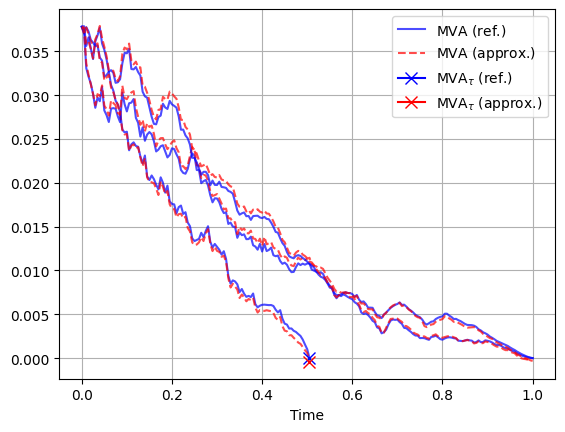

In [ ]:
for i, w in enumerate(range(w_0, w_0+W)):
    tau_w = tau_min[w]
    # Slice up to and including the default time (or final time)
    t_slice = t[:tau_w+1]
    # Reference MVA sample path
    if w < w_0+1:
      mva_slice = -MVA_m2[w, :tau_w+1]
    else:
      mva_slice = -MVA_m1[w, :tau_w+1]

    # Approximation sample path
    mva_w_slice = -MVA_w[w - w_0, :tau_w+1]  # adjust index if needed

    # Plot the reference path
    plt.plot(
        t_slice, mva_w_slice,
        linestyle='-', alpha=0.7, color='blue',
        label=r'$\text{MVA (ref.)}$' if i == 0 else ""
    )
    # Plot the approximation path
    plt.plot(
        t_slice, mva_slice,
        linestyle='--', alpha=0.7, color='red',
        label=r'$\text{MVA (approx.)}$' if i == 0 else ""
    )

    # If this path defaults before index 200, put an "x" at the final point
    print(tau_w)
    if tau_w < 200:
        # Blue cross for the reference
        plt.plot(
            t[tau_w], -MVA_w[w-w_0, tau_w],
            marker='x', color='blue', markersize=8,
            label=r'$\text{MVA}_{\tau}$ (ref.)' if i == 0 else ""
        )
        # Red cross for the approximation
        plt.plot(
            t[tau_w], -MVA_m2[w, tau_w],
            marker='x', color='red', markersize=8,
            label=r'$\text{MVA}_{\tau}$ (approx.)' if i == 0 else ""
        )

plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()


<ipython-input-39-2d1e983d3976>:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


Text(0.5, 0, 'Time')

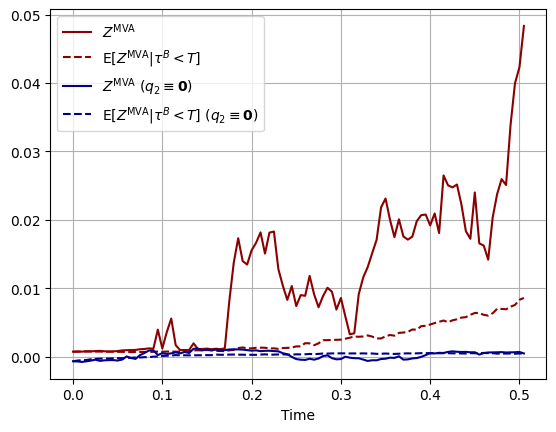

In [ ]:
tau_w_0 = tau_min[w_0]
plt.plot(t[:tau_w_0+1],-MVAx_m2[w_0,5,:tau_w_0+1], color='darkred')
plt.plot(t[:tau_w_0+1], -np.mean(MVAx_m2[bank_def_index, 5, :tau_w_0+1],0),'--', color= 'darkred')
plt.plot(t[:tau_w_0+1],-MVAx_m1[w_0, 5, :tau_w_0+1], color = 'darkblue')
plt.plot(t[:tau_w_0+1],-np.mean(MVAx_m1[bank_def_index, 5, :tau_w_0+1],0),'--', color = 'darkblue')


plt.grid()
plt.legend(loc='best')
plt.legend([r'$Z^\text{MVA}$', r'E$[Z^\text{MVA}|\tau^B<T]$', r'$Z^\text{MVA}$ ($q_2\equiv \mathbf{0}$)', r'E$[Z^\text{MVA}|\tau^B<T]$ ($q_2\equiv \mathbf{0}$)',])
plt.xlabel('Time')


<ipython-input-49-5c759097c8cc>:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')
<ipython-input-49-5c759097c8cc>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


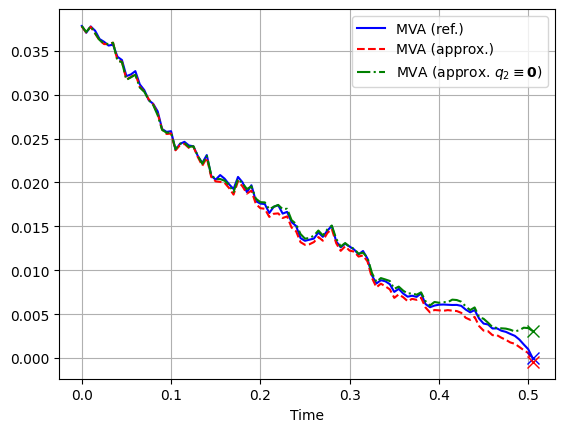

<Figure size 640x480 with 0 Axes>

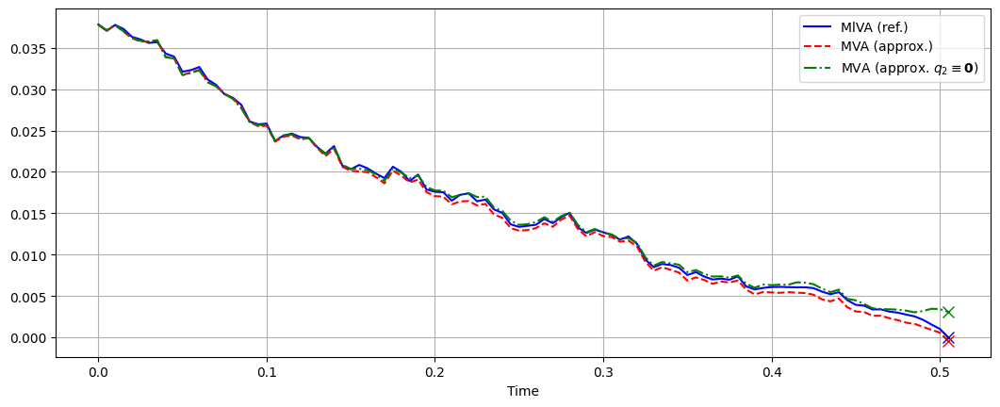

In [ ]:
plt.plot(t[:tau_w_0+1],-MVA_w[0,:tau_w_0+1], color='blue')
plt.plot(t[:tau_w_0+1],-MVA_m2[w_0,:tau_w_0+1], '--', color = 'red')
plt.plot(t[:tau_w_0+1], -MVA_m1[w_0,:tau_w_0+1], '-.', color='green')
plt.plot(t[tau_w_0], -MVA_w[0, tau_w_0],marker='x', color='blue', markersize=8)
plt.plot(t[tau_w_0], -MVA_m1[w_0, tau_w_0],marker='x', color='green', markersize=8)
plt.plot(t[tau_w_0], -MVA_m2[w_0, tau_w_0],marker='x', color='red', markersize=8)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Time')
plt.legend(['MVA (ref.)', 'MVA (approx.)', r'MVA (approx. $q_2\equiv \mathbf{0}$)'])



plt.figure()
plt.figure(figsize=(12.8,4.8))
plt.plot(t[:tau_w_0+1],-MVA_w[0,:tau_w_0+1], color='blue')
plt.plot(t[:tau_w_0+1],-MVA_m2[w_0,:tau_w_0+1], '--', color = 'red')
plt.plot(t[:tau_w_0+1], -MVA_m1[w_0,:tau_w_0+1], '-.', color='green')
plt.plot(t[tau_w_0], -MVA_w[0, tau_w_0],marker='x', color='blue', markersize=8)
plt.plot(t[tau_w_0], -MVA_m1[w_0, tau_w_0],marker='x', color='green', markersize=8)
plt.plot(t[tau_w_0], -MVA_m2[w_0, tau_w_0],marker='x', color='red', markersize=8)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Time')
plt.legend(['MlVA (ref.)', 'MVA (approx.)', r'MVA (approx. $q_2\equiv \mathbf{0}$)'])


# MVA - Store approximate solutions

In [ ]:
import os

# Define the save path
save_path = '/content/drive/My Drive/MVA_approximations/'

# Ensure the directory exists
os.makedirs(save_path, exist_ok=True)

# Define the pickle file name with the suffix
suffix = "_m1"
pickle_filename = f"errors_data{suffix}.pkl"

# Save the variables
import pickle
with open(save_path + pickle_filename, 'wb') as f:
    pickle.dump({
        f'errors_no_def{suffix}': errors_no_def,
        f'errors_bank_def{suffix}': errors_bank_def,
        f'errors_counterparty_def{suffix}': errors_counterparty_def,
        #f'MVA_w': MVA_w,
        f'MVA{suffix}': MVA,
        f'MVAx{suffix}': MVAx,
    }, f)

print(f"Data successfully saved to {save_path + pickle_filename}")


Data successfully saved to /content/drive/My Drive/MVA_approximations/errors_data_m1.pkl


# MVA - Load approximate solutions

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Define the save path and file name
save_path = '/content/drive/My Drive/MVA_approximations/'
suffix = "_m2"
pickle_filename = f"errors_data{suffix}.pkl"

# Load the pickle file
with open(save_path + pickle_filename, 'rb') as f:
    data = pickle.load(f)

# Access the variables by their names (with the suffix)
errors_no_def_m2 = data[f'errors_no_def{suffix}']
errors_bank_def_m2 = data[f'errors_bank_def{suffix}']
errors_counterparty_def_m2 = data[f'errors_counterparty_def{suffix}']
#MVA_w = data[f'MVA_w']
MVA_m2 = data[f'MVA{suffix}']
MVAx_m2 = data[f'MVAx{suffix}']


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


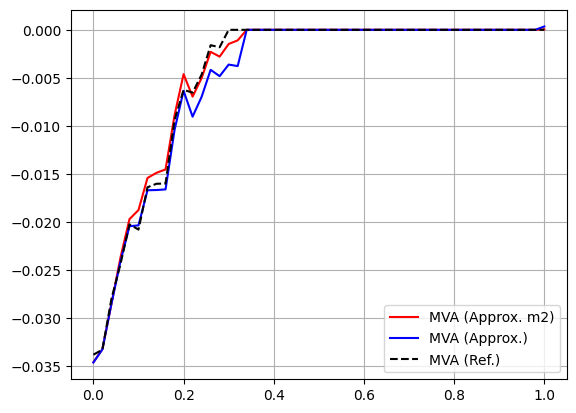

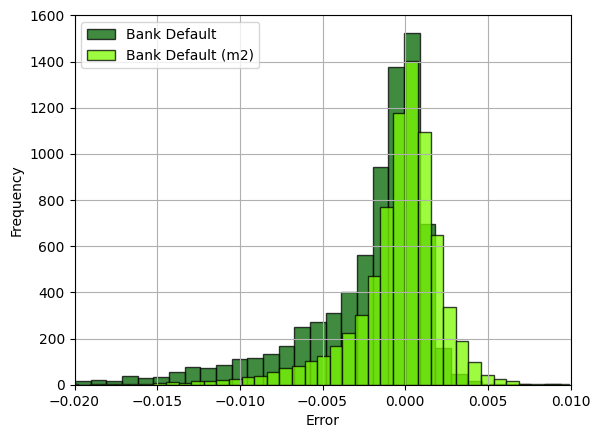

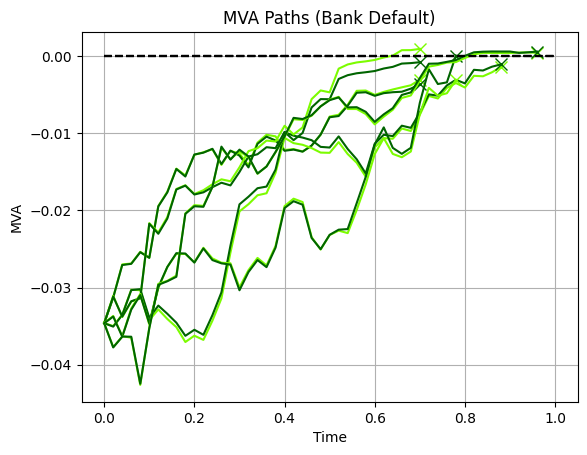

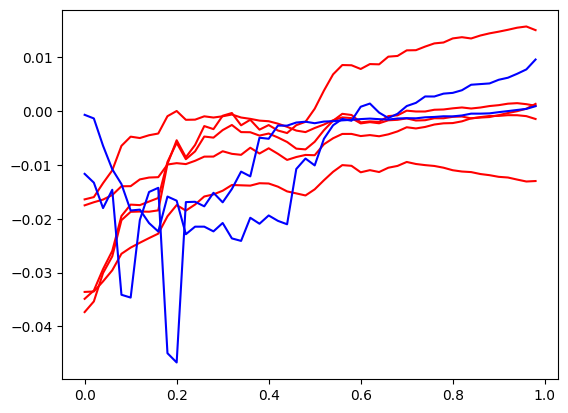

In [ ]:
t = np.linspace(0,1, MVA_m2.shape[1])
plt.plot(t,MVA_m2[bank_def_0,:], color = 'red')
plt.plot(t,MVA_m1[bank_def_0,:], color = 'blue')
plt.plot(t,MVA_w[0,:],'--', color = 'black')
plt.legend(['MVA (Approx. m2)','MVA (Approx.)', 'MVA (Ref.)'])
plt.grid()



plt.figure()
# Plot histograms for terminal errors for different events
plt.hist(errors_bank_def_m1, bins=50, alpha=0.75, color='#006400', edgecolor='black', label='Bank Default')
plt.hist(errors_bank_def_m2, bins=50, alpha=0.75, color='#7CFC00', edgecolor='black', label='Bank Default (m2)')
# Set x-axis limits to -0.02 to 0.01
plt.xlim(-0.02, 0.01)
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.grid()
plt.show()


plt.figure()
for idx in bank_def_index[10:15]:
    tau_idx = tau_min[idx]
    plt.plot(t[:tau_idx + 1], MVA_m2[idx, :tau_idx + 1], color='#7CFC00')
    plt.plot(t[tau_idx], MVA_m2[idx, tau_idx], 'x', markersize=8, color='#7CFC00')  # Add 'x' at end of path
    plt.plot(t[:tau_idx + 1], MVA_m1[idx, :tau_idx + 1], color='#006400')
    plt.plot(t[tau_idx], MVA_m1[idx, tau_idx], 'x', markersize=8, color='#006400')  # Add 'x' at end of path
    plt.plot(t, 0*t, '--', color='black', label='Ref.')
plt.title("MVA Paths (Bank Default)")
plt.xlabel("Time")
plt.ylabel("MVA")
plt.grid()
plt.show()

plt.figure()
plt.plot(t[:-1],MVAx_m2[bank_def_0,:d,:].T, color = 'red')
plt.plot(t[:-1],MVAx_m2[bank_def_0,d:,:].T, color = 'blue')


In [ ]:
# Suppose tau_min.shape = (N,) and MVAx_m2.shape = (N, 7, 50).
NN, _, TT = MVAx_m2.shape  #

# 1) Create a (N, T) mask: True where index >= tau for each row
mask_2d = np.arange(TT)[None, :] >= tau_min[:, None]  # shape = (N, T)

# 2) Expand mask to shape (N, 7, T) by repeating along dimension 1
mask_3d = np.repeat(mask_2d[:, None, :], d_defaultable, axis=1)  # shape = (N, 7, T)

# 3) Now use the (N, 7, T) boolean mask to zero out your arrays
MVAx_m2[mask_3d] = 0
MVAx_m1[mask_3d] = 0

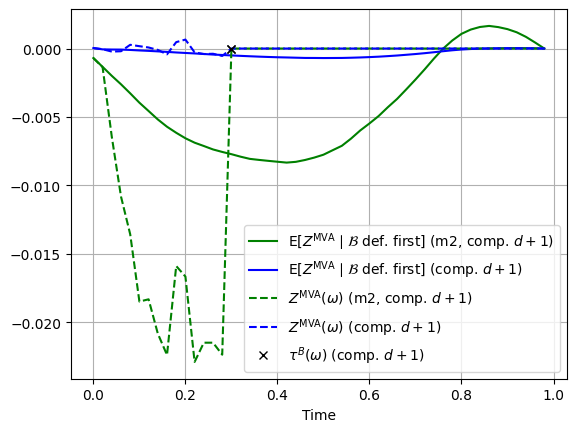

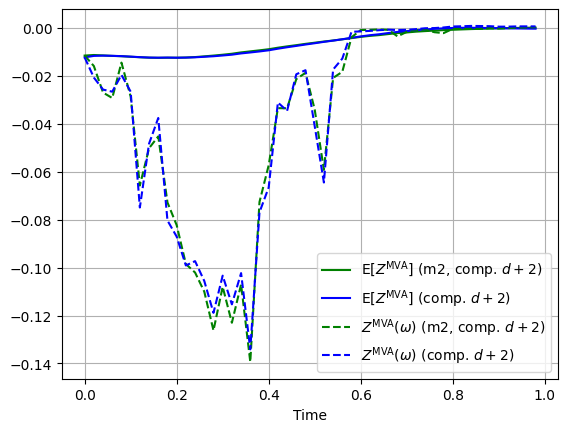

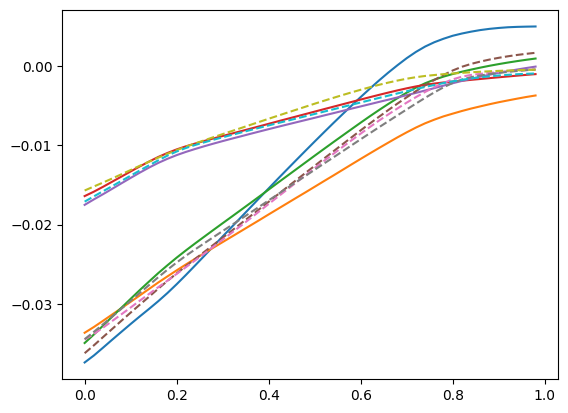

In [ ]:
plt.figure()
plt.plot(t[:-1], np.mean(MVAx_m2[bank_def_index,d,:],0).T, color = 'green')
plt.plot(t[:-1], np.mean(MVAx_m1[bank_def_index,d,:],0).T, color = 'blue')
plt.plot(t[:-1],MVAx_m2[bank_def_0,d,:].T, '--', color = 'green')
plt.plot(t[:-1],MVAx_m1[bank_def_0,d,:].T, '--', color = 'blue')
plt.plot([t[tau_min[bank_def_0]], t[tau_min[bank_def_0]]], [0,0],'kx')
plt.grid()
plt.legend([
    r'E$[Z^\mathrm{MVA} \mid \mathcal{B}\text{ def. first}]$ (m2, comp. $d+1$)',
    r'E$[Z^\mathrm{MVA} \mid \mathcal{B}\text{ def. first}]$ (comp. $d+1$)',
    r'$Z^\mathrm{MVA}(\omega)$ (m2, comp. $d+1$)',
    r'$Z^\mathrm{MVA}(\omega)$ (comp. $d+1$)',
    r'$\tau^B(\omega)$ (comp. $d+1$)'
])

plt.grid(True)
plt.xlabel('Time')
plt.show()

k = 6
plt.figure()
plt.plot(t[:-1], np.mean(MVAx_m2[:,k,:],0).T, color = 'green')
plt.plot(t[:-1], np.mean(MVAx_m1[:,k,:],0).T, color = 'blue')
plt.plot(t[:-1],MVAx_m2[tau_min[0],k,:].T, '--', color = 'green')
plt.plot(t[:-1],MVAx_m1[tau_min[0],k,:].T, '--', color = 'blue')
plt.grid()
plt.legend([
    r'E$[Z^\mathrm{MVA}]$ (m2, comp. $d+2$)',
    r'E$[Z^\mathrm{MVA}]$ (comp. $d+2$)',
    r'$Z^\mathrm{MVA}(\omega)$ (m2, comp. $d+2$)',
    r'$Z^\mathrm{MVA}(\omega)$ (comp. $d+2$)',
])
plt.xlabel('Time')
plt.show()


plt.figure()
plt.plot(t[:-1], np.mean(MVAx_m2[:,:d,:],0).T)
plt.plot(t[:-1], np.mean(MVAx_m1[:,:d,:],0).T,'--')




# CVA - Neural Network Class

In [ ]:
############## Define Neural Network Classes ##############
class SubNetwork(tf.keras.Model):   # 3 call methods, "call" for Vx, "second_call" for Vxx, "y0_call" for y0 used in deep DP
    def __init__(self, dim_x, dim_w, portfolio_pars, neurons, activation, use_batnorm = False, regu_cons=[0., 0.], ini_cons=None ):
        super(SubNetwork, self).__init__()
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.m = dim_w
        self.neurons = neurons
        self.activation = activation
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.use_batnorm = use_batnorm
        self.regu_1 = tf.keras.regularizers.L2( l2=regu_cons[0] )   # should same as self.regu_1 = None
        self.regu_2 = tf.keras.regularizers.L2( l2=regu_cons[1] )
        if ini_cons == None:
          self.ini_1 = "glorot_uniform"
          self.ini_2 = "zeros"
        else:
          self.ini_1 = tf.keras.initializers.Constant(value=ini_cons[0])
          self.ini_2 = tf.keras.initializers.Constant(value=ini_cons[1])
        self.dense_layers1 = []       # 12 are for each call method below
        self.dense_layers2 = []
        self.batch_norm1 = []
        self.batch_norm2 = []
        for i in range(len(self.neurons)):
            self.dense_layers1.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.dense_layers2.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.batch_norm1.append( tf.keras.layers.BatchNormalization() )
            self.batch_norm2.append( tf.keras.layers.BatchNormalization() )
        self.dense_out = tf.keras.layers.Dense(self.d_defaultable, activation='linear', use_bias=True, \
                            kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2)

    def call(self, x_in):         # get z.
        x = x_in
        #x = tf.squeeze(x_in, axis=-1)     # x_in.shape =[B,d]
        for i in range(len(self.neurons)):
            x = self.dense_layers1[i](x)
            if self.use_batnorm:
              x = self.batch_norm1[i](x)
        x = self.dense_out(x)
        return x    # output shape = [B,P_Z]

class FullNetwork_CVA(tf.keras.Model):
    def __init__(self, N, h, dim_x, dim_w, portfolio_pars, neurons=[16,16,16], activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None):
        super(FullNetwork_CVA, self).__init__()
        self.N = N    # number of subNN
        self.h = h    # step size
        self.dim_x = dim_x
        self.dim_w = dim_w
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.portfolio_parameters = portfolio_pars
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.neurons = neurons
        self.activation = activation
        self.use_batnorm = use_batnorm
        self.regu_cons = regu_cons
        self.ini_cons = ini_cons
        self.network = SubNetwork(dim_x=self.dim_x, dim_w=self.dim_w, portfolio_pars = self.portfolio_parameters, neurons=self.neurons, activation=self.activation, \
                                           use_batnorm=self.use_batnorm, regu_cons=self.regu_cons, ini_cons=self.ini_cons)
        self.CVA_0 = self.add_weight(name="CVA_0", shape=[1], initializer=tf.keras.initializers.RandomUniform(minval=0.0, maxval=0.1), trainable=True)
        self.LGD = 0.3


    def call(self, x_input):    # input shape x=[B,d,1]
        # Initializations #
        NNx = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNx_reduced = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NN_CVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_CVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NNy = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNy_sum = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NN_IM = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        ####################

        # Initialize tau #
        tau = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        ##################

        # Update X_0 #
        NNx = NNx.write(0, x_input)
        NNx_reduced = NNx_reduced.write(0, NNx.read(0)[:,:d])
        ##############

        # Update CVA_0 #
        NN_CVA = NN_CVA.write(0, tf.broadcast_to(self.CVA_0, [batch_size]))  # Broadcasting y_0
        ################

        mean_CVA = []
        mean_CVA.append( tf.reduce_mean(NN_CVA.read(0)))

        # Update Y_0 #
        NNy = NNy.write(0, tf.broadcast_to(full_model_2.y_0, [batch_size, P_Y]))
        NNy_sum = NNy_sum.write(0, tf.reduce_sum(NNy.read(0), axis=1))  # Sum over P_Y components
        ##############

        # Update IM_0 #
        q_99 = tf.cast(q_alpha_high_0, dtype=tf.float32)
        q_01 = tf.cast(q_alpha_low_0, dtype=tf.float32)

        NN_IM_0 = tf.stack([tf.fill([batch_size], q_99), tf.fill([batch_size], q_01)], axis=1)
        NN_IM = NN_IM.write(0, NN_IM_0)
        ###############
        for n in range(0, self.N):
          NNdW = tf.random.normal( shape = [batch_size,self.dim_w], mean=0, stddev=np.sqrt(self.h))
          NNdW_reduced = NNdW[:,:d]
          time_tensor = tf.fill([batch_size, 1], tf.cast(n * self.h, dtype=tf.float32))

          # Update Z_CVA_n #
          #inp_CVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          exposure_n = (1 - alpha) * NNy_sum.read(n) - NN_IM.read(n)[:,0]
          pos_exp_n = tf.maximum(exposure_n, 0)
          #neg_exp_n = tf.maximum(-( (1 - alpha) * NNy_sum.read(n) - NN_IM.read(n)[:,0] ), 0)
          target_n = self.LGD * pos_exp_n
          inp_CVA = tf.concat([NNx.read(n), tf.expand_dims(exposure_n , axis=1), time_tensor], axis=1)
          NNvx_CVA = NNvx_CVA.write(n, self.network( inp_CVA ))
          ##################

          # Update CVA_{n+1} #
          CVA_np1 = model_3.F_CVA(NNx.read(n), NN_CVA.read(n), NNvx_CVA.read(n), NNdW) - self.h * b2 * NNvx_CVA.read(n)[:, -1]
          NN_CVA = NN_CVA.write(n+1,CVA_np1)
          ####################

          # Update Y_{n+1} #
          inp_y = tf.concat([NNx_reduced.read(n), time_tensor], axis=1)
          NNvx = NNvx.write(n, full_model_2.network( inp_y ))
          NNy_temp = []
          for p in range(0,self.P_Y):
            if n < N_p[p]:
              NNy_p = model_2.F_Y(NNx_reduced.read(n), NNy.read(n)[:,p], NNvx.read(n), NNdW_reduced, self.ind_X[p], self.ind_Z[p], self.d_p[p])
            else:
              NNy_p = tf.zeros(batch_size)
            NNy_temp.append(NNy_p)
          NNy = NNy.write(n + 1,tf.stack(NNy_temp, axis=1))
          NNy_sum = NNy_sum.write(n+1, tf.reduce_sum(NNy.read(n+1), axis=1))  # Sum over P_Y components
          ##################

          # Update and X_{n+1} #
          CM = tf.constant([0, 0, 0, 0, 0, 0, -self.h * b2], dtype=tf.float32)
          CM = tf.tile(tf.expand_dims(CM, axis=0), [batch_size, 1])  # Shape: (batch_size, dim_x)
          NNx_temp = model_3.F_X_EM(NNx.read(n), NNdW) + CM
          NNx = NNx.write(n + 1, NNx_temp)
          NNx_reduced =  NNx_reduced.write(n + 1, NNx.read(n+1)[:,:d])
          ###########################

          # Update IM_{n+1} #
          if n < self.N - 1:
            inp_IM = tf.concat([NNx_reduced.read(n+1), NNy.read(n+1), tf.expand_dims(NNy_sum.read(n+1), axis=1)], axis=1)
            q_model_output = loaded_q_models[n+1](inp_IM)
            q_0 = tf.maximum(q_model_output[:, 0], 0)
            q_1 = tf.minimum(q_model_output[:, 1], 0)
            NN_IM = NN_IM.write(n+1, tf.stack([q_0, q_1], axis=1))
          else:
            # For the last iteration, write a tensor of zeros
            NN_IM = NN_IM.write(n+1, tf.zeros([batch_size, 2], dtype=tf.float32))
          ##################
          # Updating tau #
          # Condition for tau1 and tau2
          condition_1 = tf.less(NNx.read(n + 1)[:, -2], B1)  # Access second-to-last column
          condition_2 = tf.less(NNx.read(n + 1)[:, -1], B2)  # Access last column
          # Update tau[:, 0] for the first time step where condition_1 is True
          tau_cond_1 = tf.where(tf.logical_and(condition_1, tf.equal(tau[:, 0], self.N + 1)), n + 1, tau[:, 0])
          # Update tau[:, 1] for the first time step where condition_2 is True
          tau_cond_2 = tf.where(tf.logical_and(condition_2, tf.equal(tau[:, 1], self.N + 1)), n + 1, tau[:, 1])
          # Update tau with new values
          tau = tf.stack([tau_cond_1, tau_cond_2], axis=1)
          ################

        min_tau = tf.minimum(tf.cast(self.N, tf.int32), tf.minimum(tau[:, 0], tau[:, 1]))  # Find the minimum tau per batch
        tau_source = tf.zeros_like(tau[:, 0], dtype=tf.int32)
        tau_source = tf.where(tf.equal(min_tau, tau[:, 1]), 2, tau_source) # If min_tau_p comes from tau2 (tau[:, 1]), set tau_source to 2
        tau_source = tf.where(tf.equal(min_tau, tau[:, 0]), 1, tau_source)  # If min_tau_p comes from tau1 (tau[:, 0]), set tau_source to 1
        tau_source = tf.where(tf.equal(min_tau, self.N), 0, tau_source) # If min_tau_p comes from N_p[p], leave tau_source as 0

        batch_indices = tf.range(batch_size, dtype=tf.int32)
        gather_indices = tf.stack([min_tau, batch_indices], axis=1)

        # Gather CVA, margin, etc. at the correct stopping index
        NN_CVA_tau = tf.gather_nd(NN_CVA.stack(), gather_indices)
        NN_IM_tau = tf.gather_nd(NN_IM.stack(), gather_indices)[:,0]
        NNy_sum_tau = tf.gather_nd(NNy_sum.stack(), gather_indices)
        NNx_reduced_tau = tf.gather_nd(NNx_reduced.stack(), gather_indices)

        # Define different payoffs/targets depending on scenario
        #pay_no_default    = tf.zeros([batch_size], dtype=tf.float32)  # shape [batch_size]
        #pay_bank_default  = tf.zeros([batch_size], dtype=tf.float32)  # or your own formula
        #pay_cpty_default  = tf.maximum(LGD * ((1 - alpha) * NNy_sum_tau - NN_IM_tau), 0)  # or your own formula
        pay_no_default    = 0*self.LGD * tf.maximum(((1 - alpha) * NNy_sum_tau - NN_IM_tau),0)  # shape [batch_size]
        pay_bank_default  = 0*self.LGD * tf.maximum(((1 - alpha) * NNy_sum_tau - NN_IM_tau),0)  # or your own formula
        pay_cpty_default  = self.LGD * tf.maximum(((1 - alpha) * NNy_sum_tau - NN_IM_tau),0)  # or your own formula

        # Build final_target using tf.where
        cond_no_def  = tf.equal(tau_source, 0)
        cond_bank    = tf.equal(tau_source, 1)
        cond_cpty    = tf.equal(tau_source, 2)

        final_target = tf.where(cond_no_def,
            pay_no_default,
            tf.where(cond_bank, pay_bank_default, pay_cpty_default)
        )

        # Compute MSE (or whichever loss) vs. the actual NN_CVA_tau
        loss_final = tf.reduce_mean((NN_CVA_tau - final_target)**2)
        #loss_final = tf.reduce_mean((NN_CVA_tau - model_3.g_2(NNx_reduced_tau, 0.8, tau_source)[:, 0]) ** 2)
        loss_0 = tf.reduce_mean(tf.cast(condition_1, tf.float32))  # bank-default fraction
        loss_1 = tf.reduce_mean(tf.cast(condition_2, tf.float32))  # cpty-default fraction
        loss_2 = tf.reduce_mean(tf.cast(min_tau,   tf.float32))    # average stopping time

        return NN_CVA.read(0)[0], loss_0, loss_1, loss_2, loss_final


# CVA - Train neural network


Start of epoch 0


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network_3', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Training loss at step 0: 0.03363131
Seen so far: 2048 samples
The current learning rate is 0.0049980474
CVA_0 (approx.):  0.020123148 CVA_0 (ref.):  0.02697804619726595
loss_0:  0.001953125 loss_1:  0.0053710938 loss_2:  199.71338
Time elapsed 802.6028196811676

Start of epoch 1
Training loss at step 0: 0.00000144
Seen so far: 2048 samples
The current learning rate is 0.0040920554
CVA_0 (approx.):  0.00020692483 CVA_0 (ref.):  0.02697804619726595
loss_0:  0.0029296875 loss_1:  0.0024414062 loss_2:  199.72656
Time elapsed 253.22995924949646

Start of epoch 2
Training loss at step 0: 0.00006152
Seen so far: 2048 samples
The current learning rate is 0.0033502914
CVA_0 (approx.):  0.00013657918 CVA_0 (ref.):  0.02697804619726595
loss_0:  0.0024414062 loss_1:  0.0043945312 loss_2:  199.65723
Time elapsed 251.7761356830597

Start of epoch 3
Training loss at step 0: 0.00007633
Seen so far: 2048 samples
The current learning rate is 0.0027429867
CVA_0 (approx.):  4.2727836e-05 CVA_0 (ref.):  0.

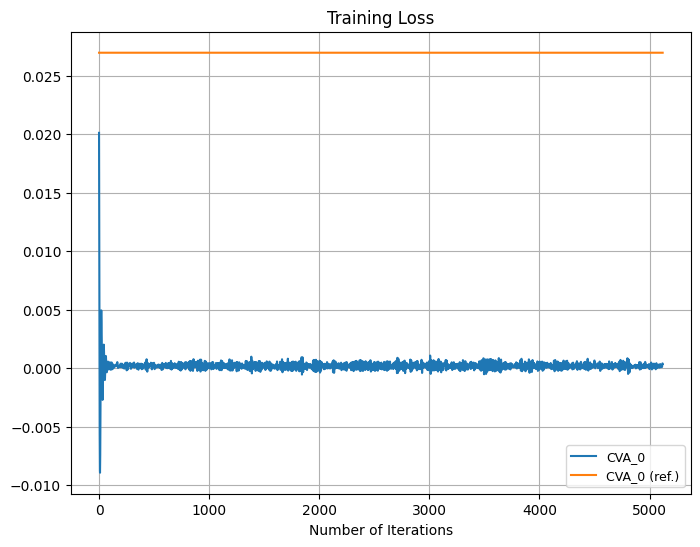

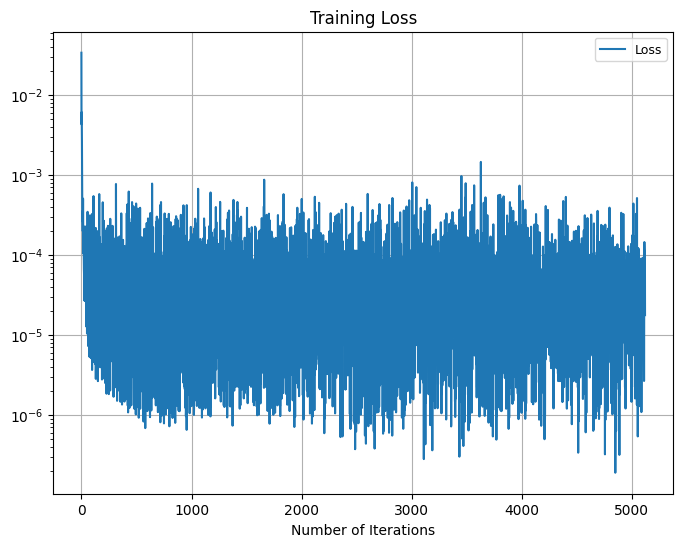

In [ ]:
# NN params
num_epochs = 10
batch_size = 2**11 #2**12
initial_lr = 0.005
neurons = [50,50,50,50]
M_train = 2**20  # Number training of samples
###########

sigma_defaultable = tf.constant([0.2, 0.25, 0.25, 0.25, 0.3, 0.2, 0.3], dtype=tf.float32)
corr_matrix_defaultable = tf.constant([
    [1.0, 0.9, 0.2, 0.5, 0.1, 0.1, 0.2],
    [0.9, 1.0, 0.4, 0.3, 0.2, 0.3, 0.2],
    [0.2, 0.4, 1.0, 0.2, 0.75, 0.15, 0.25],
    [0.5, 0.3, 0.2, 1.0, 0.35, 0.05, 0.15],
    [0.1, 0.2, 0.75, 0.35, 1.0, 0.15, 0.05],
    [0.1, 0.3, 0.15, 0.05, 0.15, 1.0, 0.25],
    [0.2, 0.2, 0.25, 0.15, 0.05, 0.25, 1.0]
], dtype=tf.float32)
L_defaultable = np.linalg.cholesky(corr_matrix_defaultable)


# Prepare the training dataset
LGD = .3
alpha = 0.5 # C = alpha*V
#B1 = 0.625
#B2 = 0.75
measures = 2
b1 = 0.
b2 = 0.  #0.25
B1 = 0.575#0.575
B2 = 0.45#0.675
d_defaultable = d + 2
x0 = np.ones([M_train,d_defaultable])
x0_tf = tf.convert_to_tensor(x0, dtype=tf.float32)
x_train = x0_tf    # shape = [M_train, dim_x, 1]
y_train = tf.zeros( [M_train, 1] )
train_dataset = tf.data.Dataset.from_tensor_slices( (x_train, y_train) )
#train_dataset = train_dataset.shuffle(buffer_size=batch_size*10).batch(batch_size)  # buffer_size doesn't matter in this code
train_dataset = train_dataset.batch(batch_size)

model_parameters_3 = ['GBM', h, d_defaultable, r, sigma_defaultable, L_defaultable]
model_3 = ModelClass(model_parameters_3)
portfolio_parameters_tf = [P_Y, P_Z, ind_X, ind_Z, d_p, K_p]
CVA_model = FullNetwork_CVA(N=N, h=h, dim_x=d_defaultable, dim_w=d_defaultable, portfolio_pars = portfolio_parameters_tf, \
            neurons=neurons, activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None)


CVA_0_history = []
loss_history = []
lr_history = []
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_lr, decay_steps=int(M_train/batch_size), decay_rate=tf.math.exp(-0.2), staircase=False)
optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
#optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule)

# customize loss function
def dummy_loss(y_true, y_model):
    return y_model  # Return the full list of losses


@tf.function
def train_step(input_x, input_y):
    with tf.GradientTape() as tape:
        # Unpack the outputs from the model
        NN_CVA_0, loss_0, loss_1, loss_2, loss_value = CVA_model(input_x, training=True)
    # Compute gradients
    grads = tape.gradient(loss_value, CVA_model.trainable_weights)
    # Apply gradients to update the model weights
    optimizer.apply_gradients(zip(grads, CVA_model.trainable_weights))
    return [NN_CVA_0, loss_0, loss_1, loss_2, loss_value, grads]

# customized train loop
start = time.time()
for epoch in range(num_epochs):
    print("\nStart of epoch %d" % (epoch,))
    # Iterate over the batches of the dataset.
    for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
        output_train = train_step(x_batch_train, y_batch_train)
        NN_CVA_0 = output_train[0].numpy()
        loss_0 = output_train[1].numpy()
        loss_1 = output_train[2].numpy()
        loss_2 = output_train[3].numpy()
        loss_value = output_train[4].numpy()
        CVA_0_history.append(NN_CVA_0)
        loss_history.append(loss_value)
        lr_history.append(lr_schedule(optimizer.iterations).numpy())

        if step == 0:
            print("Training loss at step %d: %.8f" % (step, float(loss_value)) )
            print("Seen so far: %s samples" % ((step + 1) * batch_size))
            print("The current learning rate is", lr_schedule(optimizer.iterations).numpy())
            print('CVA_0 (approx.): ', NN_CVA_0, 'CVA_0 (ref.): ', 0.02697804619726595)
            print('loss_0: ', loss_0, 'loss_1: ', loss_1, 'loss_2: ', loss_2)
            end = time.time()
            print('Time elapsed', end - start)
            start = time.time()



######################### print loss and save loss history and learning rate history
plt.figure(figsize=(8, 6))
plt.plot(CVA_0_history, label='CVA_0')
plt.plot(np.ones(len(CVA_0_history))*(0.02697804619726595), label='CVA_0 (ref.)')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.grid()
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(loss_history, label='Loss')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.yscale('log')
plt.grid()
plt.show()

# CVA - Store parameters for future use

In [ ]:
### Saves locally ###

# Define the time steps extension
extension = "_200_push_low_def"

# Create directories for weights and parameters if they don't exist
os.makedirs('path_to_weights', exist_ok=True)
os.makedirs('path_to_parameters', exist_ok=True)

# Save the weights with the time steps extension
weights_path = f'path_to_weights/CVA_model_weights{extension}.weights.h5'
CVA_model.save_weights(weights_path)


# Define the parameters to save
params_to_save = {
    'model_parameters_3': model_parameters_3,
    'portfolio_parameters_tf': portfolio_parameters_tf,
    'num_epochs': num_epochs,
    'batch_size': batch_size,
    'initial_lr': initial_lr,
    'neurons': neurons,
    'M_train': M_train,
    'N': N,
    'd_defaultable': d_defaultable,
    'T': T,
    't': t,
    'h': h,
    'r': r,
    'x0': x0,
    'sigma_defaultable': sigma_defaultable,
    'corr_matrix_defaultable': corr_matrix_defaultable,
    'L_defaultable': L_defaultable,
    'B1': B1,
    'B2': B2,
    'measures': measures,
    'b1': b1,
    'b2': b2,
    'ind_X': ind_X,
    'd_p': d_p,
    'P_Y': P_Y,
    'P_Z': P_Z,
    'K_p': K_p,
    'N_p': N_p,
    'T_p': T_p,
    'ind_Z': ind_Z,
    'MC_prices_0': MC_prices_0,
    'MC_prices': MC_prices
}

# Save the parameters with the time steps extension
parameters_path = f'path_to_parameters/MVA_parameters{extension}.pkl'
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save, f)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')



# Define paths in Google Drive with the extension
weights_path = f'/content/drive/MyDrive/CVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/CVA_parameters{extension}.pkl'

# Save the weights to Google Drive
CVA_model.save_weights(weights_path)

# Function to convert TensorFlow tensors to NumPy arrays
def convert_tensors(obj):
    if isinstance(obj, tf.Tensor):
        return obj.numpy()
    elif isinstance(obj, list):
        return [convert_tensors(item) for item in obj]
    elif isinstance(obj, dict):
        return {key: convert_tensors(value) for key, value in obj.items()}
    else:
        return obj

# Convert TensorFlow tensors to NumPy arrays
params_to_save_converted = convert_tensors(params_to_save)

# Save the parameters to Google Drive
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save_converted, f)

print(f"Weights saved to {weights_path}")
print(f"Parameters saved to {parameters_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Weights saved to /content/drive/MyDrive/CVA_model_weights_200_low_def.weights.h5
Parameters saved to /content/drive/MyDrive/CVA_parameters_200_low_def.pkl


In [ ]:
import os

# Define the save path
save_path = '/content/drive/My Drive/CVA_approximations/'

# Ensure the directory exists
os.makedirs(save_path, exist_ok=True)

# Define the pickle file name with the suffix
suffix = "_m1"
pickle_filename = f"errors_data{suffix}.pkl"

# Save the variables
import pickle
with open(save_path + pickle_filename, 'wb') as f:
    pickle.dump({
        f'errors_no_def{suffix}': errors_no_def,
        f'errors_bank_def{suffix}': errors_bank_def,
        f'errors_counterparty_def{suffix}': errors_counterparty_def,
        #f'MVA_w': MVA_w,
        f'CVA{suffix}': CVA,
        f'CVA_w{suffix}': CVA_w,
        f'CVAx{suffix}': CVAx,
    }, f)

print(f"Data successfully saved to {save_path + pickle_filename}")

Data successfully saved to /content/drive/My Drive/CVA_approximations/errors_data_m1.pkl


# CVA - Load parameters

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pickle
import tensorflow as tf

# Define the extension for the file names
extension = "_200_low_def"  # Use "" for old parameters without extensions, or "_200" for new ones

# Define paths using the extension
weights_path = f'/content/drive/MyDrive/CVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/CVA_parameters{extension}.pkl'

# Load the parameters
with open(parameters_path, 'rb') as f:
    params_loaded = pickle.load(f)

# Reconstruct necessary variables and model as before
model_parameters_3 = params_loaded['model_parameters_3']
portfolio_parameters_tf = params_loaded['portfolio_parameters_tf']
neurons = params_loaded['neurons']
N = params_loaded['N']
h = params_loaded['h']
d_defaultable = params_loaded['d_defaultable']
T = params_loaded['T']
t = params_loaded['t']
r = params_loaded['r']
sigma_defaultable = params_loaded['sigma_defaultable']
corr_matrix_defaultable = params_loaded['corr_matrix_defaultable']
L_defaultable = params_loaded['L_defaultable']
B1 = params_loaded['B1']
B2 = params_loaded['B2']
measures = params_loaded['measures']
b1 = params_loaded['b1']
b2 = params_loaded['b2']
batch_size = params_loaded['batch_size']
x0_tf = tf.convert_to_tensor(params_loaded['x0'], dtype=tf.float32)
M_train = params_loaded['M_train']
P_Y = params_loaded['P_Y']
P_Z = params_loaded['P_Z']
ind_X = params_loaded['ind_X']
ind_Z = params_loaded['ind_Z']
d_p = params_loaded['d_p']
K_p = params_loaded['K_p']
N_p = params_loaded['N_p']
T_p = params_loaded['T_p']
MC_prices_0 = params_loaded['MC_prices_0']
MC_prices = params_loaded['MC_prices']

model_3 = ModelClass(model_parameters_3)


# Instantiate the model
CVA_model = FullNetwork_CVA(
    N=N,
    h=h,
    dim_x=d_defaultable,
    dim_w=d_defaultable,
    portfolio_pars=portfolio_parameters_tf,
    neurons=neurons,
    activation='relu',
    use_batnorm=False,
    regu_cons=[0., 0.],
    ini_cons=None
)

# Initialize the model before loading weights
dummy_input = x0_tf[:batch_size, :]  # shape = [2048, d_defaultable], for example
_ = CVA_model(dummy_input)

# Load the weights from Google Drive
CVA_model.load_weights(weights_path)

print(f"Weights and parameters loaded successfully from {weights_path} and {parameters_path}")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network_3', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Weights and parameters loaded successfully from /content/drive/MyDrive/CVA_model_weights_200_low_def.weights.h5 and /content/drive/MyDrive/CVA_parameters_200_low_def.pkl


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Define the save path and file name
save_path = '/content/drive/My Drive/CVA_approximations/'
suffix = "_200_push_low_def"
pickle_filename = f"errors_data{suffix}.pkl"

# Load the pickle file
with open(save_path + pickle_filename, 'rb') as f:
    data = pickle.load(f)

# Access the variables by their names (with the suffix)
errors_no_def = data[f'errors_no_def{suffix}']
errors_bank_def = data[f'errors_bank_def{suffix}']
errors_counterparty_def = data[f'errors_counterparty_def{suffix}']
#MVA_w = data[f'MVA_w']
CVA_m1 = data[f'CVA{suffix}']
CVAx_m1 = data[f'CVAx{suffix}']
CVA_w = data[f'CVA_w{suffix}']

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/CVA_approximations/errors_data_200_push_low_def.pkl'

# CVA - Evaluation

In [ ]:
# Initialize parameters
np.random.seed(0)
M_eval = 2**16
LGD = 0.3
X = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
X[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)
X_reduced = np.zeros([N+1, M_eval, d], dtype=np.float32)
X_reduced[0] = X[0][:,:d]

NN_Y = np.zeros([N+1, M_eval, P_Y], dtype=np.float32)
NN_Y[0] = np.tile(full_model_2.y_0.numpy(), (M_eval, 1))

Y = np.zeros([N+1, M_eval], dtype=np.float32)
Y[0] = np.sum(NN_Y[0], axis=1)

NN_Vx = np.zeros([N, M_eval, P_Z], dtype=np.float32)

q_alpha_pred = np.zeros([M_eval, 2, N+1], dtype=np.float32)
q_alpha_pred[:, 0, 0] = q_alpha_high_0
q_alpha_pred[:, 1, 0] = q_alpha_low_0

CVA = np.zeros([M_eval, N+1], dtype=np.float32)
CVA[:, 0] = CVA_model.CVA_0.numpy()
CVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)

tau = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]

# Main loop
for n in range(N):
    dW = np.random.normal(size=(M_eval, d_defaultable)) * np.sqrt(h)
    dW_reduced = dW[:,:d]
    inp_y = np.concatenate([X_reduced[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)

    # Update NN_Vx[n]
    NN_Vx[n] = full_model_2.network(inp_y).numpy()
    for p in range(P_Y):
        if n < N_p[p]:
            NN_Y[n+1, :, p] = model_2.F_Y(X_reduced[n], NN_Y[n, :, p], NN_Vx[n], dW_reduced, ind_X[p], ind_Z[p], d_p[p])
    Y[n+1] = np.sum(NN_Y[n+1], axis=1)

    # Update X[n+1]
    X[n+1] = model_3.F_X(X[n], dW)
    X_reduced[n+1] = X[n+1][:,:d]

    # Update tau
    condition_1 = X[n+1, :, -2] < B1  # Access second-to-last column
    condition_2 = X[n+1, :, -1] < B2  # Access last column
    tau[:, 0] = np.where(np.logical_and(condition_1, tau[:, 0] == N + 1), n + 1, tau[:, 0])
    tau[:, 1] = np.where(np.logical_and(condition_2, tau[:, 1] == N + 1), n + 1, tau[:, 1])

    # Compute tau_min
    tau_combined = np.vstack([np.full(M_eval, N), tau[:, 0], tau[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min = np.min(tau_combined, axis=1)  # Shape: [M_eval]

    # Create active masks using <= instead of <
    active_n = (n <= tau_min).astype(float)      # Paths active at time n

    # Compute CVA[:, n+1]
    if n > 0:
        inp_q = np.concatenate([X_reduced[n], NN_Y[n], Y[n][:, np.newaxis]], axis=1)
        q_output = loaded_q_models[n](inp_q, training = False)
        q_alpha_pred[:, 0, n] = np.maximum(q_output[:, 0], 0)
        q_alpha_pred[:, 1, n] = np.minimum(q_output[:, 1], 0)

    # Update CVAx[n]
    #inp_CVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    exposure_n = (1 - alpha) * Y[n, :] - q_alpha_pred[:, 0, n]
    pos_exposure_n = np.maximum(exposure_n, 0)
    target_n = LGD * pos_exposure_n
    inp_CVA = np.concatenate([X[n], np.expand_dims(exposure_n, axis=1), np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    #inp_CVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    CVAx[:, :, n] = CVA_model.network(inp_CVA, training = False)
    #############
    CVA[:, n+1] = model_3.F_CVA(X[n], CVA[:, n], CVAx[:, :, n], dW) * active_n + CVA[:, n] * (1 - active_n)

# Compute tau_min
tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]

# Post-processing
X = np.transpose(X, axes=[1, 2, 0])
X_reduced = np.transpose(X_reduced, axes=[1, 2, 0])
NN_Y = np.transpose(NN_Y, axes=[1, 2, 0])
NN_Vx = np.transpose(NN_Vx, axes=[1, 2, 0])

for p in range(P_Y):
    NN_Vx[:, N_p[p]:, ind_Z[p]:ind_Z[p]+d_p[p]] = 0

YT = []
Y0 = []
for p in range(P_Y):
    YT_p = model_2.g(X[:, :, N_p[p]], K_p[p], ind_X[p], d_p[p])
    YT.append(YT_p)
    Y0.append(np.exp(-r * T_p[p]) * np.mean(YT_p))

Y = np.sum(NN_Y, axis=1)

print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)

No defaul:  0.990478515625 Counterparty defaults:  0.0064697265625 Bank Defaults:  0.0030517578125


In [ ]:
LGD = .3
alpha = .5

exposure_at_default_0 = Y[no_def_index,tau_min[no_def_index]]*(1-alpha) - q_alpha_pred[no_def_index,0,tau_min[no_def_index]-1]
discount_0 = np.exp(-r*h*tau_min[no_def_index])
pos_exposure_at_default_0 = 0*np.maximum(exposure_at_default_0,0)

exposure_at_default_1 = Y[bank_def_index,tau_min[bank_def_index]]*(1-alpha) - q_alpha_pred[bank_def_index,0,tau_min[bank_def_index]]
discount_1 = np.exp(-r*h*tau_min[bank_def_index])
pos_exposure_at_default_1 = 0*np.maximum(exposure_at_default_1,0)

exposure_at_default_2 = Y[counterparty_def_index,tau_min[counterparty_def_index]]*(1-alpha) - q_alpha_pred[counterparty_def_index,0,tau_min[counterparty_def_index]]
discount_2 = np.exp(-r*h*tau_min[counterparty_def_index])
pos_exposure_at_default_2 = np.maximum(exposure_at_default_2,0)

MC_CVA_0 = 1/M_eval*( np.sum(LGD*discount_0*pos_exposure_at_default_0) + np.sum(LGD*discount_1*pos_exposure_at_default_1) + np.sum(LGD*discount_2*pos_exposure_at_default_2) )
mse_0 = np.mean((CVA[no_def_index, tau_min[no_def_index]] - LGD*pos_exposure_at_default_0)**2)
mse_1 = np.mean((CVA[bank_def_index, tau_min[bank_def_index]] - LGD*pos_exposure_at_default_1)**2)
mse_2 = np.mean((CVA[counterparty_def_index, tau_min[counterparty_def_index]] - LGD*pos_exposure_at_default_2)**2)
mse = 1 / M_eval * ( np.sum( (CVA[no_def_index, tau_min[no_def_index]] - LGD*pos_exposure_at_default_0)**2) + np.sum( (CVA[bank_def_index, tau_min[bank_def_index]] - LGD*pos_exposure_at_default_1)**2 ) + np.sum( (CVA[counterparty_def_index, tau_min[counterparty_def_index]] - LGD*pos_exposure_at_default_2)**2 ) )

print(MC_CVA_0, mse_0, mse_1, mse_2, mse)


0.00022741047356951305 4.5491843e-06 8.066415e-06 0.011022357 7.584212289657444e-05


In [ ]:
np.random.seed(1)
W = 1
w_0 = 31764
C_alpha = 0.5
M_ref = 2**16
CVA_w = np.zeros([W,N+1])
CVA_w[:,0] = MC_CVA_0

for k in range(1,N):
  print('k: ', k)
  for w in range(w_0, w_0 + W):
    tau_w = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]

    X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
    NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
    Y_ref = tf.reduce_sum(NN_Y_ref, axis=1)

    alive_counterparty = np.ones(M_ref)
    alive_bank = np.ones(M_ref)
    alive_counterparty_nm1 = np.ones(M_ref)
    alive_bank_nm1 = np.ones(M_ref)
    theta = np.zeros(M_ref)

    for n in range(k, N):
      dW = tf.cast(np.random.normal(size=(M_ref, d+2)) * np.sqrt(h), tf.float32)

      # defaulted or not #
      alive_counterparty = alive_counterparty * tf.cast(X_ref[:, -1] > B2, dtype=tf.float32)
      alive_bank = alive_bank * tf.cast(X_ref[:, -2] > B1, dtype=tf.float32)

      # Update IM
      inp_IM = tf.concat([X_ref[:, :d], NN_Y_ref, tf.expand_dims(Y_ref, axis=1)], axis=1)
      q_alpha_pred_ref = loaded_q_models[n](inp_IM, training=False)

      # Update Y
      inp_y = tf.concat([X_ref[:,:d], tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
      NN_Vx_ref = tf.cast( full_model_2.network( inp_y ), tf.float32)
      NN_Y_temp_p = []
      for p in range(0, P_Y):
        if n < N_p[p]:
          NN_Y_temp_p.append(model_2.F_Y(X_ref[:,:d], NN_Y_ref[:,p], NN_Vx_ref, dW[:,:d], ind_X[p], ind_Z[p], d_p[p]))
        else:
          NN_Y_temp_p.append(tf.zeros(M_ref))
      NN_Y_ref = np.stack(NN_Y_temp_p, axis=1)
      Y_ref = np.sum(NN_Y_ref, axis=1)
      ##########

      # Update X #
      X_ref = model_3.F_X(X_ref, dW)
      ############
      discount = np.exp(-r*(t[n] - t[k]))
      n_tau_c = alive_counterparty_nm1 * (1 - alive_counterparty) * alive_bank_nm1
      exposure_n = (1 - C_alpha) * Y_ref - np.maximum(q_alpha_pred_ref[:,0], 0)
      pos_exposure_n = np.maximum(exposure_n, 0)
      theta =  (1 - n_tau_c) * theta + n_tau_c * discount * LGD * pos_exposure_n

      alive_counterparty_nm1 = alive_counterparty
      alive_bank_nm1 = alive_bank

    CVA_w[w-w_0,k] = np.mean(theta)
    print('CVA: ', CVA0[w,k], 'CVA_w: ', CVA_w[w-w_0,k])
for w in range(w_0, w_0 + W):
  CVA_w[w-w_0,tau_min[w]+1:] = 0

k:  1
CVA:  0.00033304078 CVA_w:  0.00022716930834576488
k:  2
CVA:  0.00018375805 CVA_w:  0.00010858994210138917
k:  3
CVA:  0.0002587826 CVA_w:  0.000199228132260032
k:  4
CVA:  0.00035624873 CVA_w:  0.0002840359811671078
k:  5
CVA:  0.00020415112 CVA_w:  0.0002831235760822892
k:  6
CVA:  0.00011256051 CVA_w:  0.0001735509285936132
k:  7
CVA:  0.00014385078 CVA_w:  0.00020566055900417268
k:  8
CVA:  3.770201e-05 CVA_w:  0.00011804227688116953
k:  9
CVA:  8.2464e-05 CVA_w:  0.00022785368491895497
k:  10
CVA:  0.00022629817 CVA_w:  0.0002223960036644712
k:  11
CVA:  0.00032541336 CVA_w:  0.00026550269103609025
k:  12
CVA:  0.00034890682 CVA_w:  0.0003059550072066486
k:  13
CVA:  0.00026302418 CVA_w:  0.0002647259971126914
k:  14
CVA:  0.00024776766 CVA_w:  0.00019898060418199748
k:  15
CVA:  0.00019923989 CVA_w:  0.00021195407316554338
k:  16
CVA:  0.00044434483 CVA_w:  0.0004824564093723893
k:  17
CVA:  0.00040104796 CVA_w:  0.00044918095227330923
k:  18
CVA:  0.0005549669 CVA_w:  0.0

155


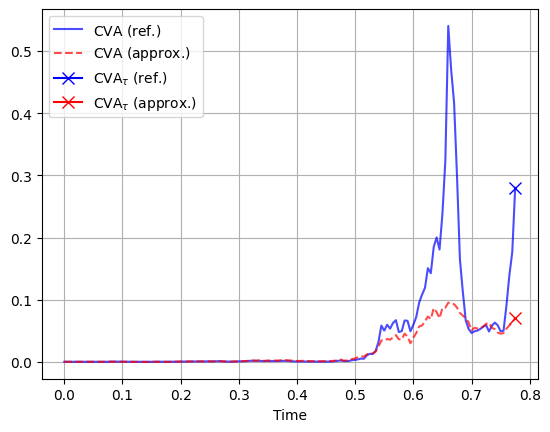

In [ ]:
for i, w in enumerate(range(w_0, w_0+W)):
    tau_w = tau_min[w]
    # Slice up to and including the default time (or final time)
    t_slice = t[:tau_w+1]
    # Reference MVA sample path
    if w < w_0+1:
      cva_slice = CVA[w, :tau_w+1]
    else:
      cva_slice = CVA[w, :tau_w+1]

    # Approximation sample path
    cva_w_slice = CVA_w[w - w_0, :tau_w+1]  # adjust index if needed

    # Plot the reference path
    plt.plot(
        t_slice, cva_w_slice,
        linestyle='-', alpha=0.7, color='blue',
        label=r'$\text{CVA (ref.)}$' if i == 0 else ""
    )
    # Plot the approximation path
    plt.plot(
        t_slice, cva_slice,
        linestyle='--', alpha=0.7, color='red',
        label=r'$\text{CVA (approx.)}$' if i == 0 else ""
    )

    # If this path defaults before index 200, put an "x" at the final point
    print(tau_w)
    if tau_w < 200:
        # Blue cross for the reference
        plt.plot(
            t[tau_w], CVA_w[w-w_0, tau_w],
            marker='x', color='blue', markersize=8,
            label=r'$\text{CVA}_{\tau}$ (ref.)' if i == 0 else ""
        )
        # Red cross for the approximation
        plt.plot(
            t[tau_w], CVA[w, tau_w],
            marker='x', color='red', markersize=8,
            label=r'$\text{CVA}_{\tau}$ (approx.)' if i == 0 else ""
        )

plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()


<ipython-input-117-c38caec0cd97>:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')
<ipython-input-117-c38caec0cd97>:37: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


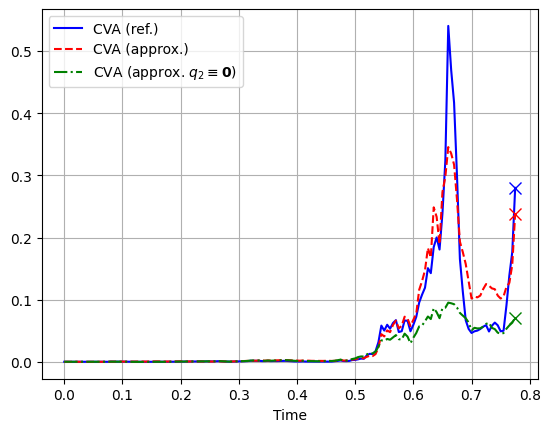

<Figure size 640x480 with 0 Axes>

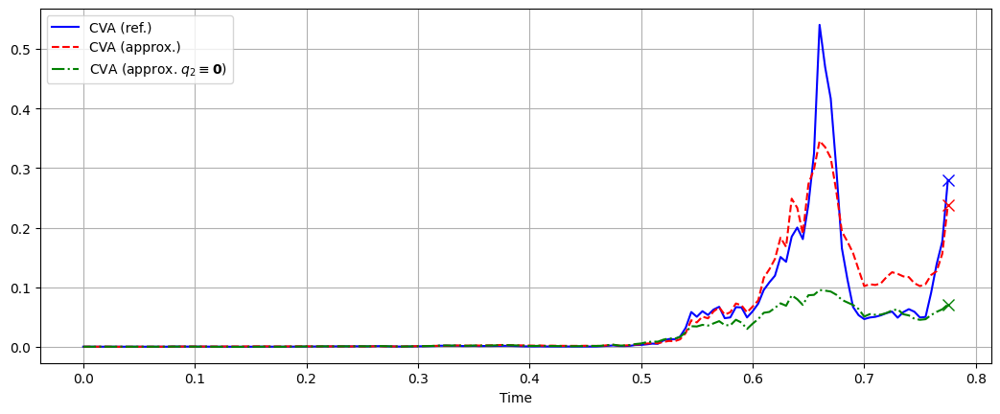

In [ ]:
'''
plt.plot(t[:tau_w],CVAx[w_0,-1,:tau_w], color='darkred')
plt.plot(t[:tau_w], np.mean(CVAx[counterparty_def_index, -1, :tau_w],0),'--', color= 'darkred')
plt.plot(t[:tau_w],CVAx0[w_0, -1, :tau_w], color = 'darkblue')
plt.plot(t[:tau_w],ECVAx_m1[:tau_w],'--', color = 'darkblue')

plt.grid()
plt.legend(loc='best')
plt.legend([r'$Z^\text{CVA}$', r'E$[Z^\text{CVA}|\tau^B<T]$', r'$Z^\text{CVA}$ ($q_2\equiv \mathbf{0}$)', r'E$[Z^\text{CVA}|\tau^B<T]$ ($q_2\equiv \mathbf{0}$)',])
plt.xlabel('Time')

plt.figure()
'''

plt.plot(t[:tau_w+1],CVA_w[0,:tau_w+1], color='blue')
plt.plot(t[:tau_w+1],CVA0[w_0,:tau_w+1], '--', color = 'red')
plt.plot(t[:tau_w+1], CVA[w_0,:tau_w+1], '-.', color='green')
plt.plot(t[tau_w], CVA_w[0, tau_w],marker='x', color='blue', markersize=8)
plt.plot(t[tau_w], CVA[w_0, tau_w],marker='x', color='green', markersize=8)
plt.plot(t[tau_w], CVA0[w_0, tau_w],marker='x', color='red', markersize=8)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Time')
plt.legend(['CVA (ref.)', 'CVA (approx.)', r'CVA (approx. $q_2\equiv \mathbf{0}$)'])



plt.figure()
plt.figure(figsize=(12.8,4.8))
plt.plot(t[:tau_w+1],CVA_w[0,:tau_w+1], color='blue')
plt.plot(t[:tau_w+1],CVA0[w_0,:tau_w+1], '--', color = 'red')
plt.plot(t[:tau_w+1], CVA[w_0,:tau_w+1], '-.', color='green')
plt.plot(t[tau_w], CVA_w[0, tau_w],marker='x', color='blue', markersize=8)
plt.plot(t[tau_w], CVA[w_0, tau_w],marker='x', color='green', markersize=8)
plt.plot(t[tau_w], CVA0[w_0, tau_w],marker='x', color='red', markersize=8)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Time')
plt.legend(['CVA (ref.)', 'CVA (approx.)', r'CVA (approx. $q_2\equiv \mathbf{0}$)'])



In [ ]:
tau_min[w_0]*h

0.775

199


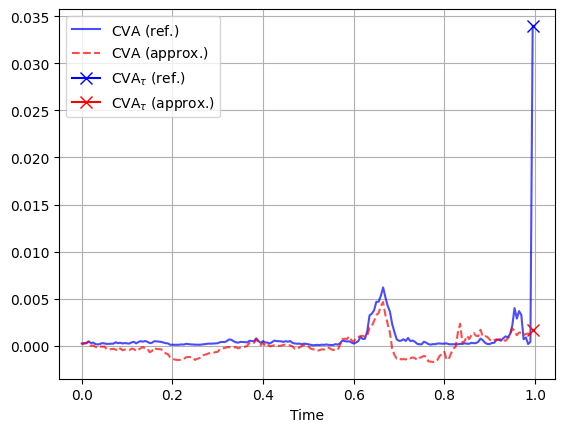

In [ ]:
for i, w in enumerate(range(w_0, w_0+W)):
    tau_w = tau_min[w]
    # Slice up to and including the default time (or final time)
    t_slice = t[:tau_w+1]
    # Reference MVA sample path
    if w < w_0+1:
      cva_slice = CVA[w, :tau_w+1]
    else:
      cva_slice = CVA[w, :tau_w+1]

    # Approximation sample path
    cva_w_slice = CVA_w[w - w_0, :tau_w+1]  # adjust index if needed

    # Plot the reference path
    plt.plot(
        t_slice, cva_w_slice,
        linestyle='-', alpha=0.7, color='blue',
        label=r'$\text{CVA (ref.)}$' if i == 0 else ""
    )
    # Plot the approximation path
    plt.plot(
        t_slice, cva_slice,
        linestyle='--', alpha=0.7, color='red',
        label=r'$\text{CVA (approx.)}$' if i == 0 else ""
    )

    # If this path defaults before index 200, put an "x" at the final point
    print(tau_w)
    if tau_w < 200:
        # Blue cross for the reference
        plt.plot(
            t[tau_w], CVA_w[w-w_0, tau_w],
            marker='x', color='blue', markersize=8,
            label=r'$\text{CVA}_{\tau}$ (ref.)' if i == 0 else ""
        )
        # Red cross for the approximation
        plt.plot(
            t[tau_w], CVA[w, tau_w],
            marker='x', color='red', markersize=8,
            label=r'$\text{CVA}_{\tau}$ (approx.)' if i == 0 else ""
        )

plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()

No defaul:  0.990478515625 Counterparty defaults:  0.0064697265625 Bank Defaults:  0.0030517578125
MSE no def.:  4.5491843e-06 MSE counterparty def.:  0.011022357 MSE bank def.:  8.066415e-06


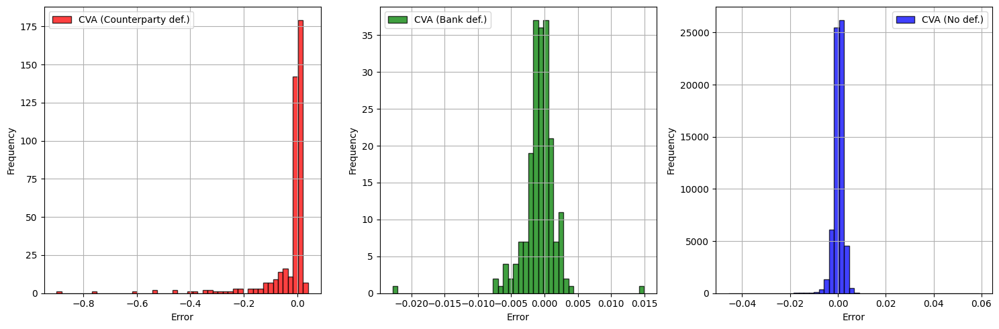

In [ ]:
# Compute terminal values of CVA
CVA_terminal = CVA[np.arange(len(tau_min)), tau_min]  # Shape: (4096,)


# Separate terminal errors by event type
errors_no_def = CVA_terminal[no_def_index]
errors_bank_def = CVA_terminal[bank_def_index]
errors_counterparty_def = CVA_terminal[counterparty_def_index] - LGD * pos_exposure_at_default_2

print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('MSE no def.: ', np.mean(errors_no_def**2), 'MSE counterparty def.: ', np.mean(errors_counterparty_def**2), 'MSE bank def.: ', np.mean(errors_bank_def**2))


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), tight_layout=True)

# Subplot 1
axes[0].hist(errors_counterparty_def, bins=50, alpha=0.75, color='red', edgecolor='black', label='CVA (Counterparty def.)')
axes[0].set_xlabel('Error')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True)

# Subplot 2
axes[1].hist(errors_bank_def, bins=50, alpha=0.75, color='green', edgecolor='black', label='CVA (Bank def.)')
axes[1].set_xlabel('Error')
axes[1].set_ylabel('Frequency')
axes[1].legend()
axes[1].grid(True)

# Subplot 3
axes[2].hist(errors_no_def, bins=50, alpha=0.75, color='blue', edgecolor='black', label='CVA (No def.)')
axes[2].set_xlabel('Error')
axes[2].set_ylabel('Frequency')
axes[2].legend()
axes[2].grid(True)

plt.show()

In [ ]:
errors_counterparty_def_pos_closeout0 = errors_counterparty_def_pos_closeout[:]
errors_counterparty_def0 = errors_counterparty_def[:]

CVA0 = CVA[:,:]

No defaul:  0.990478515625 Counterparty defaults:  0.0064697265625 Counterparty defaults (pos closeout):  0.001739501953125 Bank Defaults:  0.0030517578125
MSE no def.:  4.5491843e-06 MSE counterparty def.:  0.006802168 MSE counterparty def. (pos closeout):  0.022401158 MSE bank def.:  8.066415e-06


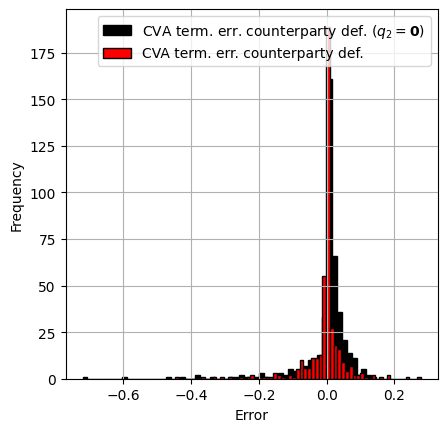

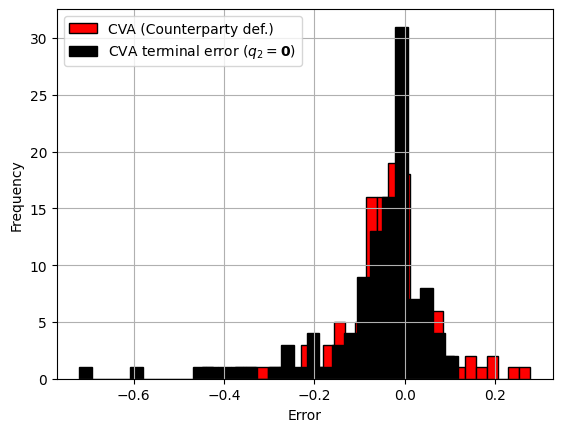

In [ ]:
# Compute terminal values of CVA
CVA_terminal = CVA[np.arange(len(tau_min)), tau_min]  # Shape: (4096,)


# Separate terminal errors by event type
errors_counterparty_def = CVA_terminal[counterparty_def_index] - LGD * pos_exposure_at_default_2
index_pos_closeout = np.argwhere(LGD * pos_exposure_at_default_2 > 0)
errors_counterparty_def_pos_closeout = errors_counterparty_def[index_pos_closeout]

print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval,'Counterparty defaults (pos closeout): ', len(index_pos_closeout)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('MSE no def.: ', np.mean(errors_no_def**2), 'MSE counterparty def.: ', np.mean(errors_counterparty_def**2), 'MSE counterparty def. (pos closeout): ', np.mean(errors_counterparty_def_pos_closeout**2), 'MSE bank def.: ', np.mean(errors_bank_def**2))




plt.figure(figsize=(4.8, 4.8))
plt.hist(errors_counterparty_def, bins=60, alpha=1., color='black', edgecolor='black', label=r'CVA term. err. counterparty def. ($q_2=\mathbf{0}$)')
plt.xlabel('Error')
plt.ylabel('Frequency')

plt.hist(errors_counterparty_def0, bins=65, alpha=1., color='red', edgecolor='black', label='CVA term. err. counterparty def.')
plt.xlabel('Error')
plt.ylabel('Frequency')

plt.legend()
plt.grid(True)

plt.figure()


plt.hist(errors_counterparty_def0[index_pos_closeout], bins=30, alpha=1., color='red', edgecolor='black', label=r'CVA (Counterparty def.)')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.grid(True)

plt.hist(errors_counterparty_def[index_pos_closeout], bins=30, alpha=1., color='black', edgecolor='black', label=r'CVA terminal error ($q_2=\mathbf{0}$)')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.legend()



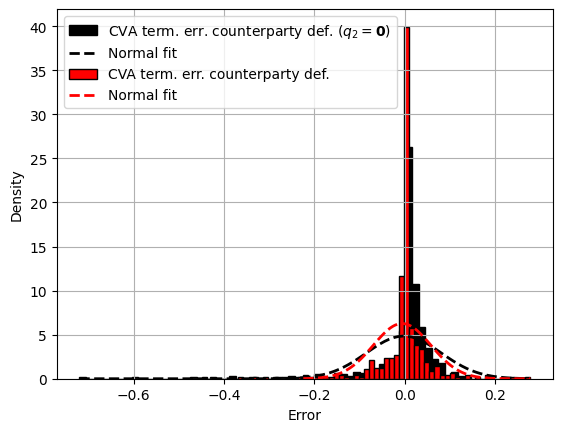

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# Assuming errors_counterparty_def and errors_counterparty_def0 are defined arrays.
# For example:
# errors_counterparty_def = np.random.normal(0, 1, 1000)
# errors_counterparty_def0 = np.random.normal(0.5, 1.5, 1000)

# -------------------------------
# Fit the normal distribution to the first dataset:
mu1, std1 = stats.norm.fit(errors_counterparty_def)
# Create a new figure for plotting
# Plot histogram for the first dataset with density normalization
counts1, bins1, _ = plt.hist(errors_counterparty_def, bins=60, density=True,
                             alpha=1.0, color='black', edgecolor='black',
                             label=r'CVA term. err. counterparty def. ($q_2=\mathbf{0}$)')
# Generate x values spanning the data range
x1 = np.linspace(bins1[0], bins2[-1], 100)
# Compute the normal PDF with the fitted parameters
pdf1 = stats.norm.pdf(x1, mu1, std1)
# Overlay the fitted PDF on the histogram
plt.plot(x1, pdf1, 'k--', linewidth=2,
         label='Normal fit')

# -------------------------------
# Fit the normal distribution to the second dataset:
mu2, std2 = stats.norm.fit(errors_counterparty_def0)
# Plot histogram for the second dataset on the same figure
counts2, bins2, _ = plt.hist(errors_counterparty_def0, bins=65, density=True,
                             alpha=1.0, color='red', edgecolor='black',
                             label='CVA term. err. counterparty def.')
# Generate x values for the second dataset
x2 = np.linspace(bins2[20], bins2[-1], 100)
# Compute its normal PDF
pdf2 = stats.norm.pdf(x2, mu2, std2)
# Overlay the fitted PDF
plt.plot(x2, pdf2, 'r--', linewidth=2,
         label='Normal fit')

# Label the axes, add a legend and grid, then display the plot
plt.xlabel('Error')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()


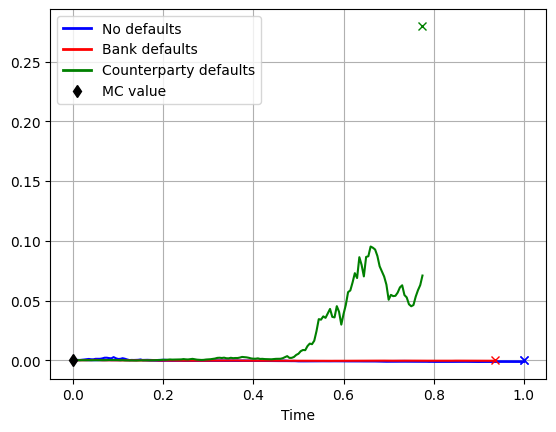

In [ ]:
# Plot settings
plt.figure()
n3 = np.random.randint(0, len(counterparty_def_index) - 2)
n3 = 201
# Plotting 'No defaults' trajectories
n1 = np.random.randint(0, len(no_def_index) - 2)
#n1 = 9521-2
n1 = counterparty_def_index[n3]+1
for w in range(n1, n1 + 2):
    plt.plot(
       # t[:tau_min[no_def_index[w]] + 1],
       # CVA[no_def_index[w], :no_def_index[w] + 1],
        t,
        CVA[w, :],
        color='blue'
    )
    plt.plot(
        t[tau_min[no_def_index[w]]],
        #exposure_at_default_0[w],
        0*LGD*pos_exposure_at_default_0[w],
        'x',
        color='blue'
    )

# Plotting 'Bank defaults' trajectories
if len(bank_def_index) > 2:
  n2 = np.random.randint(0, len(bank_def_index) - 3)
  for w in range(n2, n2 + 1):
      plt.plot(
          t[:tau_min[bank_def_index[w]] + 1],
          CVA[bank_def_index[w], :tau_min[bank_def_index[w]] + 1],
          color='red'
      )
      plt.plot(
          t[tau_min[bank_def_index[w]]],
          #exposure_at_default_1[w],
          0*LGD*pos_exposure_at_default_1[w],
          'x',
          color='red'
      )

# Plotting 'CounterpartyCnk defaults' trajectories
if len(counterparty_def_index) - 3 > 0:
  #n3 = np.random.randint(0, len(counterparty_def_index) - 2)
  #n3 = 506
  for w in range(n3, n3 + 1):
      plt.plot(
          t[:tau_min[counterparty_def_index[w]] + 1],
          CVA[counterparty_def_index[w], :tau_min[counterparty_def_index[w]] + 1],
          color='green'
      )
      plt.plot(
          t[tau_min[counterparty_def_index[w]]],
          #exposure_at_default_2[w],
          LGD*pos_exposure_at_default_2[w],
          'x',
          color='green'
      )

# Plot MC_value once
plt.plot(0, MC_CVA_0, 'kd')

# Add labels and grid
plt.xlabel('Time')
plt.grid(True)

# Custom legend entries
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, label='No defaults'),
    Line2D([0], [0], color='red', lw=2, label='Bank defaults'),
    Line2D([0], [0], color='green', lw=2, label='Counterparty defaults'),
    Line2D([0], [0], marker='d', color='k', linestyle='None', label='MC value'),
]

plt.legend(handles=legend_elements)

# Display the plot
plt.show()

In [ ]:
np.argwhere(tau_min[counterparty_def_index[190]]==132)

w_1 = counterparty_def_index[190]

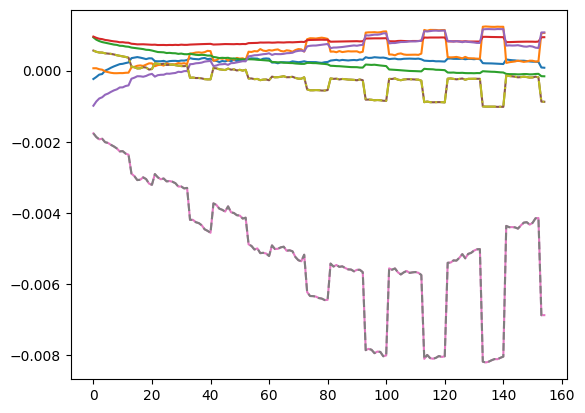

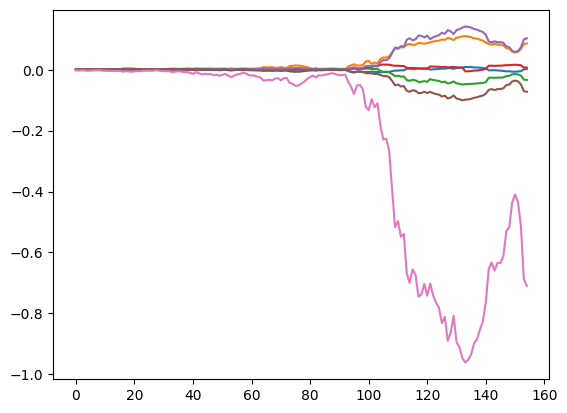

In [ ]:
plt.figure()
plt.plot(np.mean(CVAx[:,:,:tau_w],0).T)
plt.plot(np.mean(CVAx[:,-1,:tau_w],0),'--')
plt.plot(np.mean(CVAx[:,-2,:tau_w],0),'-.')


plt.figure()
plt.plot(CVAx[w_0,:,:tau_w].T)



In [ ]:
X[w_0,-1,tau_min[w_0]]

0.44103742

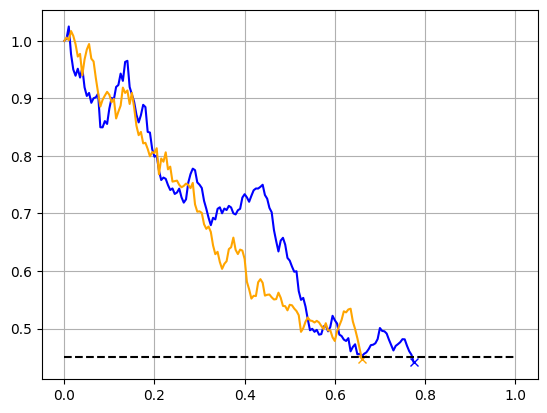

In [ ]:
plt.plot(t[:tau_min[w_0]+1], X[w_0,-1,:tau_min[w_0]+1], color = 'blue')
plt.plot(t[tau_min[w_0]], X[w_0,-1,tau_min[w_0]], 'bx')

plt.plot(t[:tau_min[w_1]+1], X[w_1,-1,:tau_min[w_1]+1], color = 'orange')
plt.plot(t[tau_min[w_1]], X[w_1,-1,tau_min[w_1]], 'x', color = 'orange')
plt.grid()
plt.plot(t,B2*np.ones(len(t)), 'k--')

# FVA - Neural Network Class


In [ ]:
############## Define Neural Network Classes ##############
class SubNetwork(tf.keras.Model):   # 3 call methods, "call" for Vx, "second_call" for Vxx, "y0_call" for y0 used in deep DP
    def __init__(self, dim_x, dim_w, portfolio_pars, neurons, activation, use_batnorm = False, regu_cons=[0., 0.], ini_cons=None ):
        super(SubNetwork, self).__init__()
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.m = dim_w
        self.neurons = neurons
        self.activation = activation
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.use_batnorm = use_batnorm
        self.regu_1 = tf.keras.regularizers.L2( l2=regu_cons[0] )   # should same as self.regu_1 = None
        self.regu_2 = tf.keras.regularizers.L2( l2=regu_cons[1] )
        if ini_cons == None:
          self.ini_1 = "glorot_uniform"
          self.ini_2 = "zeros"
        else:
          self.ini_1 = tf.keras.initializers.Constant(value=ini_cons[0])
          self.ini_2 = tf.keras.initializers.Constant(value=ini_cons[1])
        self.dense_layers1 = []       # 12 are for each call method below
        self.dense_layers2 = []
        self.batch_norm1 = []
        self.batch_norm2 = []
        for i in range(len(self.neurons)):
            self.dense_layers1.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.dense_layers2.append( tf.keras.layers.Dense(self.neurons[i], activation=self.activation, use_bias=True, \
                    kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2) )
            self.batch_norm1.append( tf.keras.layers.BatchNormalization() )
            self.batch_norm2.append( tf.keras.layers.BatchNormalization() )
        self.dense_out = tf.keras.layers.Dense(self.d_defaultable, activation='linear', use_bias=True, \
                            kernel_regularizer=self.regu_1, bias_regularizer=self.regu_2, kernel_initializer=self.ini_1, bias_initializer=self.ini_2)

    def call(self, x_in):         # get z.
        x = x_in
        #x = tf.squeeze(x_in, axis=-1)     # x_in.shape =[B,d]
        for i in range(len(self.neurons)):
            x = self.dense_layers1[i](x)
            if self.use_batnorm:
              x = self.batch_norm1[i](x)
        x = self.dense_out(x)
        return x    # output shape = [B,P_Z]

class FullNetwork_FVA(tf.keras.Model):
    def __init__(self, N, h, dim_x, dim_w, portfolio_pars, neurons=[16,16,16], activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None):
        super(FullNetwork_FVA, self).__init__()
        self.N = N    # number of subNN
        self.h = h    # step size
        self.dim_x = dim_x
        self.dim_w = dim_w
        self.d_defaultable = dim_x
        self.d = dim_x - 2
        self.portfolio_parameters = portfolio_pars
        self.P_Y = portfolio_pars[0]
        self.P_Z = portfolio_pars[1]
        self.ind_X = portfolio_pars[2]
        self.ind_Z = portfolio_pars[3]
        self.d_p = portfolio_pars[4]
        self.K_p = portfolio_pars[5]
        self.neurons = neurons
        self.activation = activation
        self.use_batnorm = use_batnorm
        self.regu_cons = regu_cons
        self.ini_cons = ini_cons
        self.network = SubNetwork(dim_x=self.dim_x, dim_w=self.dim_w, portfolio_pars = self.portfolio_parameters, neurons=self.neurons, activation=self.activation, \
                                           use_batnorm=self.use_batnorm, regu_cons=self.regu_cons, ini_cons=self.ini_cons)
        self.FVA_0 = self.add_weight(name="FVA_0", shape=[1], initializer=tf.keras.initializers.RandomUniform(minval=0.0, maxval=0.1), trainable=True)
        self.LGD = 0.3


    def call(self, x_input):    # input shape x=[B,d,1]
        # Initializations #
        NNx = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNx_reduced = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NN_FVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_FVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NNy = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNy_sum = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)

        NN_IM = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NN_ColVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_ColVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NN_MVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_MVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
        NN_CVA = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
        NNvx_CVA = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)

        if measures > 1:
          NNx2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NN_FVA2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NNvx_FVA2 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)

          NN_ColVA2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NNvx_ColVA2 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
          NN_MVA2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NNvx_MVA2 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)
          NN_CVA2 = tf.TensorArray(dtype=tf.float32, size=self.N + 1, dynamic_size=False, clear_after_read=False)
          NNvx_CVA2 = tf.TensorArray(dtype=tf.float32, size=self.N, dynamic_size=False, clear_after_read=False)


        ####################

        # Initialize tau #
        tau = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        if measures > 1:
          tau2 = tf.fill([batch_size, 2], tf.cast(self.N + 1, tf.int32))
        ##################

        # Update X_0 #
        NNx = NNx.write(0, x_input)
        if measures > 1:
          NNx2 = NNx2.write(0, x_input)
        NNx_reduced = NNx_reduced.write(0, NNx.read(0)[:,:d])
        ##############

        # Update XVA_0 #
        NN_FVA = NN_FVA.write(0, tf.broadcast_to(self.FVA_0, [batch_size]))  # Broadcasting y_0

        NN_ColVA = NN_ColVA.write(0, tf.broadcast_to(ColVA_model.ColVA_0, [batch_size]))  # Broadcasting y_0
        NN_MVA = NN_MVA.write(0, tf.broadcast_to(MVA_model.MVA_0, [batch_size]))  # Broadcasting y_0
        NN_CVA = NN_CVA.write(0, tf.broadcast_to(CVA_model.CVA_0, [batch_size]))
        if measures > 1:
          NN_FVA2 = NN_FVA2.write(0, tf.broadcast_to(self.FVA_0, [batch_size]))  # Broadcasting y_0

          NN_ColVA2 = NN_ColVA2.write(0, tf.broadcast_to(ColVA_model.ColVA_0, [batch_size]))  # Broadcasting y_0
          NN_MVA2 = NN_MVA2.write(0, tf.broadcast_to(MVA_model.MVA_0, [batch_size]))  # Broadcasting y_0
          NN_CVA2 = NN_CVA2.write(0, tf.broadcast_to(CVA_model.CVA_0, [batch_size]))
        ################

        # Update Y_0 #
        NNy = NNy.write(0, tf.broadcast_to(full_model_2.y_0, [batch_size, P_Y]))
        NNy_sum = NNy_sum.write(0, tf.reduce_sum(NNy.read(0), axis=1))  # Sum over P_Y components
        ##############

        # Update IM_0 #
        q_99 = tf.cast(q_alpha_high_0, dtype=tf.float32)
        q_01 = tf.cast(q_alpha_low_0, dtype=tf.float32)
        NN_IM_0 = tf.stack([tf.fill([batch_size], q_99), tf.fill([batch_size], q_01)], axis=1)
        NN_IM = NN_IM.write(0, NN_IM_0)
        ###############
        for n in range(0, self.N):
          NNdW = tf.random.normal( shape = [batch_size,self.dim_w], mean=0, stddev=np.sqrt(self.h))
          NNdW_reduced = NNdW[:,:d]
          time_tensor = tf.fill([batch_size, 1], tf.cast(n * self.h, dtype=tf.float32))

          # Update Z_ColVA_n #
          inp_ColVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          NNvx_ColVA = NNvx_ColVA.write(n, ColVA_model.network( inp_ColVA ))
          if measures > 1:
            inp_ColVA2 = tf.concat([NNx2.read(n), time_tensor], axis=1)
            NNvx_ColVA2 = NNvx_ColVA2.write(n, ColVA_model.network( inp_ColVA2 ))

          # Update ColVA_{n+1} #
          ColVA_np1 = model_3.F_ColVA(NNx.read(n), NNy_sum.read(n), NN_ColVA.read(n), NNvx_ColVA.read(n), NNdW)
          NN_ColVA = NN_ColVA.write(n+1,ColVA_np1)
          if measures > 1:
            ColVA_np1_2 = (
              model_3.F_ColVA(NNx2.read(n), NNy_sum.read(n), NN_ColVA2.read(n), NNvx_ColVA2.read(n), NNdW)
              - self.h * b1 * NNvx_ColVA2.read(n)[:, -2]
            )
            NN_ColVA2 = NN_ColVA2.write(n+1,ColVA_np1_2)


          # Update Z_MVA_n #
          inp_MVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          NNvx_MVA = NNvx_MVA.write(n, MVA_model.network( inp_MVA ))
          if measures > 1:
            inp_MVA2 = tf.concat([NNx2.read(n), time_tensor], axis=1)
            NNvx_MVA2 = NNvx_MVA2.write(n, MVA_model.network( inp_MVA2 ))
          ##################

          # Update MVA_{n+1} #
          MVA_np1 = model_3.F_MVA(NNx.read(n), NN_MVA.read(n), NNvx_MVA.read(n), NN_IM.read(n), NNdW)
          NN_MVA = NN_MVA.write(n+1,MVA_np1)
          if measures > 1:
            MVA_np1_2 = (
              model_3.F_MVA(NNx2.read(n), NN_MVA2.read(n), NNvx_MVA2.read(n), NN_IM.read(n), NNdW)
              - self.h * b1 * NNvx_MVA2.read(n)[:, -2]
            )
            NN_MVA2 = NN_MVA2.write(n+1,MVA_np1_2)
          ####################

          # Update Z_CVA_n #
          #inp_CVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          exposure_n = (1 - alpha) * NNy_sum.read(n) - NN_IM.read(n)[:,0]
          pos_exp_n = tf.maximum(exposure_n, 0)
          target_n = self.LGD * pos_exp_n
          inp_CVA = tf.concat([NNx.read(n), tf.expand_dims(exposure_n , axis=1), time_tensor], axis=1)
          NNvx_CVA = NNvx_CVA.write(n, CVA_model.network( inp_CVA ))
          if measures > 1:
            inp_CVA2 = tf.concat([NNx2.read(n), tf.expand_dims(exposure_n , axis=1), time_tensor], axis=1)
            NNvx_CVA2 = NNvx_CVA2.write(n, CVA_model.network( inp_CVA2 ))
          ##################

          # Update CVA_{n+1} #
          CVA_np1 = model_3.F_CVA(NNx.read(n), NN_CVA.read(n), NNvx_CVA.read(n), NNdW)
          NN_CVA = NN_CVA.write(n+1,CVA_np1)
          if measures > 1:
            CVA2_np1 = model_3.F_CVA(NNx2.read(n), NN_CVA2.read(n), NNvx_CVA2.read(n), NNdW) - self.h * b2 * NNvx_CVA2.read(n)[:, -1]
            NN_CVA2 = NN_CVA2.write(n+1,CVA2_np1)
          ####################

          # Update Z_FVA_n #
          inp_FVA = tf.concat([NNx.read(n), time_tensor], axis=1)
          NNvx_FVA = NNvx_FVA.write(n, self.network( inp_FVA ))
          if measures > 1:
            inp_FVA2 = tf.concat([NNx2.read(n), time_tensor], axis=1)
            NNvx_FVA2 = NNvx_FVA2.write(n, self.network( inp_FVA2 ))
          ##################


          # Update FVA_{n+1} #  F_FVA(self, x, v, im, xva, fva, fva_vx, dW):
          XVA = tf.stack([NN_ColVA.read(n), NN_MVA.read(n), NN_CVA.read(n)], axis = 1)
          FVA_np1 = model_3.F_FVA(NNx.read(n), NNy_sum.read(n), NN_IM.read(n), XVA, NN_FVA.read(n), NNvx_FVA.read(n), NNdW)
          NN_FVA = NN_FVA.write(n+1,FVA_np1)
          if measures > 1:
            XVA2 = tf.stack([NN_ColVA2.read(n), NN_MVA2.read(n), NN_CVA2.read(n)], axis = 1)
            FVA_np1_2 = (
              model_3.F_FVA(NNx2.read(n), NNy_sum.read(n), NN_IM.read(n), XVA2, NN_FVA2.read(n), NNvx_FVA2.read(n), NNdW)
              - self.h * b1 * NNvx_FVA2.read(n)[:, -2]
            )
            NN_FVA2 = NN_FVA2.write(n+1,FVA_np1_2)
          ####################

          # Update Y_{n+1} #
          inp_y = tf.concat([NNx_reduced.read(n), time_tensor], axis=1)
          NNvx = NNvx.write(n, full_model_2.network( inp_y ))
          NNy_temp = []
          for p in range(0,self.P_Y):
            if n < N_p[p]:
              NNy_p = model_2.F_Y(NNx_reduced.read(n), NNy.read(n)[:,p], NNvx.read(n), NNdW_reduced, self.ind_X[p], self.ind_Z[p], self.d_p[p])
            else:
              NNy_p = tf.zeros(batch_size)
            NNy_temp.append(NNy_p)
          NNy = NNy.write(n + 1,tf.stack(NNy_temp, axis=1))
          NNy_sum = NNy_sum.write(n+1, tf.reduce_sum(NNy.read(n+1), axis=1))  # Sum over P_Y components
          ##################

          # Update dW_n and X_{n+1} #
          NNx = NNx.write(n + 1, model_3.F_X_EM(NNx.read(n), NNdW))
          if measures > 1:
            CM2 = tf.constant([0, 0, 0, 0, 0, -self.h * b1, 0], dtype=tf.float32)
            CM2 = tf.tile(tf.expand_dims(CM2, axis=0), [batch_size, 1])  # Shape: (batch_size, dim_x)
            NNx2_temp = model_3.F_X_EM(NNx2.read(n), NNdW) + CM2
            NNx2 = NNx2.write(n + 1, NNx2_temp)
          ###########################
          NNx_reduced =  NNx_reduced.write(n + 1, NNx.read(n+1)[:,:d])
          ###########################

          # Update IM_{n+1} #
          if n < self.N - 1:
            inp_IM = tf.concat([NNx_reduced.read(n+1), NNy.read(n+1), tf.expand_dims(NNy_sum.read(n+1), axis=1)], axis=1)
            q_model_output = loaded_q_models[n+1](inp_IM)
            q_0 = tf.maximum(q_model_output[:, 0], 0)
            q_1 = tf.minimum(q_model_output[:, 1], 0)
            NN_IM = NN_IM.write(n+1, tf.stack([q_0, q_1], axis=1))
          ##################

          # Updating tau #
          # Condition for tau1 and tau2
          condition_1 = tf.less(NNx.read(n + 1)[:, -2], B1)  # Access second-to-last column
          condition_2 = tf.less(NNx.read(n + 1)[:, -1], B2)  # Access last column
          # Update tau[:, 0] for the first time step where condition_1 is True
          tau_cond_1 = tf.where(tf.logical_and(condition_1, tf.equal(tau[:, 0], self.N + 1)), n + 1, tau[:, 0])
          # Update tau[:, 1] for the first time step where condition_2 is True
          tau_cond_2 = tf.where(tf.logical_and(condition_2, tf.equal(tau[:, 1], self.N + 1)), n + 1, tau[:, 1])
          # Update tau with new values
          tau = tf.stack([tau_cond_1, tau_cond_2], axis=1)

          if measures > 1:
            condition_1_2 = tf.less(NNx2.read(n + 1)[:, -2], B1)
            condition_2_2 = tf.less(NNx2.read(n + 1)[:, -1], B2)
            tau_cond_1_2 = tf.where(tf.logical_and(condition_1_2, tf.equal(tau2[:, 0], self.N + 1)), n + 1, tau2[:, 0])
            tau_cond_2_2 = tf.where(tf.logical_and(condition_2_2, tf.equal(tau2[:, 1], self.N + 1)), n + 1, tau2[:, 1])
            tau2 = tf.stack([tau_cond_1_2, tau_cond_2_2], axis=1)
          ################

        # After the loop, compute tau_min for each sample
        tau_combined = tf.stack([
        tf.fill([batch_size], self.N),  # Ensure self.N is included
        tau[:, 0],
        tau[:, 1]
        ], axis=1)  # Shape: [batch_size, 3]

        if measures > 1:
          tau_combined2 = tf.stack([
          tf.fill([batch_size], self.N),  # Ensure self.N is included
          tau2[:, 0],
          tau2[:, 1]
          ], axis=1)


        # Compute the minimum stopping time per sample
        tau_min = tf.reduce_min(tau_combined, axis=1)  # Shape: [batch_size]

        # Convert to int32
        tau_min_int = tf.cast(tau_min, tf.int32)  # Convert to int32

        # Stack NN_MVA and transpose to shape [batch_size, N+1]
        NN_FVA_stacked = NN_FVA.stack()  # Shape: [N+1, batch_size]
        NN_FVA_stacked = tf.transpose(NN_FVA_stacked, perm=[1, 0])  # Shape: [batch_size, N+1]

        # Create indices for tf.gather_nd
        batch_indices = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
        gather_indices = tf.stack([batch_indices, tau_min_int], axis=1)  # Shape: [batch_size, 2]

        # Gather NN_MVA at tau_min for each sample
        NN_FVA_at_tau_min = tf.gather_nd(NN_FVA_stacked, gather_indices)  # Shape: [batch_size]

        if measures > 1:
          tau_min2 = tf.reduce_min(tau_combined2, axis=1)  # Shape: [batch_size]
          tau_min_int2 = tf.cast(tau_min2, tf.int32)  # Convert to int32
          NN_FVA_stacked2 = NN_FVA2.stack()
          NN_FVA_stacked2 = tf.transpose(NN_FVA_stacked2, perm=[1, 0])
          batch_indices2 = tf.range(batch_size, dtype=tf.int32)  # Shape: [batch_size]
          gather_indices2 = tf.stack([batch_indices2, tau_min_int2], axis=1)
          NN_FVA_at_tau_min2 = tf.gather_nd(NN_FVA_stacked2, gather_indices2)  # Shape: [batch_size]

        else:
          NN_FVA_at_tau_min2 = tf.constant(0., dtype=tf.float32)

        # Compute the loss
        loss_final = tf.stack([
            tf.reduce_mean(NN_FVA_at_tau_min ** 2),
            tf.reduce_mean(NN_FVA_at_tau_min2 ** 2),
        ])

        return NN_FVA.read(0)[0], loss_final


# FVA - Train Neural Network


Start of epoch 0


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network_5', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Training total loss at step 0: 0.09023135
Individual loss components:  [0.02744902 0.06278233]
Seen so far: 2048 samples
The current learning rate is 0.0049980474
FVA_0 (approx.):  0.0922988 FVA_0 (ref.):  -0.06696049
Time elapsed 1428.9333238601685

Start of epoch 1
Training total loss at step 0: 0.00002412
Individual loss components:  [1.2093078e-05 1.2028939e-05]
Seen so far: 2048 samples
The current learning rate is 0.0040920554
FVA_0 (approx.):  -0.038983844 FVA_0 (ref.):  -0.06696049
Time elapsed 498.9468002319336

Start of epoch 2
Training total loss at step 0: 0.00001613
Individual loss components:  [7.5920766e-06 8.5329766e-06]
Seen so far: 2048 samples
The current learning rate is 0.0033502914
FVA_0 (approx.):  -0.039016157 FVA_0 (ref.):  -0.06696049
Time elapsed 497.21431708335876

Start of epoch 3
Training total loss at step 0: 0.00001065
Individual loss components:  [4.1119670e-06 6.5374775e-06]
Seen so far: 2048 samples
The current learning rate is 0.0027429867
FVA_0 (app

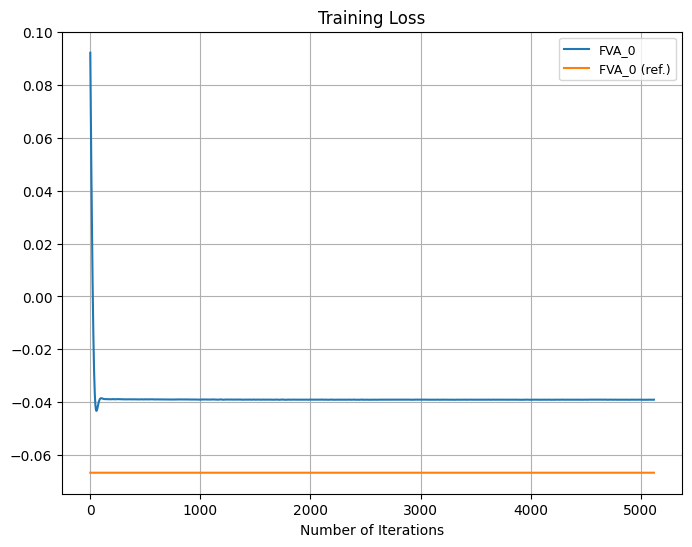

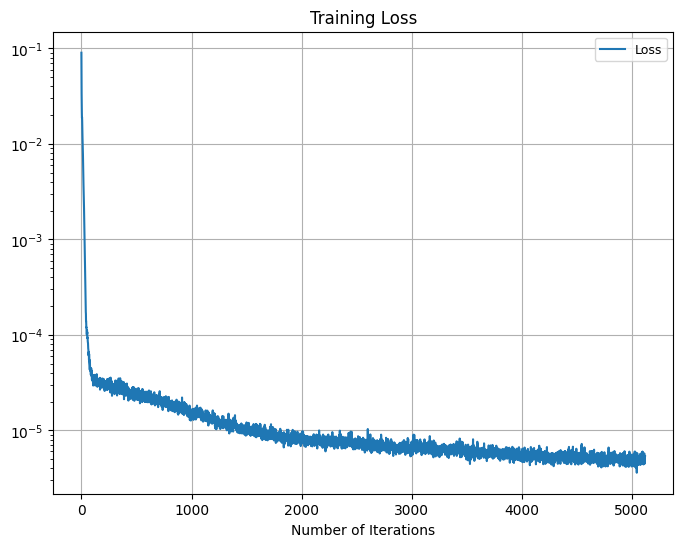

In [ ]:
# NN params
num_epochs = 10
batch_size = 2**11 #2**12
initial_lr = 0.005
neurons = [50,50,50,50]
M_train = 2**20  # Number training of samples
###########

sigma_defaultable = tf.constant([0.2, 0.25, 0.25, 0.25, 0.3, 0.2, 0.3], dtype=tf.float32)
corr_matrix_defaultable = tf.constant([
    [1.0, 0.9, 0.2, 0.5, 0.1, 0.1, 0.2],
    [0.9, 1.0, 0.4, 0.3, 0.2, 0.3, 0.2],
    [0.2, 0.4, 1.0, 0.2, 0.75, 0.15, 0.25],
    [0.5, 0.3, 0.2, 1.0, 0.35, 0.05, 0.15],
    [0.1, 0.2, 0.75, 0.35, 1.0, 0.15, 0.05],
    [0.1, 0.3, 0.15, 0.05, 0.15, 1.0, 0.25],
    [0.2, 0.2, 0.25, 0.15, 0.05, 0.25, 1.0]
], dtype=tf.float32)
L_defaultable = np.linalg.cholesky(corr_matrix_defaultable)


# Prepare the training dataset
LGD = .3
alpha = 0.5 # C = alpha*V
#B1 = 0.625
#B2 = 0.75
measures = 2
b1 = 0.35
b2 = 0.  #0.25
B1 = 0.575
B2 = 0.675
d_defaultable = d + 2
x0 = np.ones([M_train,d_defaultable])
x0_tf = tf.convert_to_tensor(x0, dtype=tf.float32)
x_train = x0_tf    # shape = [M_train, dim_x, 1]
y_train = tf.zeros( [M_train, 1] )
train_dataset = tf.data.Dataset.from_tensor_slices( (x_train, y_train) )
#train_dataset = train_dataset.shuffle(buffer_size=batch_size*10).batch(batch_size)  # buffer_size doesn't matter in this code
train_dataset = train_dataset.batch(batch_size)

model_parameters_3 = ['GBM', h, d_defaultable, r, sigma_defaultable, L_defaultable]
model_3 = ModelClass(model_parameters_3)
portfolio_parameters_tf = [P_Y, P_Z, ind_X, ind_Z, d_p, K_p]
FVA_model = FullNetwork_FVA(N=N, h=h, dim_x=d_defaultable, dim_w=d_defaultable, portfolio_pars = portfolio_parameters_tf, \
            neurons=neurons, activation='relu', use_batnorm=False, regu_cons=[0.,0.], ini_cons=None)


FVA_0_history = []
loss_history = []
lr_history = []
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_lr, decay_steps=int(M_train/batch_size), decay_rate=tf.math.exp(-0.2), staircase=False)
optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
#optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule)

# customize loss function
def dummy_loss(y_true, y_model):
    return y_model  # Return the full list of losses


@tf.function
def train_step(input_x, input_y):
    with tf.GradientTape() as tape:
        # Unpack the outputs from the model
        NN_FVA_0, loss_components = FVA_model(input_x, training=True)
        total_loss = tf.reduce_sum(loss_components)
    # Compute gradients
    grads = tape.gradient(total_loss, FVA_model.trainable_weights)
    # Apply gradients to update the model weights
    optimizer.apply_gradients(zip(grads, FVA_model.trainable_weights))
    return [NN_FVA_0, total_loss, grads, loss_components]


# customized train loop
start = time.time()
for epoch in range(num_epochs):
    print("\nStart of epoch %d" % (epoch,))
    # Iterate over the batches of the dataset.
    for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
        output_train = train_step(x_batch_train, y_batch_train)
        NN_FVA_0 = output_train[0].numpy()
        total_loss_value = output_train[1].numpy()
        loss_components = output_train[3].numpy()  # Get individual loss components

        FVA_0_history.append(NN_FVA_0)
        loss_history.append(total_loss_value)
        lr_history.append(lr_schedule(optimizer.iterations).numpy())

        if step == 0:
            print("Training total loss at step %d: %.8f" % (step, float(total_loss_value)))
            print("Individual loss components: ", loss_components)
            print("Seen so far: %s samples" % ((step + 1) * batch_size))
            print("The current learning rate is", lr_schedule(optimizer.iterations).numpy())
            print('FVA_0 (approx.): ', NN_FVA_0, 'FVA_0 (ref.): ', -0.039208677)
            end = time.time()
            print('Time elapsed', end - start)
            start = time.time()




######################### print loss and save loss history and learning rate history
plt.figure(figsize=(8, 6))
plt.plot(FVA_0_history, label='FVA_0')
plt.plot(np.ones(len(FVA_0_history))*(-0.039208677), label='FVA_0 (ref.)')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.grid()
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(loss_history, label='Loss')
plt.title('Training Loss')
plt.xlabel('Number of Iterations')
plt.legend(fontsize=9)
plt.yscale('log')
plt.grid()
plt.show()

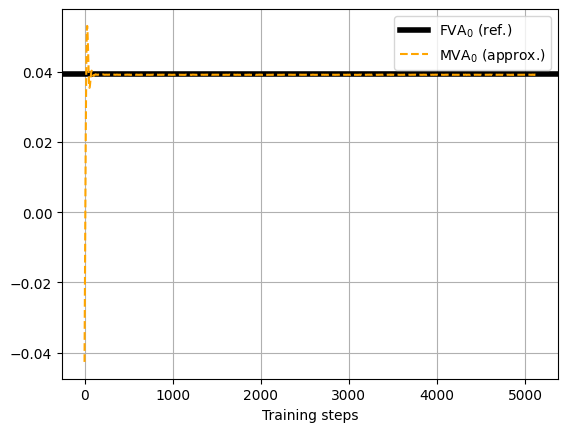

In [ ]:
plt.axhline(-FVA_0, color='black', linewidth=4, label='FVA$_0$ (ref.)')
plt.plot(-1*np.array(FVA_0_history),   '--', color='orange', label=r'MVA$_0$ (approx.)')

plt.grid()
plt.legend()
plt.xlabel('Training steps')
plt.show()

# FVA - Evaluation

In [ ]:
# Initialize parameters
push_bank_def = False
LGD = 0.3
np.random.seed(0)
M_eval = 2**16
X = np.zeros([N+1, M_eval, d_defaultable], dtype=np.float32)
X[0] = np.ones([M_eval, d_defaultable], dtype=np.float32)
X_reduced = np.zeros([N+1, M_eval, d], dtype=np.float32)
X_reduced[0] = X[0][:,:d]

NN_Y = np.zeros([N+1, M_eval, P_Y], dtype=np.float32)
NN_Y[0] = np.tile(full_model_2.y_0.numpy(), (M_eval, 1))

Y = np.zeros([N+1, M_eval], dtype=np.float32)
Y[0] = np.sum(NN_Y[0], axis=1)

NN_Vx = np.zeros([N, M_eval, P_Z], dtype=np.float32)

ColVA = np.zeros([M_eval, N+1], dtype=np.float32)
ColVA[:, 0] = ColVA_model.ColVA_0.numpy()
ColVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)
inp_ColVA = np.concatenate([X[0], np.zeros([M_eval, 1], dtype=np.float32)], axis=1)
ColVAx[:, :, 0] = ColVA_model.network(inp_ColVA)

MVA = np.zeros([M_eval, N+1], dtype=np.float32)
MVA[:, 0] = MVA_model.MVA_0.numpy()
MVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)
inp_MVA = np.concatenate([X[0], np.zeros([M_eval, 1], dtype=np.float32)], axis=1)
MVAx[:, :, 0] = MVA_model.network(inp_MVA)

CVA = np.zeros([M_eval, N+1], dtype=np.float32)
CVA[:, 0] = CVA_model.CVA_0.numpy()
CVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)
exposure_0 = (1 - alpha) * Y[0, :] - q_alpha_pred[:, 0, 0]
pos_exposure_0 = np.maximum(exposure_0, 0)
target_0 = LGD * pos_exposure_0
inp_CVA = np.concatenate([X[0], np.expand_dims(exposure_0, axis=1), np.full([M_eval, 1], 0 * h, dtype=np.float32)], axis=1)
CVAx[:, :, 0] = CVA_model.network(inp_CVA)

FVA = np.zeros([M_eval, N+1], dtype=np.float32)
FVA[:, 0] = FVA_model.FVA_0.numpy()
FVAx = np.zeros([M_eval, d_defaultable, N], dtype=np.float32)
inp_FVA = np.concatenate([X[0], np.zeros([M_eval, 1], dtype=np.float32)], axis=1)
FVAx[:, :, 0] = FVA_model.network(inp_FVA)

q_alpha_pred = np.zeros([M_eval, 2, N], dtype=np.float32)
q_alpha_pred[:, 0, 0] = q_alpha_high_0
q_alpha_pred[:, 1, 0] = q_alpha_low_0

tau = np.full((M_eval, 2), N + 1, dtype=int)  # Shape: [M_eval, 2]

active_n = np.ones(M_eval, dtype=float)
# Main loop
for n in range(N):
    dW = np.random.normal(size=(M_eval, d_defaultable)) * np.sqrt(h)
    dW_reduced = dW[:,:d]

    # Update q #
    if n < N-1:
      inp_q = np.concatenate([X_reduced[n], NN_Y[n], Y[n][:, np.newaxis]], axis=1)
      q_output = loaded_q_models[n+1](inp_q)
      q_alpha_pred[:, 0, n+1] = np.maximum(q_output[:, 0], 0)
      q_alpha_pred[:, 1, n+1] = np.minimum(q_output[:, 1], 0)

    # Update ColVAx
    inp_ColVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    ColVAx[:, :, n] = ColVA_model.network(inp_ColVA)

    # Update MVAx
    inp_MVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    MVAx[:, :, n] = MVA_model.network(inp_MVA)

    # Update CVAx_n
    #inp_CVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    exposure_n = (1 - alpha) * Y[n, :] - q_alpha_pred[:, 0, n]
    pos_exposure_n = np.maximum(exposure_n, 0)
    target_n = LGD * pos_exposure_n
    inp_CVA = np.concatenate([X[n], np.expand_dims(exposure_n, axis=1), np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    #inp_CVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    CVAx[:, :, n] = CVA_model.network(inp_CVA, training = False)

    # Update FVAvx_n
    inp_FVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    FVAx[:, :, n] = FVA_model.network(inp_FVA)

    # Compute ColVA[:, n+1]
    #ColVA[:, n] = ColVA[:, n] * active_n # Zero MVA[:, n] where paths have defaulted at time n
    ColVA[:, n+1] = model_3.F_ColVA(X[n], Y[n], ColVA[:, n], ColVAx[:, :, n], dW) #* active_n + ColVA[:, n] * (1 - active_n)
    if push_bank_def:
        ColVA[:, n+1] = ColVA[:, n+1] - b1 * ColVAx[:,-2,n] * h

    # Compute MVA[:, n+1]
    #MVA[:, n] = MVA[:, n] * active_n # Zero MVA[:, n] where paths have defaulted at time n
    MVA[:, n+1] = model_3.F_MVA(X[n], MVA[:, n], MVAx[:, :, n], q_alpha_pred[:, :, n], dW) #* active_n + MVA[:, n] * (1 - active_n)
    if push_bank_def:
        MVA[:, n+1] = MVA[:, n+1] - b1 * MVAx[:,-2,n] * h

    # Compute CVA[:, n+1]
    #CVA[:, n] = CVA[:, n] * active_n # Zero MVA[:, n] where paths have defaulted at time n
    CVA[:, n+1] = model_3.F_CVA(X[n], CVA[:, n], CVAx[:, :, n], dW) #* active_n + CVA[:, n] * (1 - active_n)
    if push_bank_def:
        CVA[:, n+1] = CVA[:, n+1] - b1 * CVAx[:,-2,n] * h

    # Update FVA_{n+1} #  F_FVA(self, x, v, im, xva, fva, fva_vx, dW):
    XVA = tf.stack([ColVA[:,n], MVA[:,n], CVA[:,n]], axis = 1)
    #FVA[:, n] = FVA[:, n] * active_n # Zero MVA[:, n] where paths have defaulted at time n
    FVA[:, n+1] = model_3.F_FVA(X[n], Y[n], q_alpha_pred[:, :, n], XVA, FVA[:, n], FVAx[:, :, n], dW)# * active_n + FVA[:, n] * (1 - active_n)
    if push_bank_def:
        FVA[:, n+1] = FVA[:, n+1] - b1 * FVAx[:,-2,n] * h

    # Update NN_Vx
    inp_y = np.concatenate([X_reduced[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
    NN_Vx[n] = full_model_2.network(inp_y).numpy()
    for p in range(P_Y):
        if n < N_p[p]:
            NN_Y[n+1, :, p] = model_2.F_Y(X_reduced[n], NN_Y[n, :, p], NN_Vx[n], dW_reduced, ind_X[p], ind_Z[p], d_p[p])
    Y[n+1] = np.sum(NN_Y[n+1], axis=1)

    # Update X[n+1]
    X[n+1] = model_3.F_X(X[n], dW)
    if push_bank_def:
        X[n+1] = X[n+1] - np.array([0, 0, 0, 0, 0, b1 * h, 0], dtype=np.float32)
    X_reduced[n+1] = X[n+1][:,:d]
    # Update tau
    condition_1 = X[n+1, :, -2] < B1  # Access second-to-last column
    condition_2 = X[n+1, :, -1] < B2  # Access last column

    tau[:, 0] = np.where(np.logical_and(condition_1, tau[:, 0] == N + 1), n + 1, tau[:, 0])
    tau[:, 1] = np.where(np.logical_and(condition_2, tau[:, 1] == N + 1), n + 1, tau[:, 1])

    # Compute tau_min
    tau_combined = np.vstack([np.full(M_eval, N), tau[:, 0], tau[:, 1]]).T  # Shape: [M_eval, 3]
    tau_min = np.min(tau_combined, axis=1)  # Shape: [M_eval]

    # Create active masks using <= instead of <
    active_n = (n <= tau_min).astype(float)      # Paths active at time n

tau_index = np.argmin(tau_combined,1)
no_def_index = np.where(tau_index == 0)[0]
bank_def_index = np.where(tau_index == 1)[0]
counterparty_def_index = np.where(tau_index == 2)[0]

# Post-processing
X = np.transpose(X, axes=[1, 2, 0])
NN_Y = np.transpose(NN_Y, axes=[1, 2, 0])
NN_Vx = np.transpose(NN_Vx, axes=[1, 2, 0])

for p in range(P_Y):
    NN_Vx[:, N_p[p]:, ind_Z[p]:ind_Z[p]+d_p[p]] = 0

YT = []
Y0 = []
for p in range(P_Y):
    YT_p = model_2.g(X[:, :, N_p[p]], K_p[p], ind_X[p], d_p[p])
    YT.append(YT_p)
    Y0.append(np.exp(-r * T_p[p]) * np.mean(YT_p))

Y = np.sum(NN_Y, axis=1)

In [ ]:
# Assuming you have already computed tau_min as integer indices
tau_min = tau_min.astype(int)  # Shape: [M_eval]
# Compute the term inside the sum


r_fva_lending = 0.065
r_fva_borrowing = 0.075

C = Y * 0.5 # collateral as a fraction of clean value
F_plus =  tf.maximum(Y[:,:-1] - C[:,:-1] - q_alpha_pred[:,1,:] + ColVA[:,:-1] + MVA[:,:-1] - CVA[:,:-1], 0)
F_minus =  tf.minimum(Y[:,:-1] - C[:,:-1] - q_alpha_pred[:,1,:] + ColVA[:,:-1] + MVA[:,:-1] - CVA[:,:-1], 0)



term = np.exp(-r * t[:-1]) * ( (r - r_fva_lending) * F_plus + (r - r_fva_borrowing) * F_minus ) * h  # Shape: [M_eval, N]
# Create the mask based on tau_min
mask = np.arange(N)[np.newaxis, :] < tau_min[:, np.newaxis]  # Shape: [M_eval, N]
# Apply the mask to the term
masked_term = term * mask  # Shape: [M_eval, N]
# Sum over time steps for each path
S = np.sum(masked_term, axis=1)  # Shape: [M_eval]
# Compute MVA_0 as the mean over all paths
FVA_0 = np.mean(S)
FVA_0

-0.039209183

In [ ]:
tau_combined[counterparty_def_index[3]]


array([200, 201, 137])

In [ ]:
np.random.seed(1)
W = 3
w_0 = counterparty_def_index[3]
MPR = 8
alpha = 0.99
M_ref = 2**12
FVA_w = np.zeros([W,N+1])
FVA_w[:,0] = FVA_0

for k in range(1,N):
  print('k: ', k, FVA[w_0,k])
  for w in range(w_0, w_0 + W):
    alive = tf.ones(M_ref)
    q_alpha_pred_ref = np.zeros([M_ref,2,N])
    X_ref = tf.tile(tf.expand_dims(X[w,:,k], axis=0),  [M_ref, 1])
    NN_Y_ref = tf.tile(tf.expand_dims(NN_Y[w,:,k], axis=0),  [M_ref, 1])
    Y_ref = np.zeros([M_ref, N+1], dtype=np.float32)
    Y_ref[:, k] = tf.cast(tf.reduce_sum(NN_Y_ref, axis=1), tf.float32)

    ColVA_w = np.zeros([M_ref, N+1])
    ColVA_w[:, k] = ColVA[w, k]
    MVA_w = np.zeros([M_ref, N+1])
    MVA_w[:, k] = MVA[w, k]
    CVA_w = np.zeros([M_ref, N+1])
    CVA_w[:, k] = CVA[w, k]

    for n in range(k, N):
      dW = tf.cast(np.random.normal(size=(M_ref, d+2)) * np.sqrt(h), tf.float32)

      # defaulted or not #
      alive = alive * tf.cast(X_ref[:, -2] > B1, dtype=tf.float32) * tf.cast(X_ref[:, -1] > B2, dtype=tf.float32)
      ColVA_w[:, n] = ColVA_w[:, n]*alive
      MVA_w[:, n] = MVA_w[:, n]*alive
      CVA_w[:, n] = CVA_w[:, n]*alive
      Y_ref[:, n] = Y_ref[:, n]*alive
      ####################

      # Update IM #
      inp_IM = tf.concat([X_ref[:, :d], NN_Y_ref, tf.expand_dims(Y_ref[:,n], axis=1)], axis=1)
      q_alpha_pred_ref_temp = loaded_q_models[n](inp_IM, training = False)
      q_alpha_pred_ref[:,0,n] = q_alpha_pred_ref_temp[:,0] * alive
      q_alpha_pred_ref[:,1,n] = q_alpha_pred_ref_temp[:,1] * alive
      ##############

      # Update ColVA #
      inp_ColVA = np.concatenate([X_ref, np.full([M_ref, 1], n * h, dtype=np.float32)], axis=1)
      ColVAx_n = ColVA_model.network(inp_ColVA)
      ColVA_w[:, n+1] = model_3.F_ColVA(X_ref, Y_ref[:,n], ColVA_w[:, n], ColVAx_n, dW)  #* active_n + ColVA[:, n] * (1 - active_n)
      ################

      # Update MVA #
      inp_MVA = np.concatenate([X_ref, np.full([M_ref, 1], n * h, dtype=np.float32)], axis=1)
      MVAx = MVA_model.network(inp_MVA)
      MVA_w[:, n+1] = model_3.F_MVA(X_ref, MVA_w[:, n], MVAx, q_alpha_pred_ref[:, :, n], dW)  #* active_n + MVA[:, n] * (1 - active_n)
      ##############

      # Update CVA #
      exposure_n = (1 - alpha) * Y_ref[:,n] - q_alpha_pred_ref[:, 0, n]
      pos_exposure_n = np.maximum(exposure_n, 0)
      target_n = LGD * pos_exposure_n
      inp_CVA = np.concatenate([X_ref, np.expand_dims(exposure_n, axis=1), np.full([M_ref, 1], n * h, dtype=np.float32)], axis=1)
      #inp_CVA = np.concatenate([X[n], np.full([M_eval, 1], n * h, dtype=np.float32)], axis=1)
      CVAx = CVA_model.network(inp_CVA, training = False)
      CVA_w[:, n+1] = model_3.F_CVA(X_ref, CVA_w[:, n], CVAx, dW)  #* active_n + CVA[:, n] * (1 - active_n)
      ##############

      # Update Y
      inp_y = tf.concat([X_ref[:,:d], tf.fill([M_ref, 1], tf.cast( n * h, dtype=tf.float32))], axis=1)
      NN_Vx_ref = tf.cast( full_model_2.network( inp_y ), tf.float32)
      NN_Y_temp_p = []
      for p in range(0, P_Y):
        if n < N_p[p]:
          NN_Y_temp_p.append(model_2.F_Y(X_ref[:,:d], NN_Y_ref[:,p], NN_Vx_ref, dW[:,:d], ind_X[p], ind_Z[p], d_p[p]))
        else:
          NN_Y_temp_p.append(tf.zeros(M_ref))
      NN_Y_ref = tf.stack(NN_Y_temp_p, axis=1)
      Y_ref[:,n+1] = tf.cast(tf.reduce_sum(NN_Y_ref, axis=1), tf.float32)
      ##########

      # Update X #
      X_ref = model_3.F_X(X_ref, dW)
      ############

    C_ref = Y_ref * 0.5 # collateral as a fraction of clean value
    F_plus =  tf.maximum(Y_ref[:,:-1] - C_ref[:,:-1] - q_alpha_pred_ref[:,1,:] + ColVA_w[:,:-1] + MVA_w[:,:-1] - CVA_w[:,:-1], 0)
    F_minus =  tf.minimum(Y_ref[:,:-1] - C_ref[:,:-1] - q_alpha_pred_ref[:,1,:] + ColVA_w[:,:-1] + MVA_w[:,:-1] - CVA_w[:,:-1], 0)
    FVA_w[w-w_0,k] = np.sum(np.mean(np.exp(-r*(t[:-1] - t[k])) * ( (r - r_fva_lending) * F_plus + (r - r_fva_borrowing) * F_minus ) * h, 0) )
    if w == w_0:
      print('k: ', k, 'FVA_k: ', FVA_w[w-w_0,k])
for w in range(w_0, w_0 + W):
  MVA_w[w-w_0,tau_min[w]:] = 0

k:  1 -0.04003909
k:  1 FVA_k:  -0.03994103042001619
k:  2 -0.042652868
k:  2 FVA_k:  -0.042536630856252006
k:  3 -0.04226917
k:  3 FVA_k:  -0.041825058921692214
k:  4 -0.040237643
k:  4 FVA_k:  -0.04008226303178686
k:  5 -0.04109341
k:  5 FVA_k:  -0.04062149259791895
k:  6 -0.043138053
k:  6 FVA_k:  -0.04288979014231509
k:  7 -0.04385743
k:  7 FVA_k:  -0.043381634217529164
k:  8 -0.04274581
k:  8 FVA_k:  -0.042781063236178515
k:  9 -0.04203247
k:  9 FVA_k:  -0.04230402163297094
k:  10 -0.044308174
k:  10 FVA_k:  -0.044171803937073165
k:  11 -0.04554621
k:  11 FVA_k:  -0.04530114013878277
k:  12 -0.046161663
k:  12 FVA_k:  -0.046154580450801896
k:  13 -0.044009387
k:  13 FVA_k:  -0.04387476442943179
k:  14 -0.044855677
k:  14 FVA_k:  -0.044826949142069215
k:  15 -0.042323176
k:  15 FVA_k:  -0.04225918909287276
k:  16 -0.040720247
k:  16 FVA_k:  -0.04081378409192499
k:  17 -0.034067634
k:  17 FVA_k:  -0.03401395587160622
k:  18 -0.034392644
k:  18 FVA_k:  -0.03434814270303599
k:  19 -0.

137
200
200


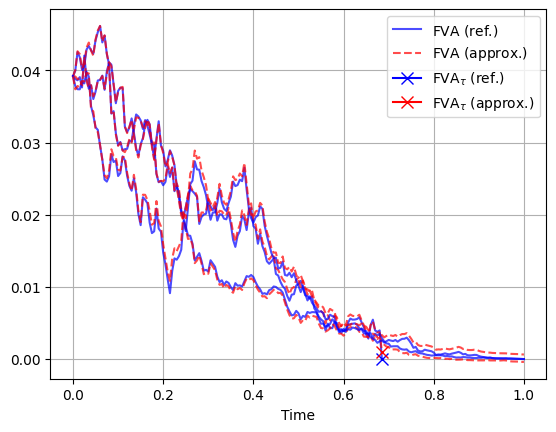

In [ ]:
for i, w in enumerate(range(w_0, w_0+W)):
    tau_w = tau_min[w]
    # Slice up to and including the default time (or final time)
    t_slice = t[:tau_w+1]
    # Reference MVA sample path
    if w < w_0+1:
      fva_slice = FVA[w, :tau_w+1]
    else:
      fva_slice = FVA[w, :tau_w+1]

    # Approximation sample path
    fva_w_slice = FVA_w[w - w_0, :tau_w+1]  # adjust index if needed

    # Plot the reference path
    plt.plot(
        t_slice, -fva_w_slice,
        linestyle='-', alpha=0.7, color='blue',
        label=r'$\text{FVA (ref.)}$' if i == 0 else ""
    )
    # Plot the approximation path
    plt.plot(
        t_slice, -fva_slice,
        linestyle='--', alpha=0.7, color='red',
        label=r'$\text{FVA (approx.)}$' if i == 0 else ""
    )

    # If this path defaults before index 200, put an "x" at the final point
    print(tau_w)
    if tau_w < 200:
        # Blue cross for the reference
        plt.plot(
            t[tau_w], -FVA_w[w-w_0, tau_w],
            marker='x', color='blue', markersize=8,
            label=r'$\text{FVA}_{\tau}$ (ref.)' if i == 0 else ""
        )
        # Red cross for the approximation
        plt.plot(
            t[tau_w], -FVA[w, tau_w],
            marker='x', color='red', markersize=8,
            label=r'$\text{FVA}_{\tau}$ (approx.)' if i == 0 else ""
        )

plt.grid(True)
plt.legend(loc='best')
plt.xlabel('Time')
plt.show()

No defaul:  0.828826904296875 Counterparty defaults:  0.16925048828125 Bank Defaults:  0.001922607421875
MSE no def.:  9.752123e-07 MSE counterparty def.:  3.6215447e-06 MSE bank def.:  4.141842e-06


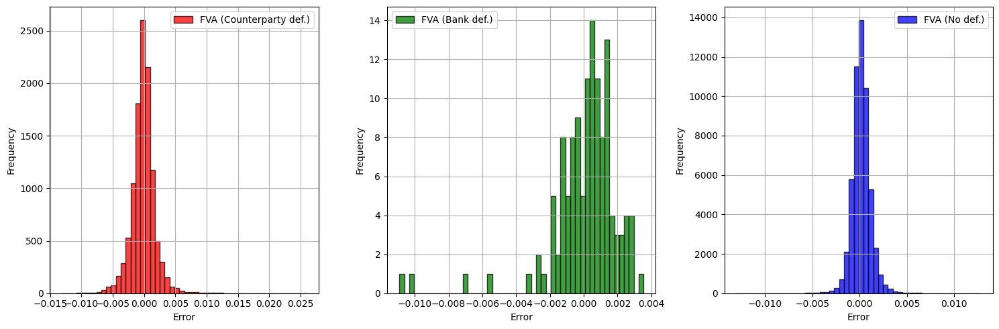

In [ ]:
# Compute terminal values of CVA
FVA_terminal = FVA[np.arange(len(tau_min)), tau_min]  # Shape: (4096,)


# Separate terminal errors by event type
errors_no_def = FVA_terminal[no_def_index]
errors_bank_def = FVA_terminal[bank_def_index]
errors_counterparty_def = FVA_terminal[counterparty_def_index]


print('No defaul: ', len(no_def_index)/M_eval, 'Counterparty defaults: ', len(counterparty_def_index)/M_eval, 'Bank Defaults: ', len(bank_def_index)/M_eval)
print('MSE no def.: ', np.mean(errors_no_def**2), 'MSE counterparty def.: ', np.mean(errors_counterparty_def**2), 'MSE bank def.: ', np.mean(errors_bank_def**2))


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), tight_layout=True)

# Subplot 1
axes[0].hist(errors_counterparty_def, bins=50, alpha=0.75, color='red', edgecolor='black', label='FVA (Counterparty def.)')
axes[0].set_xlabel('Error')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True)

# Subplot 2
axes[1].hist(errors_bank_def, bins=50, alpha=0.75, color='green', edgecolor='black', label='FVA (Bank def.)')
axes[1].set_xlabel('Error')
axes[1].set_ylabel('Frequency')
axes[1].legend()
axes[1].grid(True)

# Subplot 3
axes[2].hist(errors_no_def, bins=50, alpha=0.75, color='blue', edgecolor='black', label='FVA (No def.)')
axes[2].set_xlabel('Error')
axes[2].set_ylabel('Frequency')
axes[2].legend()
axes[2].grid(True)

plt.show()

# FVA - Store parameters

In [ ]:
### Saves locally ###

# Define the time steps extension
extension = "_200_m2"

# Create directories for weights and parameters if they don't exist
os.makedirs('path_to_weights', exist_ok=True)
os.makedirs('path_to_parameters', exist_ok=True)

# Save the weights with the time steps extension
weights_path = f'path_to_weights/FVA_model_weights{extension}.weights.h5'
FVA_model.save_weights(weights_path)


# Define the parameters to save
params_to_save = {
    'model_parameters_3': model_parameters_3,
    'portfolio_parameters_tf': portfolio_parameters_tf,
    'num_epochs': num_epochs,
    'batch_size': batch_size,
    'initial_lr': initial_lr,
    'neurons': neurons,
    'M_train': M_train,
    'N': N,
    'd_defaultable': d_defaultable,
    'T': T,
    't': t,
    'h': h,
    'r': r,
    'x0': x0,
    'sigma_defaultable': sigma_defaultable,
    'corr_matrix_defaultable': corr_matrix_defaultable,
    'L_defaultable': L_defaultable,
    'B1': B1,
    'B2': B2,
    'measures': measures,
    'b1': b1,
    'b2': b2,
    'ind_X': ind_X,
    'd_p': d_p,
    'P_Y': P_Y,
    'P_Z': P_Z,
    'K_p': K_p,
    'N_p': N_p,
    'T_p': T_p,
    'ind_Z': ind_Z,
    'MC_prices_0': MC_prices_0,
    'MC_prices': MC_prices
}

# Save the parameters with the time steps extension
parameters_path = f'path_to_parameters/MVA_parameters{extension}.pkl'
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save, f)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Define paths in Google Drive with the extension
weights_path = f'/content/drive/MyDrive/FVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/FVA_parameters{extension}.pkl'

# Save the weights to Google Drive
FVA_model.save_weights(weights_path)

# Function to convert TensorFlow tensors to NumPy arrays
def convert_tensors(obj):
    if isinstance(obj, tf.Tensor):
        return obj.numpy()
    elif isinstance(obj, list):
        return [convert_tensors(item) for item in obj]
    elif isinstance(obj, dict):
        return {key: convert_tensors(value) for key, value in obj.items()}
    else:
        return obj

# Convert TensorFlow tensors to NumPy arrays
params_to_save_converted = convert_tensors(params_to_save)

# Save the parameters to Google Drive
with open(parameters_path, 'wb') as f:
    pickle.dump(params_to_save_converted, f)

print(f"Weights saved to {weights_path}")
print(f"Parameters saved to {parameters_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Weights saved to /content/drive/MyDrive/FVA_model_weights_200_m2.weights.h5
Parameters saved to /content/drive/MyDrive/FVA_parameters_200_m2.pkl


# FVA - Load parameters

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pickle
import tensorflow as tf

# Define the extension for the file names
extension = "_200_m1"  # Use "" for old parameters without extensions, or "_200" for new ones

# Define paths using the extension
weights_path = f'/content/drive/MyDrive/FVA_model_weights{extension}.weights.h5'
parameters_path = f'/content/drive/MyDrive/FVA_parameters{extension}.pkl'

# Load the parameters
with open(parameters_path, 'rb') as f:
    params_loaded = pickle.load(f)

# Reconstruct necessary variables and model as before
model_parameters_3 = params_loaded['model_parameters_3']
portfolio_parameters_tf = params_loaded['portfolio_parameters_tf']
neurons = params_loaded['neurons']
N = params_loaded['N']
h = params_loaded['h']
d_defaultable = params_loaded['d_defaultable']
T = params_loaded['T']
t = params_loaded['t']
r = params_loaded['r']
sigma_defaultable = params_loaded['sigma_defaultable']
corr_matrix_defaultable = params_loaded['corr_matrix_defaultable']
L_defaultable = params_loaded['L_defaultable']
B1 = params_loaded['B1']
B2 = params_loaded['B2']
measures = params_loaded['measures']
b1 = params_loaded['b1']
b2 = params_loaded['b2']
batch_size = params_loaded['batch_size']
x0_tf = tf.convert_to_tensor(params_loaded['x0'], dtype=tf.float32)
M_train = params_loaded['M_train']
P_Y = params_loaded['P_Y']
P_Z = params_loaded['P_Z']
ind_X = params_loaded['ind_X']
ind_Z = params_loaded['ind_Z']
d_p = params_loaded['d_p']
K_p = params_loaded['K_p']
N_p = params_loaded['N_p']
T_p = params_loaded['T_p']
MC_prices_0 = params_loaded['MC_prices_0']
MC_prices = params_loaded['MC_prices']

model_3 = ModelClass(model_parameters_3)


# Instantiate the model
FVA_model = FullNetwork_FVA(
    N=N,
    h=h,
    dim_x=d_defaultable,
    dim_w=d_defaultable,
    portfolio_pars=portfolio_parameters_tf,
    neurons=neurons,
    activation='relu',
    use_batnorm=False,
    regu_cons=[0., 0.],
    ini_cons=None
)

# Initialize the model before loading weights
dummy_input = x0_tf[:batch_size, :]  # shape = [2048, d_defaultable], for example
_ = FVA_model(dummy_input)

# Load the weights from Google Drive
FVA_model.load_weights(weights_path)

print(f"Weights and parameters loaded successfully from {weights_path} and {parameters_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'sub_network_8', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 124, in error_handler
    del filtered_tb  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__
    return call_fn(*args, **kwargs)  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_u

Weights and parameters loaded successfully from /content/drive/MyDrive/FVA_model_weights_200_m1.weights.h5 and /content/drive/MyDrive/FVA_parameters_200_m1.pkl
